In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import re

In [2]:
data = pd.read_excel("Final Clinical outcome data 27.01.25.xlsx", sheet_name= "Final Clinical Data")

In [3]:
data.head()

,name_of_rrh,age,sex,hosp_48hrs,infect_site_Brain,infect_site_Lungs,infect_site_Gastro_intestil_tract,infect_site_Genito_uriry_tract,infect_site_Cardio_vascular,infect_site_Systemic,...,sec_cefoxtin2,complications,me_complic,treatment_outcome,diag_death,diagnosis_at_discharge,date_death,date_at_discharge,date_referral,length_hosp_stay
0,Arua,18.0,Male,Yes,No,No,No,No,No,No,...,NaN,Yes,Surgical Site Infection,Cured/recovered,NaN,Sepsis without septic shock,NaN,44972.0,NaN,0.0
1,Arua,17.0,Female,Yes,No,No,No,No,No,No,...,NaN,Yes,Peuperal Sepsis,Cured/recovered,NaN,Puerperal sepsis,NaN,45208.0,NaN,10.0
2,Arua,29.0,Male,Yes,No,No,No,No,No,No,...,NaN,No,NaN,Cured/recovered,NaN,Diabetic foot ulcer,NaN,45257.0,NaN,69.0
3,Arua,50.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,Died,Ludwig’s angi,NaN,2024-03-11T00:00:00Z,NaN,NaN,5.0
4,Arua,30.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,Clinical improvement / Recovering,NaN,"Fracture of femur, unspecified, Open wound of ...",NaN,45251.0,NaN,45.0


## Data analysis 1

In [4]:
data1 = pd.read_excel("Final Clinical outcome data 20.01.25.xlsx", sheet_name= "Clinical Data ML")

In [5]:
data1['length_hosp_stay'].describe()

count    596.000000
mean      22.578859
std       39.681067
min        0.000000
25%        6.000000
50%       14.000000
75%       27.000000
max      744.000000
Name: length_hosp_stay, dtype: float64

/tmp/ipykernel_3736/2837314544.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=specimen_counts.index, y=specimen_counts.values, palette = 'tab20')


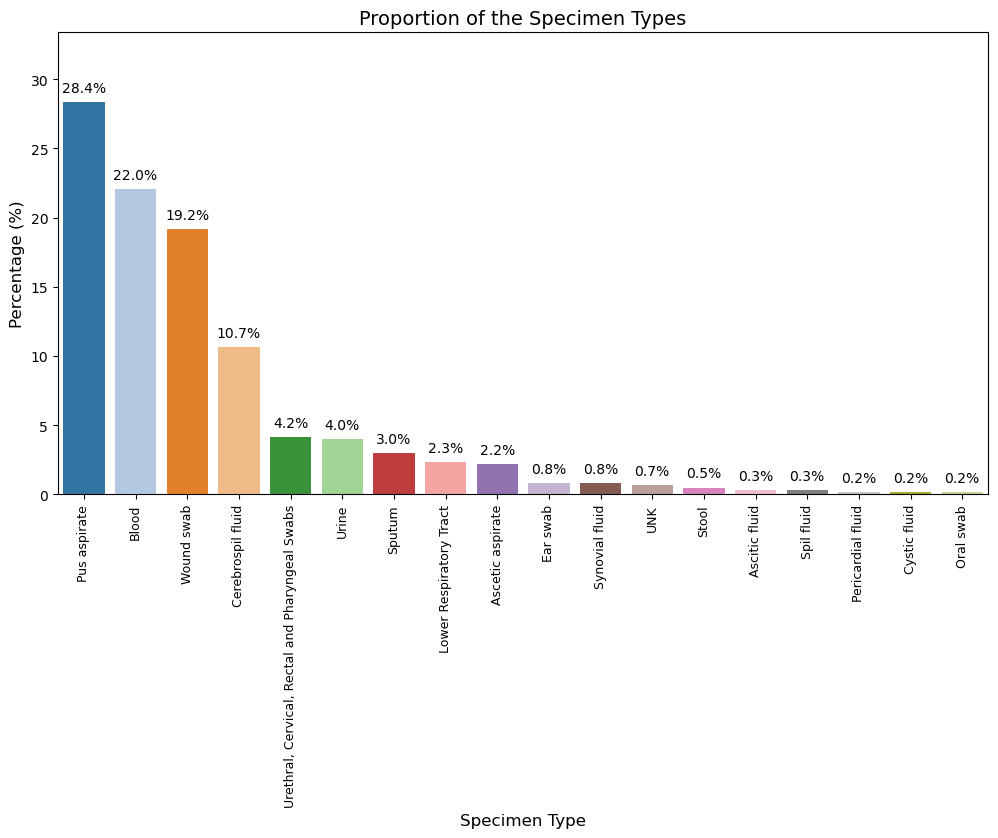

In [6]:
# Calculate percentages
specimen_counts = data1['specimen_type'].value_counts(normalize=True) * 100  

# Set figure size
plt.figure(figsize=(12, 6))  

# Plot
ax = sns.barplot(x=specimen_counts.index, y=specimen_counts.values, palette = 'tab20')

# Title and labels
plt.title('Proportion of the Specimen Types', fontsize=14)
plt.xlabel('Specimen Type', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xticks(rotation=90, fontsize=9)  # Rotate labels for better readability

# Show percentage values on bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{height:.1f}%", (p.get_x() + p.get_width() / 2., height),  
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.ylim(0, max(specimen_counts.values) + 5)  # Adjust y-axis limit for better spacing
plt.show()


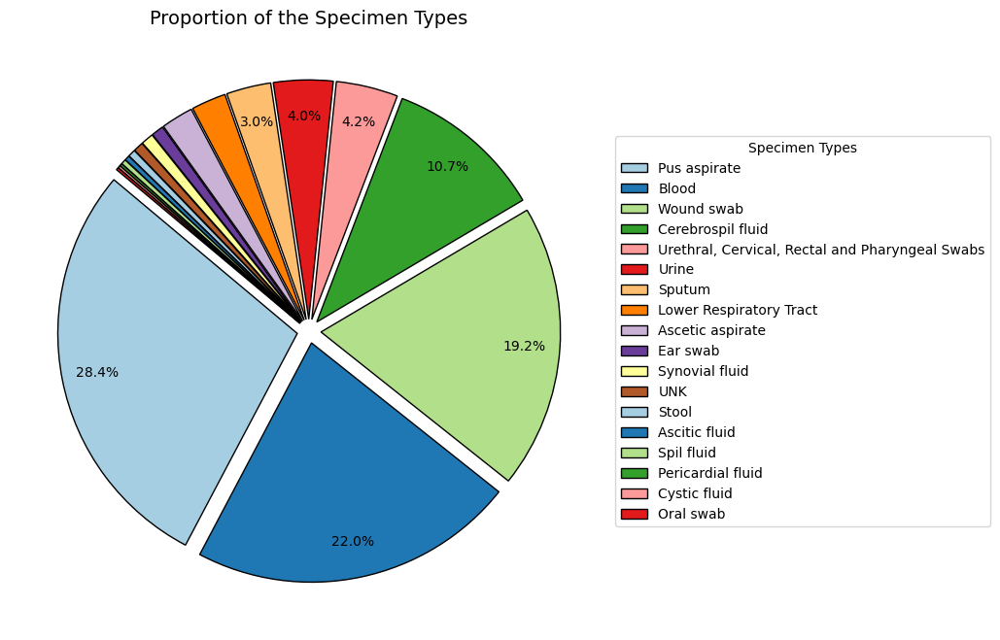

In [7]:
import matplotlib.pyplot as plt

# Calculate percentages
specimen_counts = data1['specimen_type'].value_counts(normalize=True) * 100  

# Set figure size
plt.figure(figsize=(8, 8))  

# Define colors and explode effect
colors = plt.cm.Paired.colors  
explode = [0.05] * len(specimen_counts)  

# Function to hide small percentages
def autopct_func(pct):
    return f'{pct:.1f}%' if pct > 3 else ''  # Hide labels for slices <3%

# Plot
wedges, texts, autotexts = plt.pie(
    specimen_counts.values, labels=None, autopct=autopct_func,  
    colors=colors, startangle=140, pctdistance=0.85, labeldistance=1.1,
    explode=explode, wedgeprops={'edgecolor': 'black'}
)

# Add legend
plt.legend(wedges, specimen_counts.index, title="Specimen Types", loc="center left", bbox_to_anchor=(1, 0.5))

# Title
plt.title('Proportion of the Specimen Types', fontsize=14)

# Show the plot
plt.show()


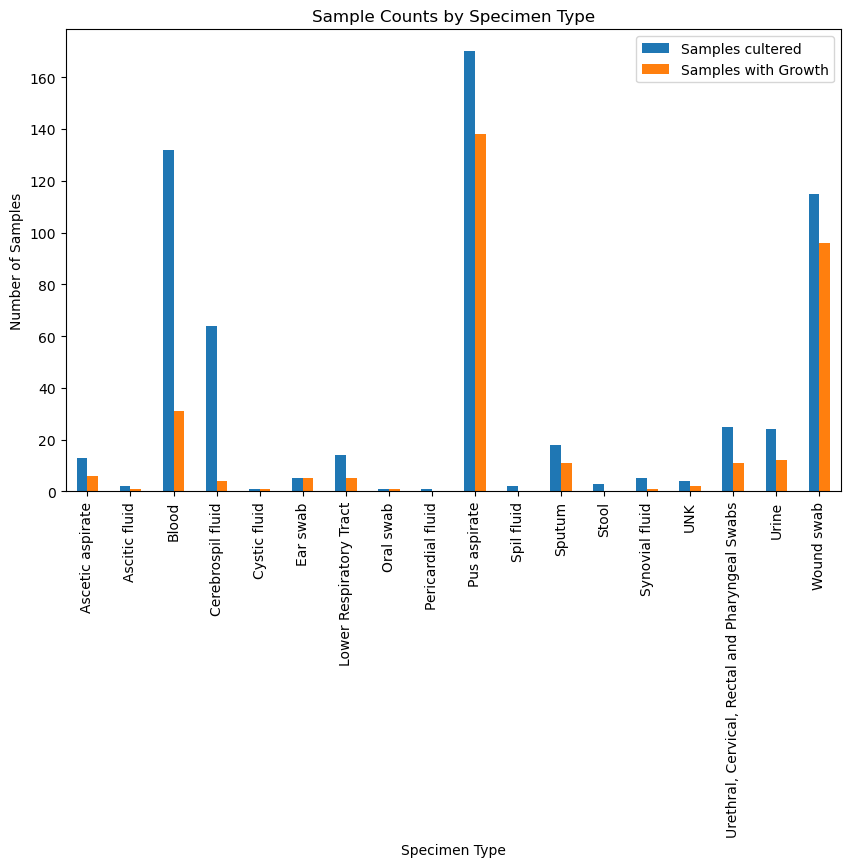

In [8]:
total_samples = data1.groupby('specimen_type').size()

growth_counts = data1[data1['growth1'] == 'Yes'].groupby('specimen_type').size()

df_counts = pd.DataFrame({'Samples cultered': total_samples, 
                         'Samples with Growth': growth_counts})

df_counts.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Specimen Type')
plt.ylabel('Number of Samples')
plt.title('Sample Counts by Specimen Type')

# # Add count values on top of the bars
# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
#                 ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize = 6)


plt.legend() 
plt.show()

/tmp/ipykernel_3736/1311521979.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax =sns.barplot(x= ward_count.index, y = ward_count.values, palette = 'Set3')


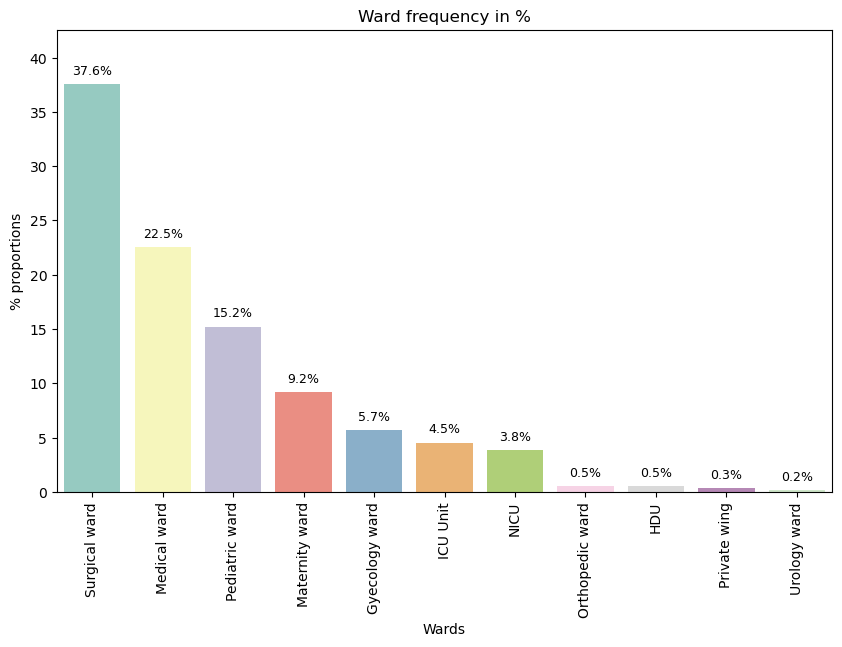

In [9]:
ward_count = data1['ward'].value_counts(normalize=True) * 100

plt.figure(figsize= (10, 6))

ax =sns.barplot(x= ward_count.index, y = ward_count.values, palette = 'Set3')

plt.title('Ward frequency in %')
plt.xlabel('Wards')
plt.ylabel('% proportions')
plt.xticks(rotation = 90, fontsize = 10)

for p in ax.patches:  # Loop through each bar (patch) in the plot
    height = p.get_height()  # Get the height (value) of the bar
    
    ax.annotate(f"{height:.1f}%",  # Format height as a percentage with 1 decimal place
                (p.get_x() + p.get_width() / 2., height),  # Set annotation position
                ha='center', va='bottom',  # Center the text horizontally and place it just above the bar
                xytext=(0, 5), textcoords='offset points',  # Move text 5 points above the bar
                fontsize=9)  # Set font size for readability
    
plt.ylim(0, max(ward_count.values)+ 5)
plt.show()

/tmp/ipykernel_3736/452469193.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x = path_count.index, y=path_count.values, palette = 'tab20')


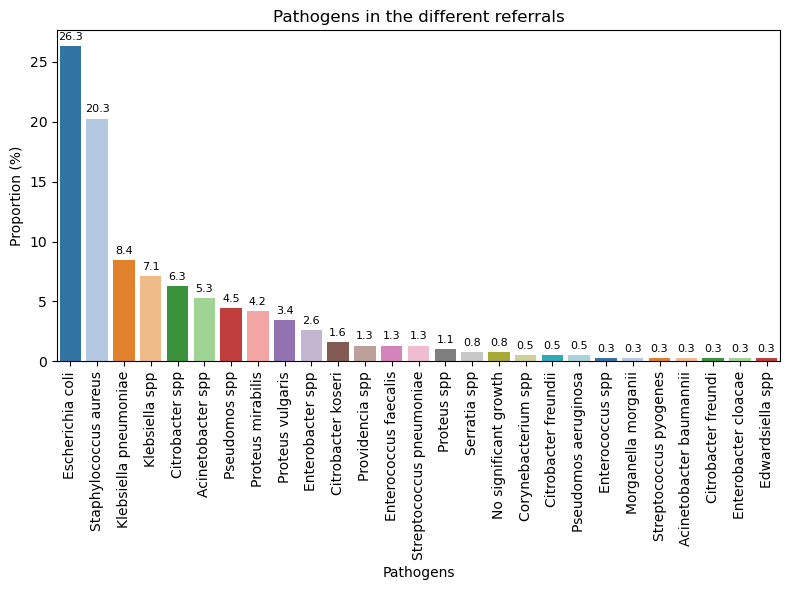

In [10]:
path = pd.concat([data['first_organism'], data['sec_organism'], data['third_organism']]).dropna()

pathogens = pd.DataFrame({'Pathogen': path})  

path_count = pathogens['Pathogen'].value_counts(normalize= True) * 100

plt.figure(figsize=(8, 6))
ax = sns.barplot(x = path_count.index, y=path_count.values, palette = 'tab20') 

plt.title("Pathogens in the different referrals")
plt.xlabel("Pathogens")
plt.ylabel("Proportion (%)")
plt.xticks(rotation = 90, fontsize = 10)

for p in ax.patches:  # Loop through each bar (patch) in the plot
    height = p.get_height()  # Get the height (value) of the bar
    
    ax.annotate(f"{height:.1f}",  # Format height as a percentage with 1 decimal place
                (p.get_x() + p.get_width() / 2., height),  # Set annotation position
                ha='center', va='bottom',  # Center the text horizontally and place it just above the bar
                xytext=(0, 3), textcoords='offset points',  # Move text 5 points above the bar
                fontsize=8)  # Set font size for readability
    

plt.tight_layout()
plt.show()

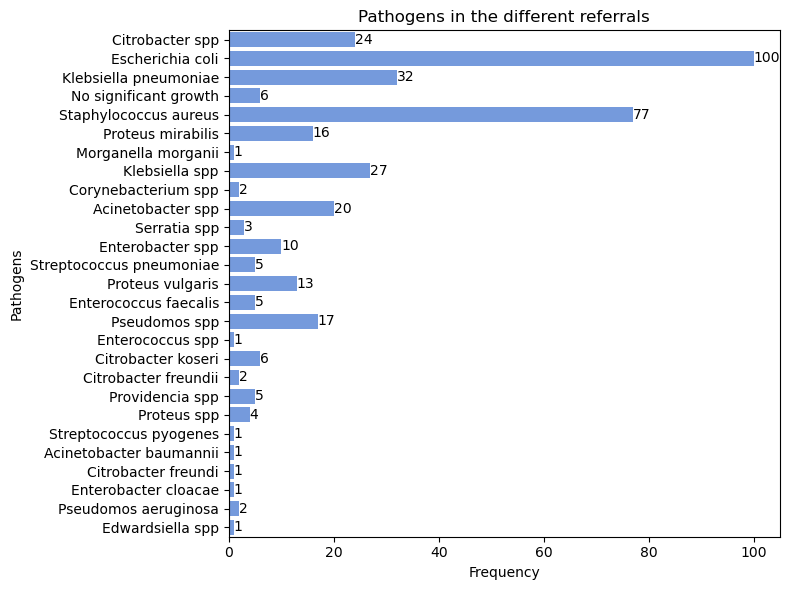

In [11]:
path = pd.concat([data1['first_organism'], data['sec_organism'], data['third_organism']]).dropna()

pathogens = pd.DataFrame({'Pathogen': path})  

plt.figure(figsize=(8, 6))
ax = sns.countplot(data=pathogens, y='Pathogen', color="cornflowerblue") 
ax.bar_label(ax.containers[0], fontsize=10)

plt.title("Pathogens in the different referrals")
plt.ylabel("Pathogens")
plt.xlabel("Frequency")
plt.tight_layout()
plt.show()

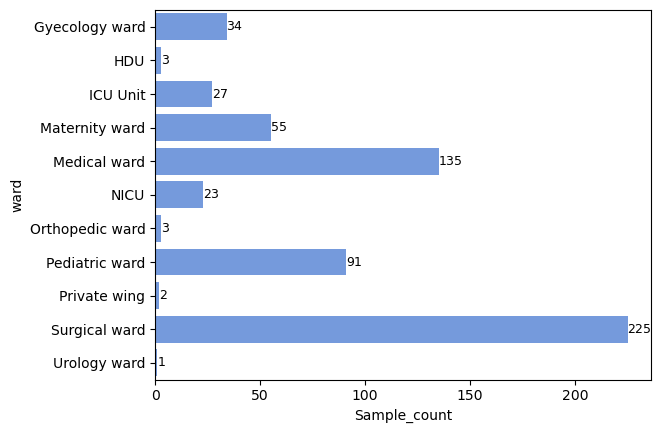

In [12]:
# samples collected per ward

total_samples_ward = data1.groupby('ward').size()

sample_wards = pd.DataFrame({'Wards' : total_samples_ward, 'Sample_count': total_samples_ward.values})

sample_wards.columns

ax =sns.barplot(sample_wards, y = 'ward', x = 'Sample_count', color = 'cornflowerblue')

ax.bar_label(ax.containers[0], fontsize = 9)

plt.show()    

<Axes: xlabel='length_hosp_stay', ylabel='Count'>

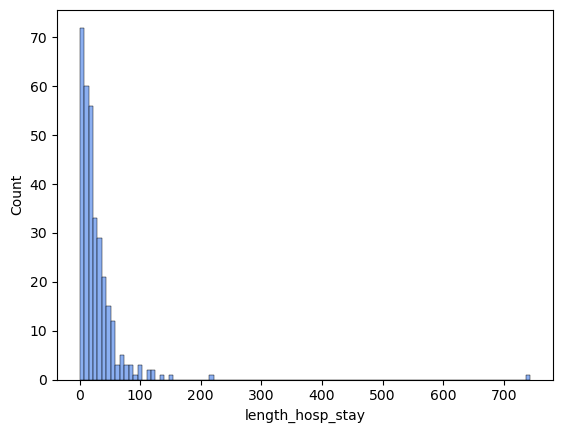

In [13]:
no_growth = data1[data1['growth1'] == 'No']

growth = data1[data1['growth1'] == 'Yes']

sns.histplot(growth, x = 'length_hosp_stay', color= 'cornflowerblue')

## Data analysis

In [14]:
data.describe()

,age,organism_isolated,first_oxacillin,first_tigecycline,first_ampicillin_Tazobactam,sec_nitrofurantoin,sec_azithromycin,sec_polymyxin_ b,date_antib_admin,missed_amoxicillin,...,missed_meropenem,missed_gentamicin,missed_cefepime,missed_imip,missed_amikacin,missed_vanco,missed_ampicillin/cloxacillin,num_organis,date_at_discharge,length_hosp_stay
count,314.000000,315.000000,0.0,0.0,0.0,0.0,0.0,0.0,99,2.0,...,3.0,6.0,1.0,7.0,6.0,1.0,1.0,5.000000,263.000000,314.000000
mean,32.589172,1.206349,NaN,NaN,NaN,NaN,NaN,NaN,2023-10-04 07:16:21.818181888,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.400000,45229.555133,28.369427
min,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,2022-09-12 00:00:00,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,44657.000000,0.000000
25%,18.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,2023-07-04 12:00:00,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,45118.500000,9.000000
50%,31.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,2023-11-08 00:00:00,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,45260.000000,18.500000
75%,48.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,2024-01-17 00:00:00,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.000000,45339.500000,35.000000
max,95.000000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,2024-04-12 00:00:00,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.000000,45644.000000,744.000000
std,22.523825,0.435624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,0.0,0.0,NaN,0.0,0.0,NaN,NaN,0.547723,143.649289,48.478813


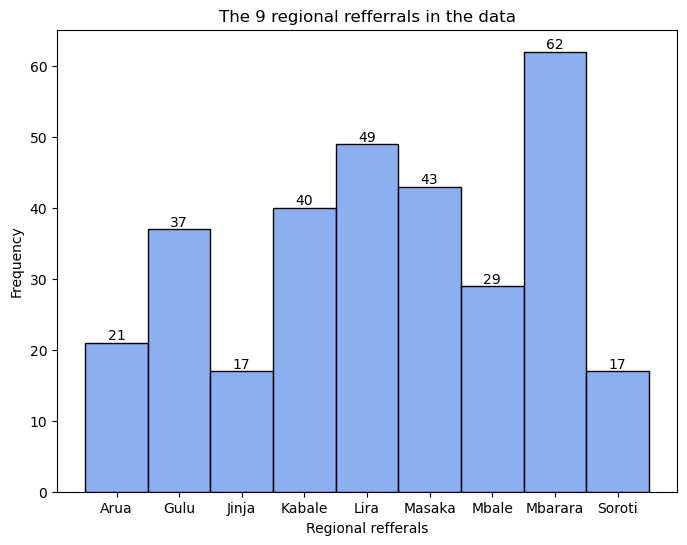

In [15]:
plt.figure(figsize=(8 , 6))

ax = sns.histplot(data, x =  "name_of_rrh", stat="count", color= "cornflowerblue")
ax.bar_label(ax.containers[0], fontsize = 10)

plt.title("The 9 regional refferrals in the data")
plt.xlabel("Regional refferals")
plt.ylabel("Frequency")
plt.show()

Text(0, 0.5, 'Frequency')

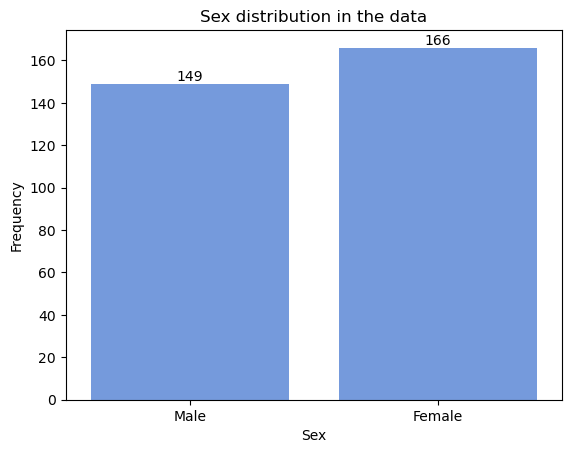

In [16]:
ax =sns.countplot(data , x="sex", color="cornflowerblue")
ax.bar_label(ax.containers[0], fontsize = 10)
plt.title("Sex distribution in the data")
plt.xlabel("Sex")
plt.ylabel("Frequency")


<Axes: xlabel='length_hosp_stay', ylabel='Count'>

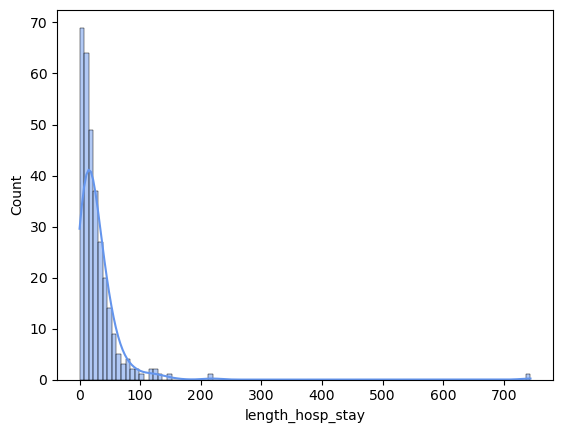

In [17]:
sns.histplot(data, x= 'length_hosp_stay', color = 'cornflowerblue', kde = True)

Text(0.5, 1.0, 'Gender distribution across the different sites')

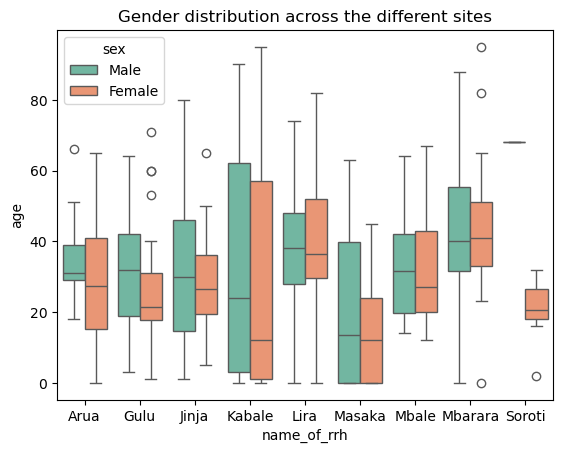

In [18]:
sns.boxplot(data, x = 'name_of_rrh', y ='age', hue = 'sex', palette = 'Set2')

plt.title('Gender distribution across the different sites')

<Axes: xlabel='name_of_rrh', ylabel='length_hosp_stay'>

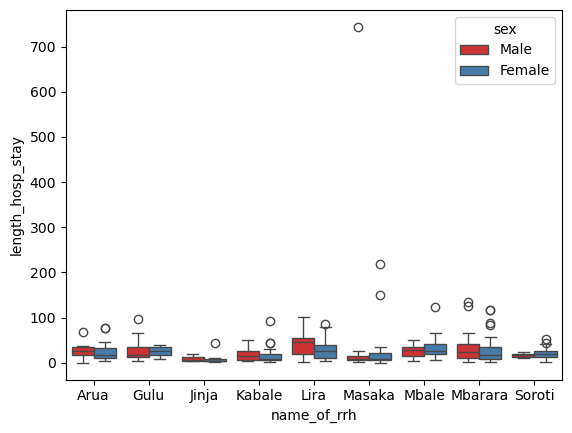

In [19]:
sns.boxplot(data, x= 'name_of_rrh', y = 'length_hosp_stay', hue ='sex', palette = 'Set1')

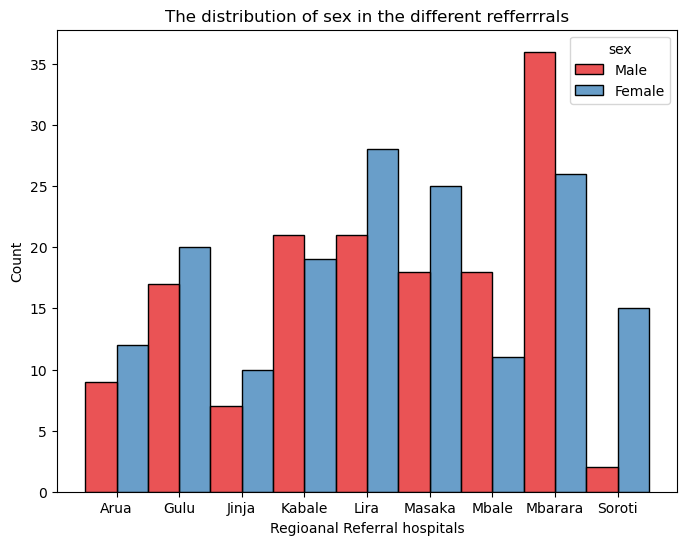

In [20]:
plt.figure(figsize=(8,6))
sns.histplot(data, x= "name_of_rrh",  hue = "sex", palette="Set1", multiple="dodge")

plt.title("The distribution of sex in the different refferrrals")
plt.xlabel("Regioanal Referral hospitals")
plt.show()

In [21]:
print(max(data["length_hosp_stay"]))

744.0


In [22]:
print(min(data["length_hosp_stay"]))

0.0


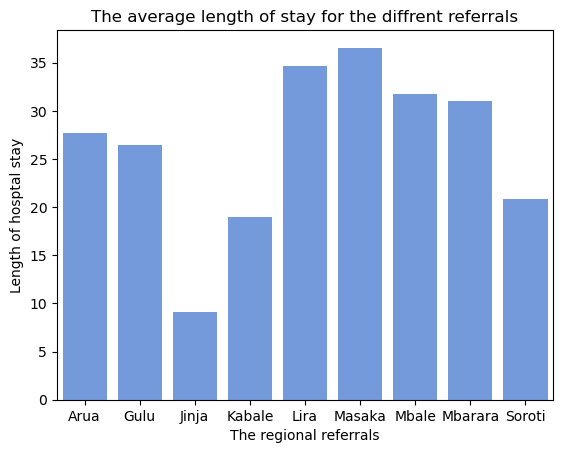

In [23]:
sns.barplot(data , y= "length_hosp_stay", x = "name_of_rrh", estimator="mean", color="cornflowerblue", errorbar=None)

plt.title("The average length of stay for the diffrent referrals")
plt.xlabel("The regional referrals")
plt.ylabel("Length of hosptal stay")
plt.show()

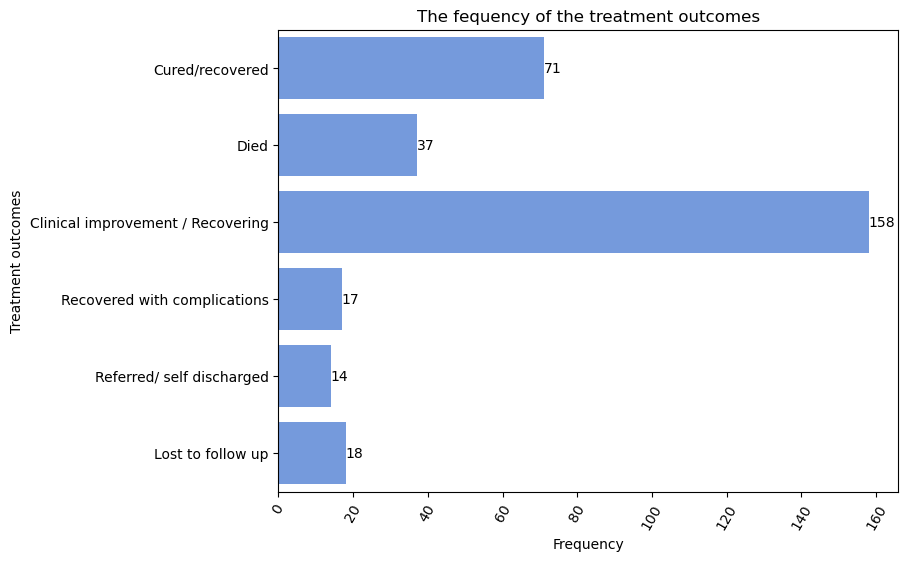

In [24]:
plt.figure(figsize=(8, 6))

ax =sns.countplot(data, y= "treatment_outcome",  color = "cornflowerblue")
ax.bar_label(ax.containers[0], fontsize=10)

plt.title("The fequency of the treatment outcomes")
plt.ylabel("Treatment outcomes")
plt.xlabel("Frequency")
plt.xticks(rotation = 60)
plt.show()

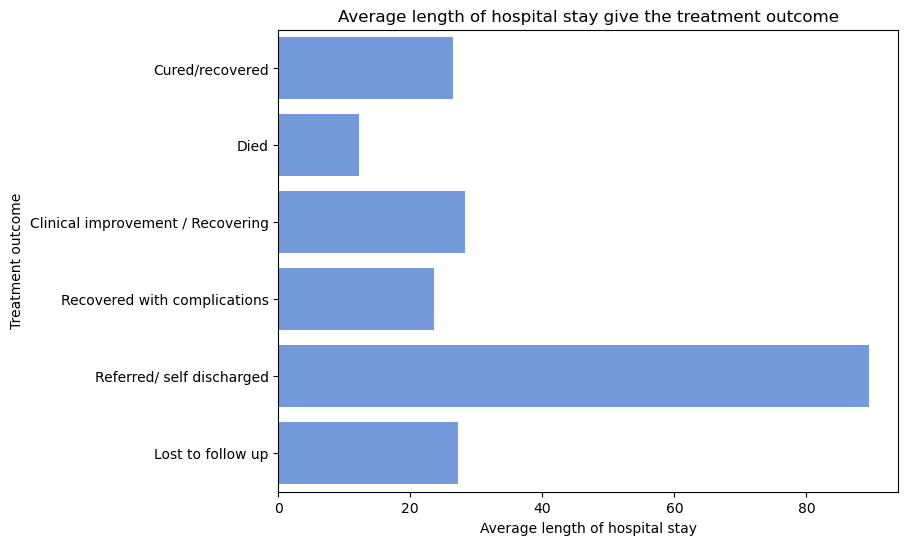

In [25]:
plt.figure(figsize=(8,6))

sns.barplot(data,y= "treatment_outcome", x="length_hosp_stay", estimator="mean", color="cornflowerblue", errorbar=None)

plt.title("Average length of hospital stay give the treatment outcome")
plt.xlabel("Average length of hospital stay")
plt.ylabel("Treatment outcome")
plt.show()

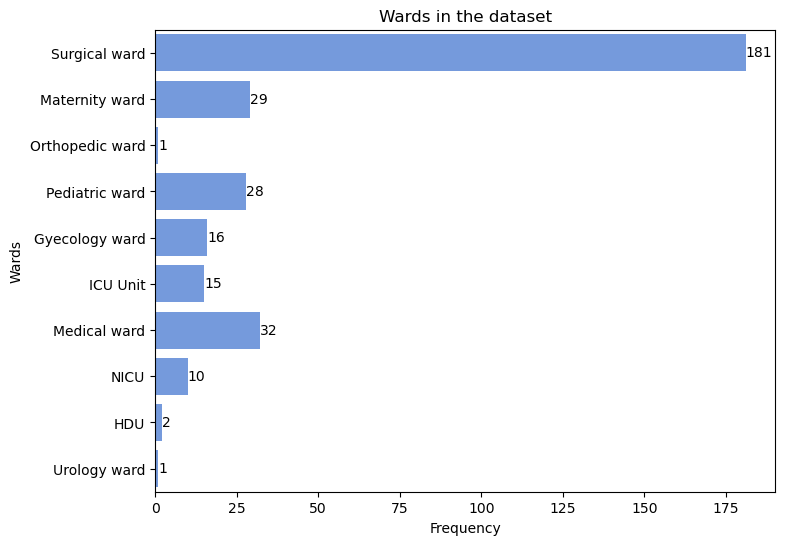

In [26]:
plt.figure(figsize=(8,6))

ax = sns.countplot(data, y ="ward", color= "cornflowerblue")
ax.bar_label(ax.containers[0], fontsize=10)

plt.title("Wards in the dataset")
plt.ylabel("Wards")
plt.xlabel("Frequency")
plt.show()

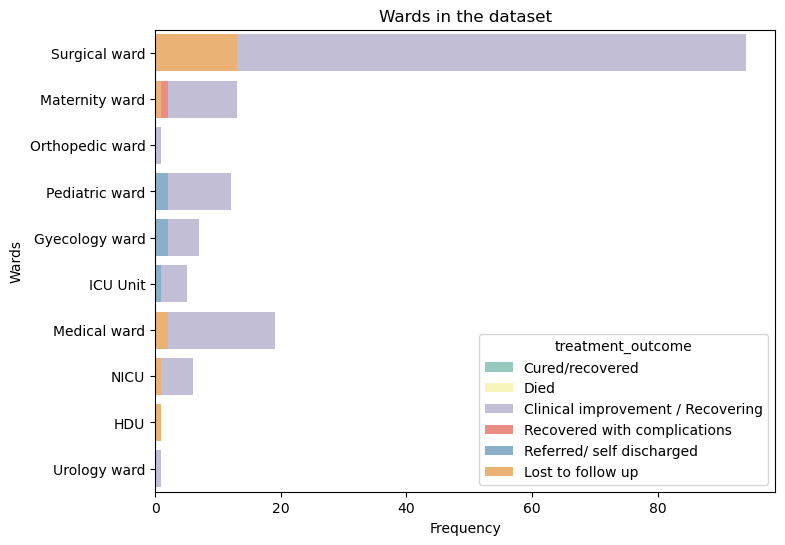

In [27]:
plt.figure(figsize=(8,6))

sns.countplot(data, hue ="treatment_outcome", y = "ward"  ,palette= "Set3", dodge = False)

plt.title("Wards in the dataset")
plt.ylabel("Wards")
plt.xlabel("Frequency")
plt.show()

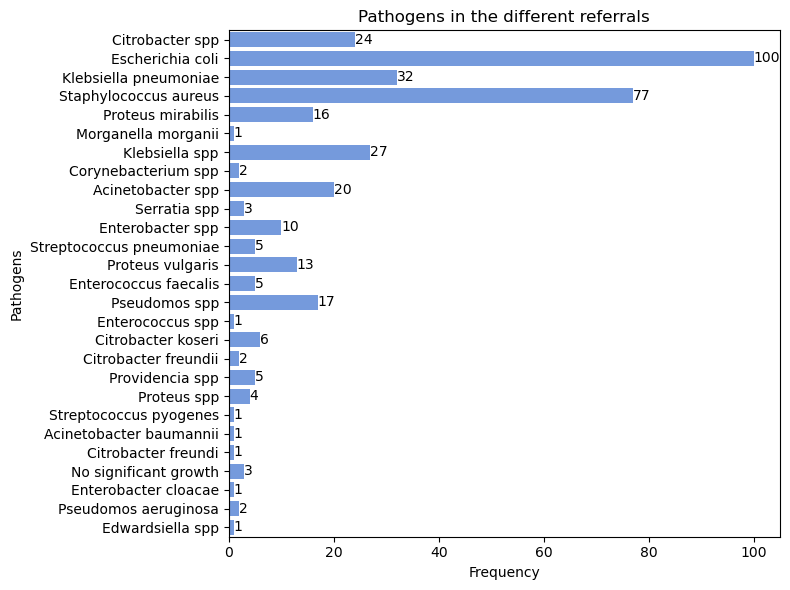

In [28]:
path = pd.concat([data['first_organism'], data['sec_organism'], data['third_organism']]).dropna()

pathogens = pd.DataFrame({'Pathogen': path})  

plt.figure(figsize=(8, 6))
ax = sns.countplot(data=pathogens, y='Pathogen', color="cornflowerblue") 
ax.bar_label(ax.containers[0], fontsize=10)

plt.title("Pathogens in the different referrals")
plt.ylabel("Pathogens")
plt.xlabel("Frequency")
plt.tight_layout()
plt.show()

In [29]:
data.loc[data['specimen_type'] == 'Cerebrospil fluid', 'specimen_type'] = 'Cerebrospinal Fluid'

Text(0.5, 0, 'Frequency')

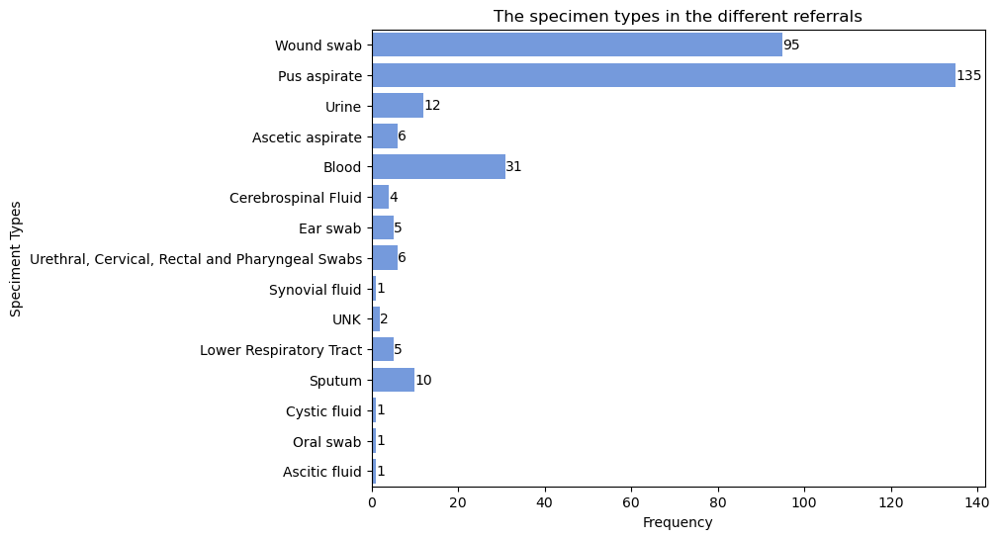

In [30]:
plt.figure(figsize = (8,6))

ax = sns.countplot(data, y='specimen_type', color="cornflowerblue")
ax.bar_label(ax.containers[0], fontsize=10)

plt.title("The specimen types in the different referrals")
plt.ylabel("Speciment Types")
plt.xlabel("Frequency")

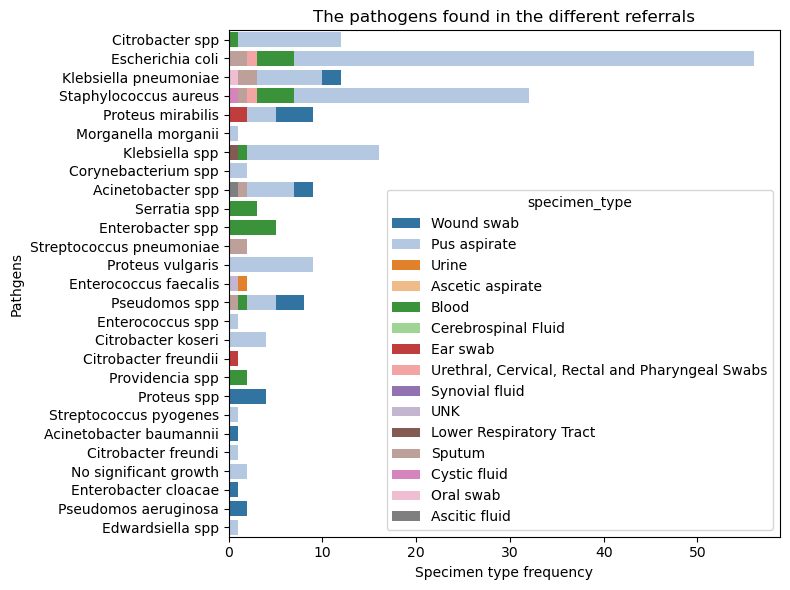

In [31]:
plt.figure(figsize=(8,6))

pathogen_melted = pd.melt(data, 
                          id_vars=['specimen_type'],  
                          value_vars=['first_organism', 'sec_organism', 'third_organism'], 
                          value_name='Pathogen') 

# Drop missing values
pathogen_melted.dropna(inplace=True)


sns.countplot(pathogen_melted, y= "Pathogen", hue="specimen_type", color = "cornflowerblue", palette="tab20", dodge = False)

plt.title("The pathogens found in the different referrals")
plt.xlabel("Specimen type frequency")
plt.ylabel("Pathgens")
plt.tight_layout()

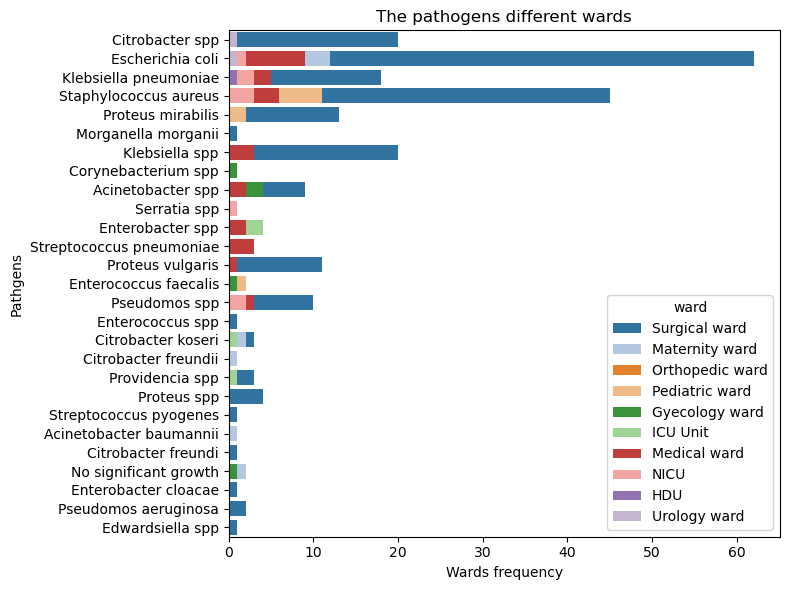

In [32]:
plt.figure(figsize=(8,6))

pathogen_melted = pd.melt(data, 
                          id_vars=['ward'],  
                          value_vars=['first_organism', 'sec_organism', 'third_organism'], 
                          value_name='Pathogen') 

# Drop missing valuesfirs_rep_organis', 'sec_rep_organis'
pathogen_melted.dropna(inplace=True)


sns.countplot(pathogen_melted, y= "Pathogen", hue="ward", color = "cornflowerblue", palette="tab20", dodge = False)

plt.title("The pathogens different wards")
plt.xlabel("Wards frequency")
plt.ylabel("Pathgens")
plt.tight_layout()

<Figure size 800x600 with 0 Axes>

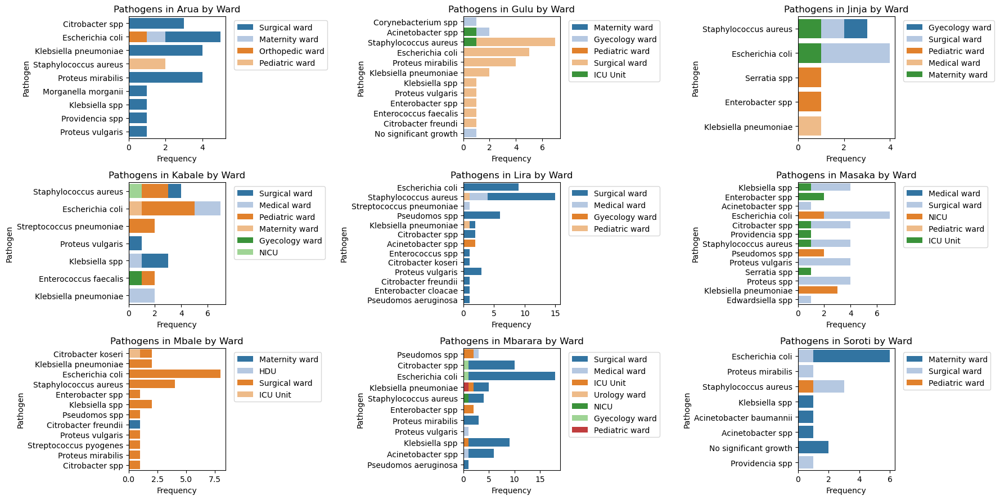

In [33]:
plt.figure(figsize=(8,6))

path = pd.melt(data, 
                          id_vars=['ward', "name_of_rrh"],  
                          value_vars=['first_organism', 'sec_organism', 'third_organism'], 
                          value_name='Pathogen') 

# Drop missing values
path.dropna(inplace=True)

# Get the number of RRHs (assuming you want plots for all)
rrhs = path['name_of_rrh'].unique()
num_rows = (len(rrhs) + 1) // 3  # Integer division for ceiling

# Create subplots with 2 columns (2 plots per row)
fig, axes = plt.subplots(num_rows, 3, figsize=(18, 3*num_rows))  # Adjust figure size as needed

# Iterate over RRHs and create plots
plot_count = 0
for i in range(num_rows):
    for j in range(3):
        if plot_count == len(rrhs):
            break  # No more RRHs to plot
        rrh = rrhs[plot_count]
        path_rrh = path[path['name_of_rrh'] == rrh]
        sns.countplot(data=path_rrh, y="Pathogen", hue="ward", palette="tab20", dodge=False, ax=axes[i, j])
        axes[i, j].set_title(f"Pathogens in {rrh} by Ward")
        axes[i, j].set_xlabel("Frequency")
        axes[i, j].set_ylabel("Pathogen")
        axes[i, j].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plot_count += 1

# Adjust layout (optional)
plt.tight_layout()


Text(0.5, 1.0, 'Number of patients prescribed to antibiotocs')

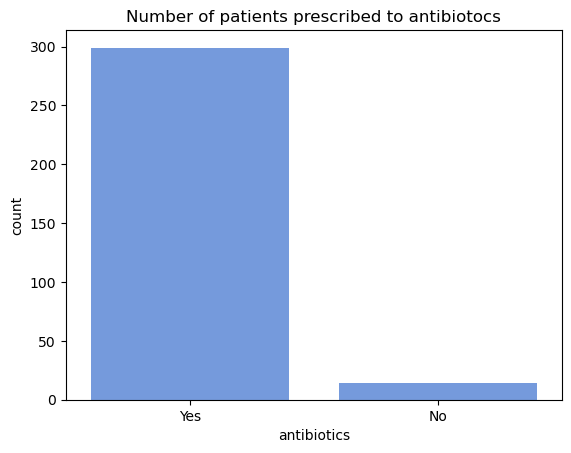

In [34]:
sns.countplot(data, x= "antibiotics", color="cornflowerblue")

plt.title("Number of patients prescribed to antibiotocs")

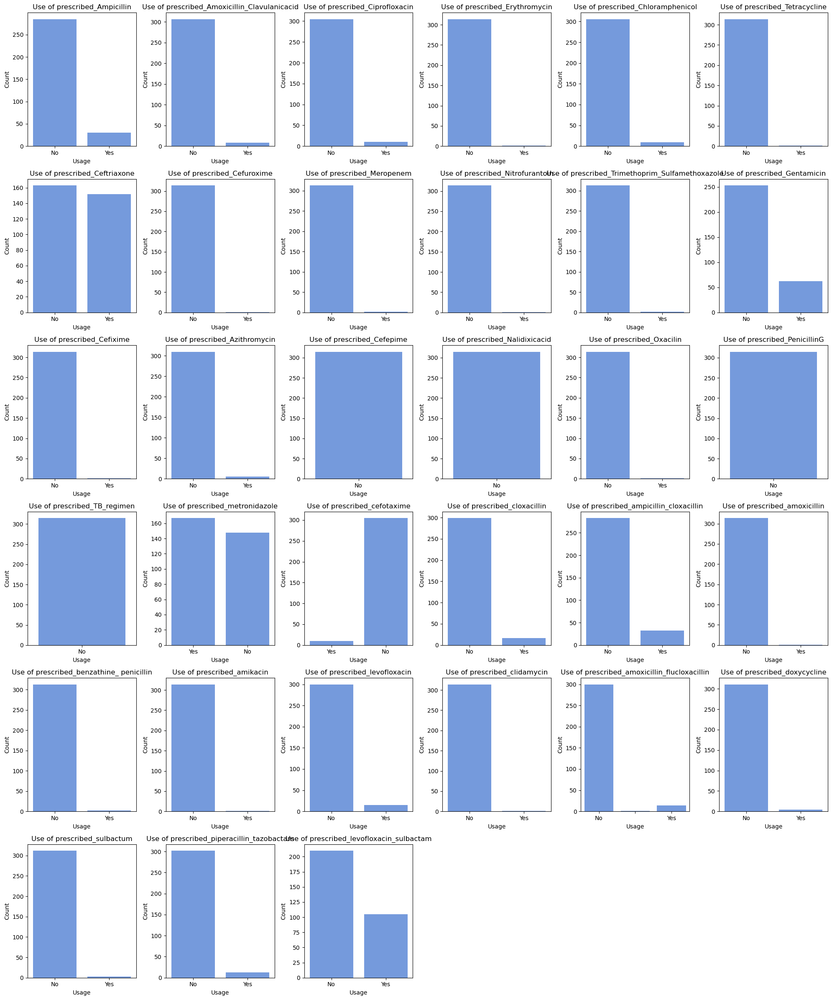

In [35]:
# Nnames of the antibiotic columns
antibiotic_cols = [col for col in data.columns if col.startswith('antibiotics_')]

# Subplots
num_cols = 6  
num_rows = (len(antibiotic_cols) + num_cols - 1) // num_cols 

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows))

# Flatten axes for easier indexing
axes = axes.flatten()

# Create countplots for each antibiotic
for i, antibiotic in enumerate(antibiotic_cols):
    sns.countplot(data=data, x=antibiotic, ax=axes[i], color="cornflowerblue")
    axes[i].set_title(f"Use of {antibiotic.replace('antibiotics_', '')}") 
    axes[i].set_xlabel("Usage")
    axes[i].set_ylabel("Count")

# Hide any extra subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()

plt.show()

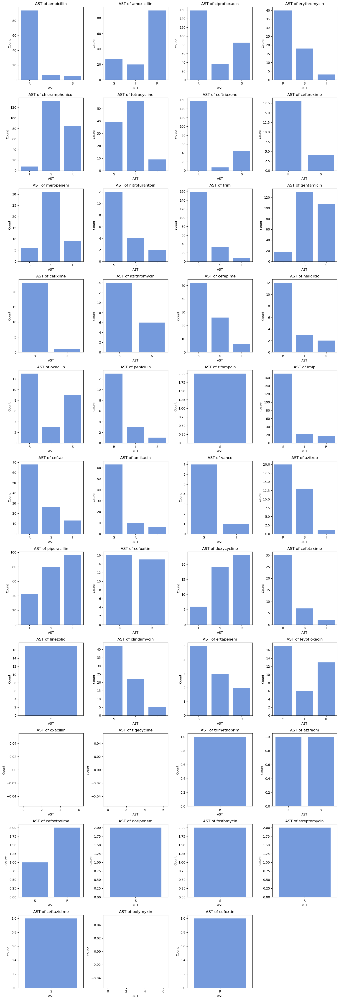

In [36]:
data1 = data.drop(columns = ['first_pathogen','first_organism', 'sec_organism', 'third_organism', 'firs_rep_organis', 'sec_rep_organis'], axis =1)

# Get antibiotic columns
antibiotic_cols = [col for col in data1.columns if col.startswith(('first_', 'sec_', 'third_'))]

# Create a dictionary to map similar antibiotics to a common name
antibiotic_mapping = {}
for col in antibiotic_cols:
    match = re.match(r"(first_|sec_|third_)([a-zA-Z]+)", col)
    if match:
        antibiotic_name = match.group(2)
        antibiotic_mapping[col] = antibiotic_name

# Melt the DataFrame
melted_data = pd.melt(data1, id_vars=['name_of_rrh', 'ward'], value_vars=antibiotic_cols, var_name='original_antibiotic', value_name='Usage')

# Replace original antibiotic names with common names
melted_data['Antibiotic'] = melted_data['original_antibiotic'].map(antibiotic_mapping)

# Drop rows where antibiotic is None (if any original column names didn't match the regex)
melted_data.dropna(subset=['Antibiotic'], inplace=True)

# Create countplots
antibiotics = melted_data['Antibiotic'].unique()
num_cols = 4
num_rows = (len(antibiotics) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))
axes = axes.flatten()

for i, antibiotic in enumerate(antibiotics):
    antibiotic_data = melted_data[melted_data['Antibiotic'] == antibiotic]
    sns.countplot(data=antibiotic_data, x='Usage', ax=axes[i], color="cornflowerblue")
    axes[i].set_title(f"AST of {antibiotic}")
    axes[i].set_xlabel("AST")
    axes[i].set_ylabel("Count")

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


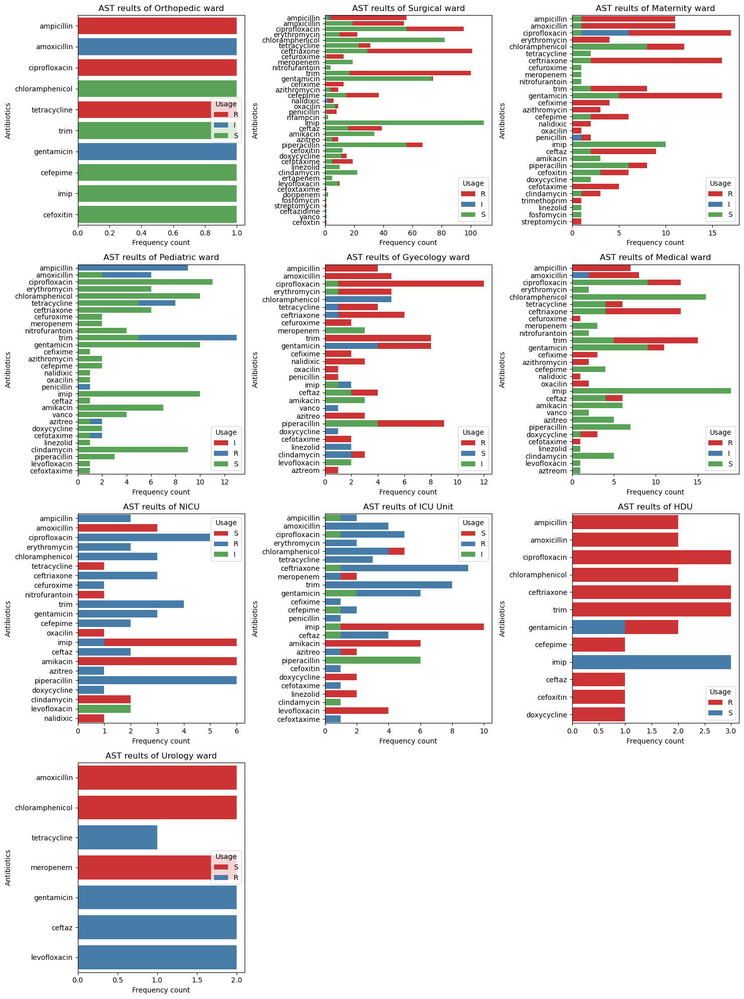

In [37]:

data1 = data.drop(columns = ['first_pathogen','first_organism', 'sec_organism', 'third_organism', 'firs_rep_organis', 'sec_rep_organis'], axis =1)

# Get antibiotic columns
antibiotic_cols = [col for col in data1.columns if col.startswith(('first_', 'sec_', 'third_'))]

# Create a dictionary to map similar antibiotics to a common name
antibiotic_mapping = {}
for col in antibiotic_cols:
    match = re.match(r"(first_|sec_|third_)([a-zA-Z]+)", col)
    if match:
        antibiotic_name = match.group(2)
        antibiotic_mapping[col] = antibiotic_name

# Melt the DataFrame
melted_data1 = pd.melt(data1, id_vars= 'ward', value_vars=antibiotic_cols, var_name='original_antibiotic', value_name='Usage')

# Replace original antibiotic names with common names
melted_data1['Antibiotic'] = melted_data1['original_antibiotic'].map(antibiotic_mapping)

# Drop rows where antibiotic is None (if any original column names didn't match the regex)
# melted_data.dropna(subset=['ward'], inplace=True)
melted_data1.dropna(subset=['Usage'], inplace=True)

# Create countplots
wards = melted_data1['ward'].unique()
num_cols = 3
num_rows = (len(wards) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()

for i, ward in enumerate(wards):
    antibiotic_data = melted_data1[melted_data1['ward'] == ward]
    sns.countplot(data=antibiotic_data, y='Antibiotic', ax=axes[i], hue = 'Usage', palette="Set1", dodge = False)
    axes[i].set_title(f"AST reults of {ward}")
    axes[i].set_xlabel("Frequency count")
    axes[i].set_ylabel("Antibiotics")

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

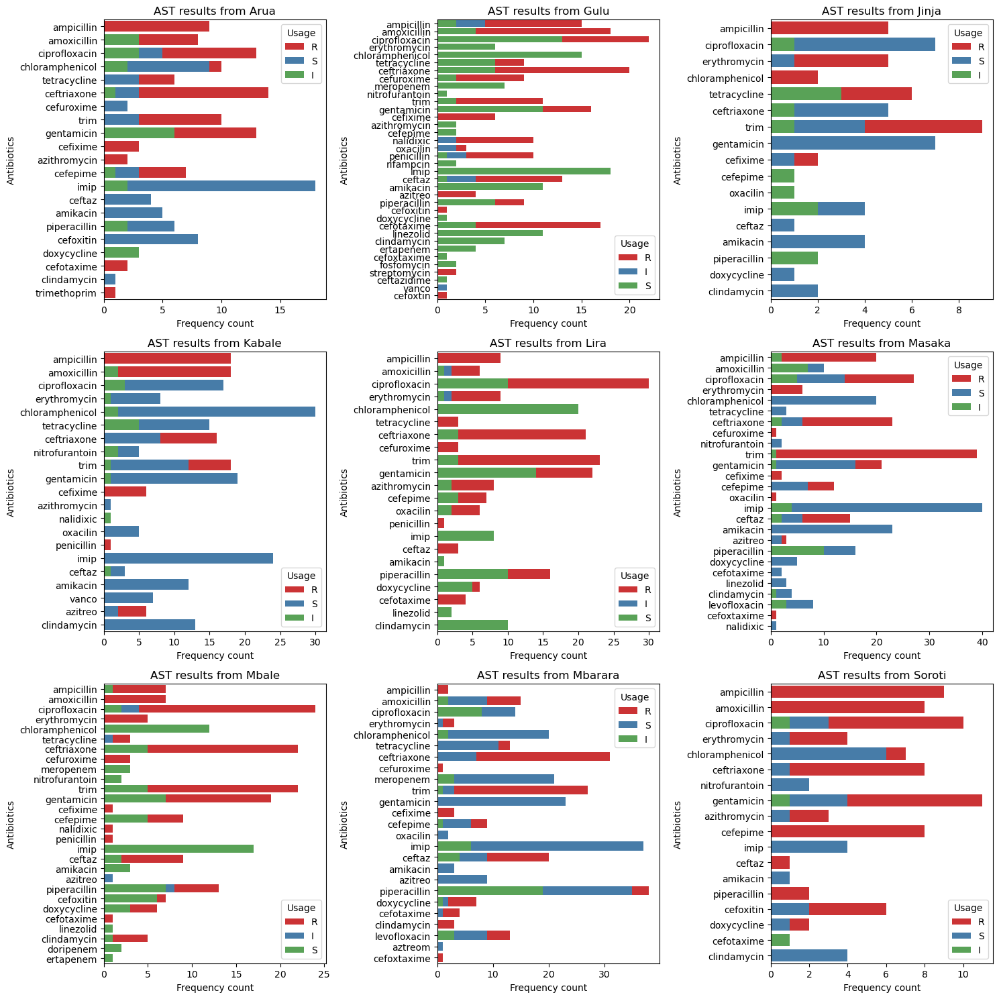

In [38]:

data1 = data.drop(columns = ['first_pathogen','first_organism', 'sec_organism', 'third_organism', 'firs_rep_organis', 'sec_rep_organis'], axis =1)

# Get antibiotic columns
antibiotic_cols = [col for col in data1.columns if col.startswith(('first_', 'sec_', 'third_'))]

# Create a dictionary to map similar antibiotics to a common name
antibiotic_mapping = {}
for col in antibiotic_cols:
    match = re.match(r"(first_|sec_|third_)([a-zA-Z]+)", col)
    if match:
        antibiotic_name = match.group(2)
        antibiotic_mapping[col] = antibiotic_name

# Melt the DataFrame
melted_data2 = pd.melt(data1, id_vars= 'name_of_rrh', value_vars=antibiotic_cols, var_name='original_antibiotic', value_name='Usage')

# Replace original antibiotic names with common names
melted_data2['Antibiotic'] = melted_data2['original_antibiotic'].map(antibiotic_mapping)

# Drop rows where antibiotic is None (if any original column names didn't match the regex)
# melted_data.dropna(subset=['ward'], inplace=True)
melted_data2.dropna(subset=['Usage'], inplace=True)

# Create countplots
rrhs = melted_data2['name_of_rrh'].unique()
num_cols = 3
num_rows = (len(rrhs) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()

for i, rrh in enumerate(rrhs):
    antibiotic_data = melted_data2[melted_data2['name_of_rrh'] == rrh]
    sns.countplot(data=antibiotic_data, y='Antibiotic', ax=axes[i], hue = 'Usage', palette="Set1", dodge = False)
    axes[i].set_title(f"AST results from {rrh}")
    axes[i].set_xlabel("Frequency count")
    axes[i].set_ylabel("Antibiotics")

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [39]:
anti = data.drop(columns = ['first_pathogen','first_organism', 'sec_organism', 'third_organism', 'firs_rep_organis', 'sec_rep_organis'], axis =1)

# Get antibiotic columns
antibiotic_cols = [col for col in anti.columns if col.startswith(('first_', 'sec_', 'third_'))]

# Create a dictionary to map similar antibiotics to a common name
antibiotic_mapping = {}
for col in antibiotic_cols:
    match = re.match(r"(first_|sec_|third_)([a-zA-Z]+)", col)
    if match:
        antibiotic_name = match.group(2)
        antibiotic_mapping[col] = antibiotic_name

# Melt the DataFrame
melted_data2 = pd.melt(anti, id_vars= ['name_of_rrh','specimen_type'], value_vars=antibiotic_cols, var_name='original_antibiotic', value_name='Usage')

# Replace original antibiotic names with common names
melted_data2['Antibiotic'] = melted_data2['original_antibiotic'].map(antibiotic_mapping)

print(melted_data2)

      name_of_rrh            specimen_type original_antibiotic Usage  \
0            Arua               Wound swab    first_ampicillin   NaN   
1            Arua             Pus aspirate    first_ampicillin   NaN   
2            Arua               Wound swab    first_ampicillin   NaN   
3            Arua             Pus aspirate    first_ampicillin   NaN   
4            Arua             Pus aspirate    first_ampicillin     R   
...           ...                      ...                 ...   ...   
35905      Soroti               Wound swab       sec_cefoxtin2   NaN   
35906      Soroti             Pus aspirate       sec_cefoxtin2   NaN   
35907      Soroti               Wound swab       sec_cefoxtin2   NaN   
35908      Soroti               Wound swab       sec_cefoxtin2   NaN   
35909      Soroti  Lower Respiratory Tract       sec_cefoxtin2   NaN   

       Antibiotic  
0      ampicillin  
1      ampicillin  
2      ampicillin  
3      ampicillin  
4      ampicillin  
...           .

In [40]:
pathogens = pd.melt(
    data,
    id_vars = ['name_of_rrh','specimen_type'], 
    value_vars= ['first_organism', 'sec_organism', 'third_organism'],
    value_name= 'Pathogen'
)

print(pathogens)

    name_of_rrh            specimen_type        variable  \
0          Arua               Wound swab  first_organism   
1          Arua             Pus aspirate  first_organism   
2          Arua               Wound swab  first_organism   
3          Arua             Pus aspirate  first_organism   
4          Arua             Pus aspirate  first_organism   
..          ...                      ...             ...   
940      Soroti               Wound swab  third_organism   
941      Soroti             Pus aspirate  third_organism   
942      Soroti               Wound swab  third_organism   
943      Soroti               Wound swab  third_organism   
944      Soroti  Lower Respiratory Tract  third_organism   

                  Pathogen  
0          Citrobacter spp  
1         Escherichia coli  
2    Klebsiella pneumoniae  
3    Klebsiella pneumoniae  
4         Escherichia coli  
..                     ...  
940                    NaN  
941                    NaN  
942               

In [41]:
# Drop rows where antibiotic or pathogen is None
pathogens.dropna(subset=['Pathogen'], inplace=True)
melted_data2.dropna(subset=['Antibiotic'], inplace=True)

#Perform a cross join
merged_data = pd.merge(pathogens, melted_data2, on=['name_of_rrh','specimen_type'], how='inner')

In [42]:
merged_data.dropna(subset=['Antibiotic', 'Usage'], inplace=True)

In [43]:
merged_data.head()

,name_of_rrh,specimen_type,variable,Pathogen,original_antibiotic,Usage,Antibiotic
5,Arua,Wound swab,first_organism,Citrobacter spp,first_amoxicillin,S,amoxicillin
6,Arua,Wound swab,first_organism,Citrobacter spp,first_amoxicillin,R,amoxicillin
10,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
11,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
12,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin


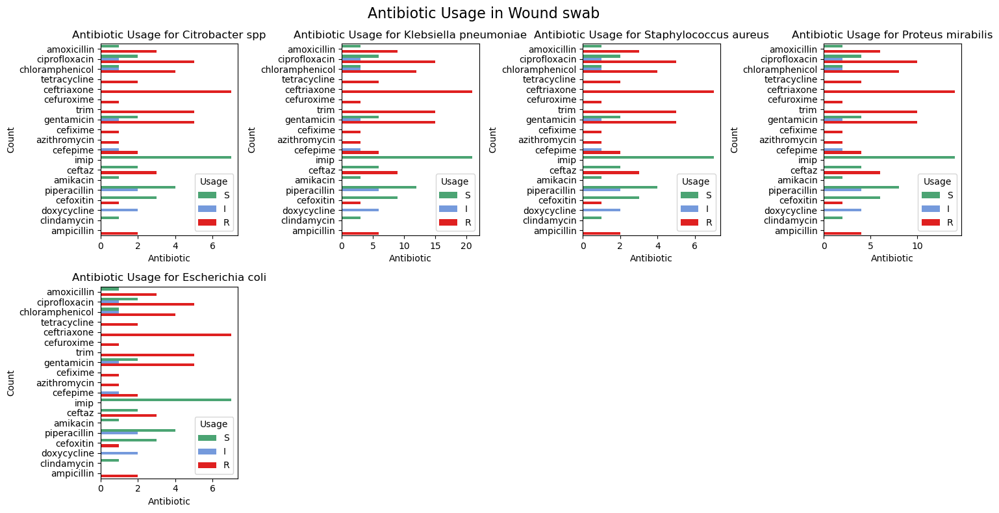

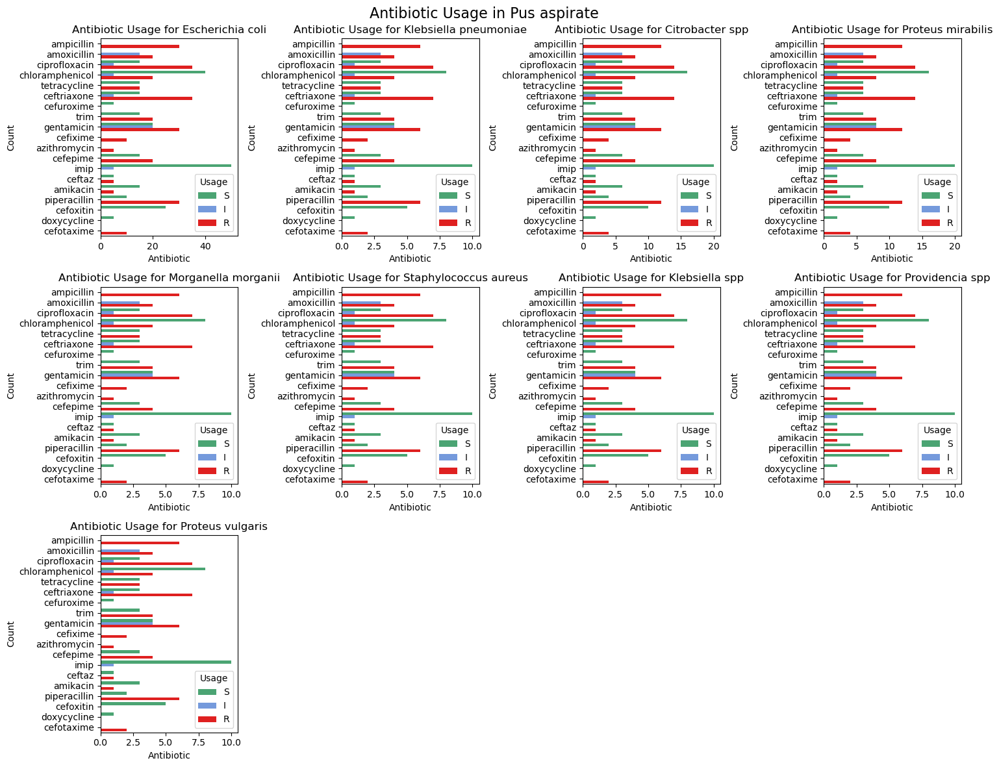

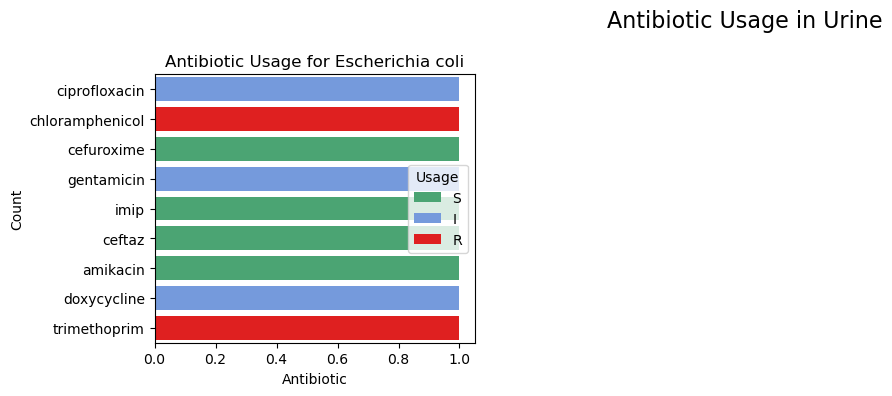

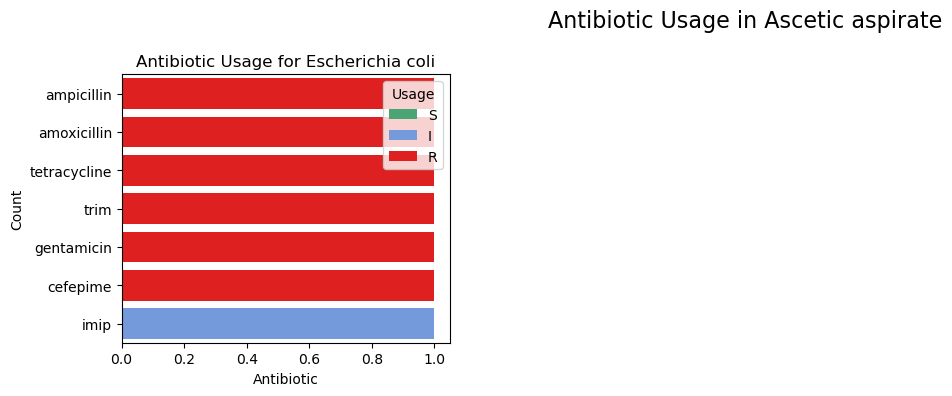

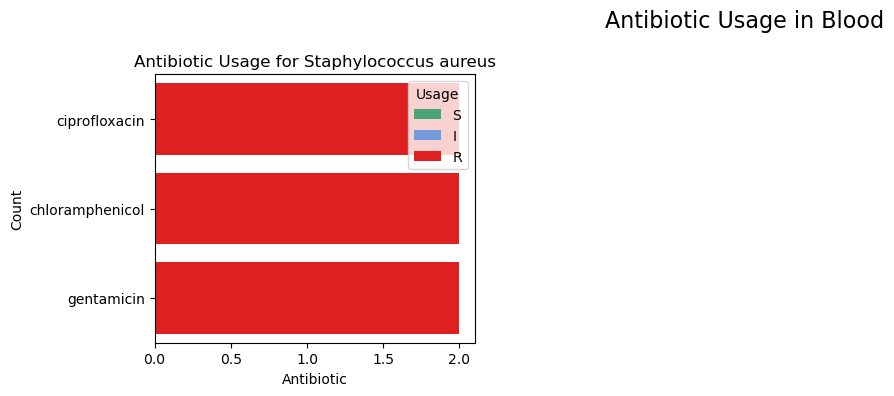

In [44]:
arua_data = merged_data[merged_data['name_of_rrh'] == 'Arua']

melted_data2.dropna(subset=['Antibiotic', 'Usage'], inplace=True)

# Get unique specimen types
specimen_types = arua_data['specimen_type'].unique()

# Loop through specimen types
for specimen in specimen_types:
    # Filter data for the current specimen type
    specimen_data = arua_data[arua_data['specimen_type'] == specimen]

    # Get unique pathogens for this specimen type
    pathogens = specimen_data['Pathogen'].unique()

    num_pathogens = len(pathogens)

    if num_pathogens > 0:
        # Calculate the number of rows needed for the subplots
        num_rows = (num_pathogens + 3) // 4  # Integer division to get the number of rows, ensuring 4 plots per row
        fig, axes = plt.subplots(num_rows, 4, figsize=(15, 4 * num_rows)) # Adjust figsize for better layout

        # Flatten axes for easier indexing
        axes = axes.flatten()

        # Loop through pathogens and plot
        for i, pathogen in enumerate(pathogens):
            pathogen_data = specimen_data[specimen_data['Pathogen'] == pathogen]
            if not pathogen_data.empty:
                sns.countplot(data=pathogen_data, y='Antibiotic', hue='Usage', palette={'S': 'mediumseagreen', 'R': 'red', 'I': 'cornflowerblue'}, ax=axes[i], hue_order=["S", "I", "R"])
                axes[i].set_title(f'Antibiotic Usage for {pathogen}')
                axes[i].set_xlabel('Antibiotic')
                axes[i].set_ylabel('Count')
                # axes[i].tick_params(axis='x', rotation=45, ha='right') #Rotate x axis labels
                axes[i].legend(title='Usage')
            else:
                print(f"No data for {pathogen} in {specimen}")

        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])
        fig.suptitle(f"Antibiotic Usage in {specimen}", fontsize=16)
        plt.tight_layout()
        plt.show()

    else:
        print(f"No pathogens found for {specimen}")

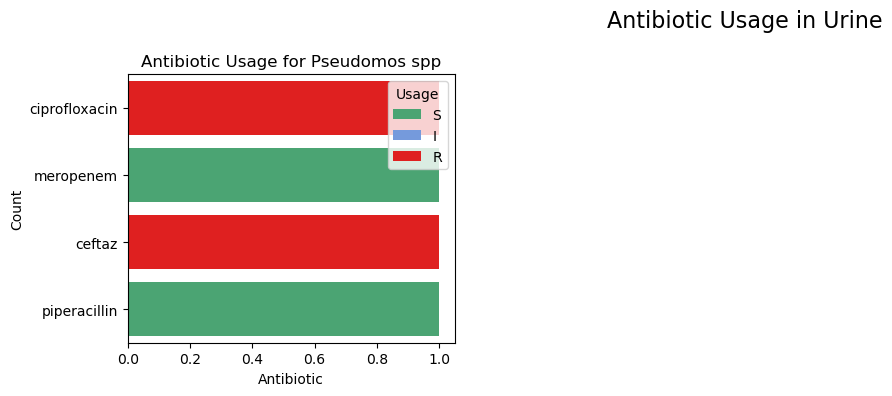

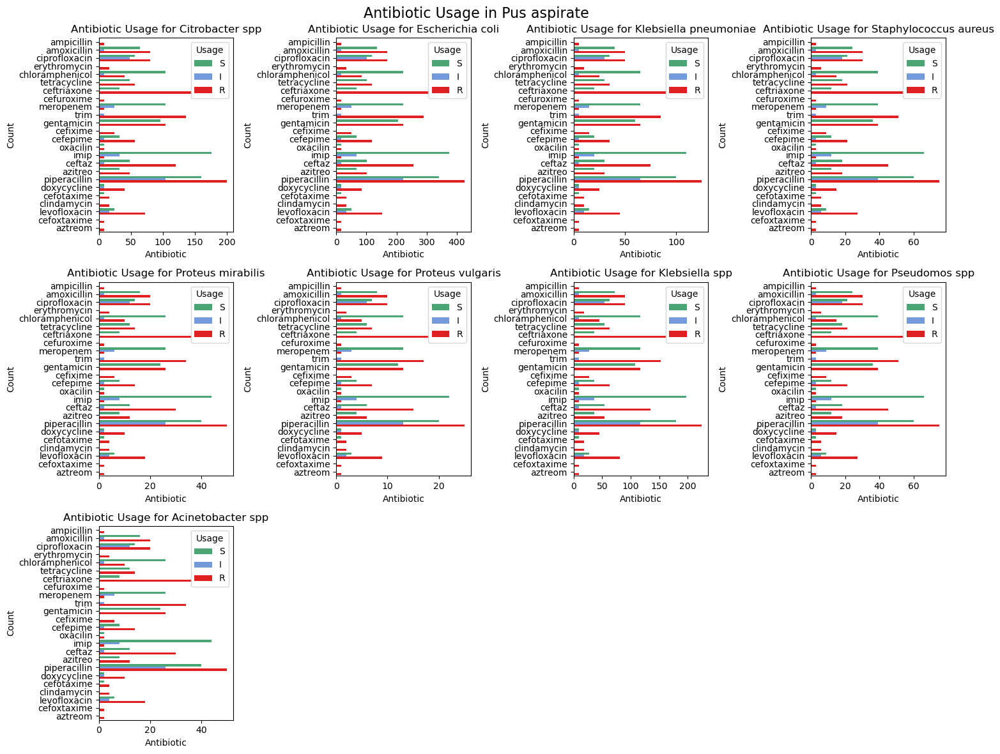

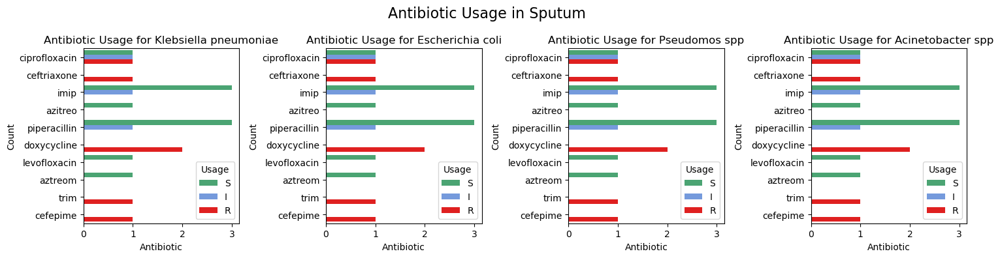

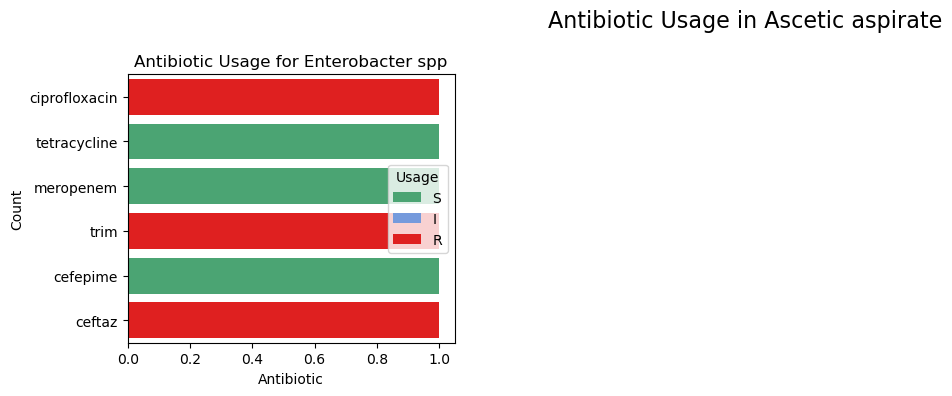

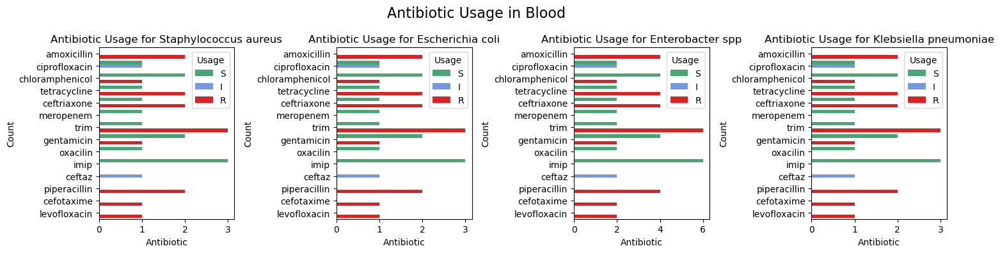

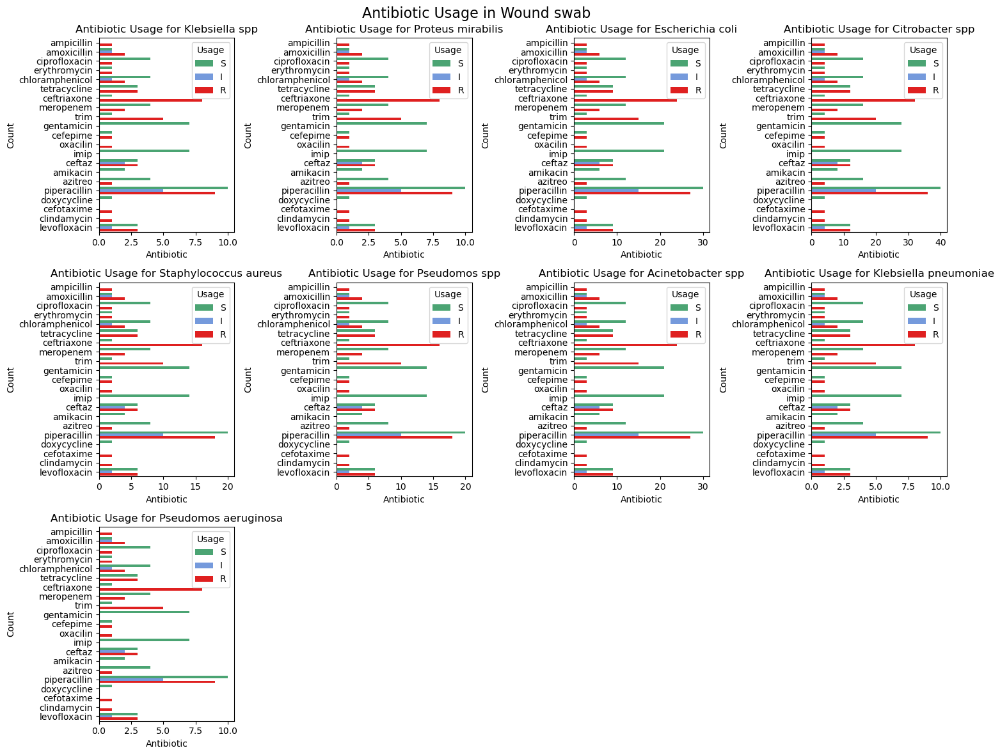

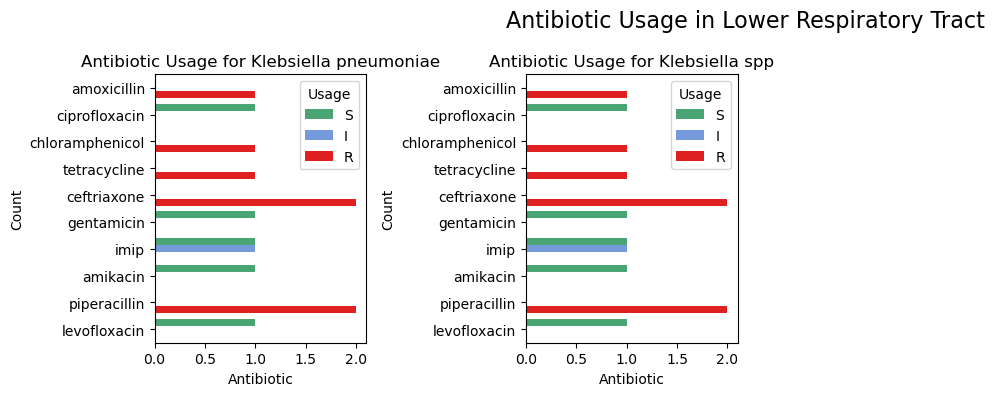

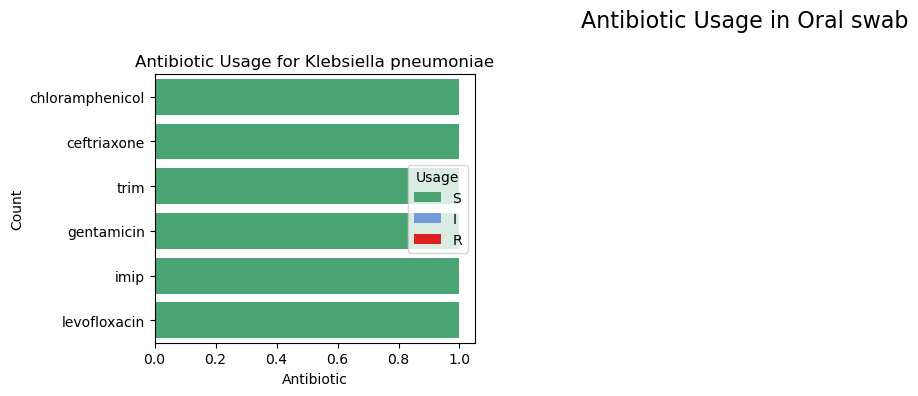

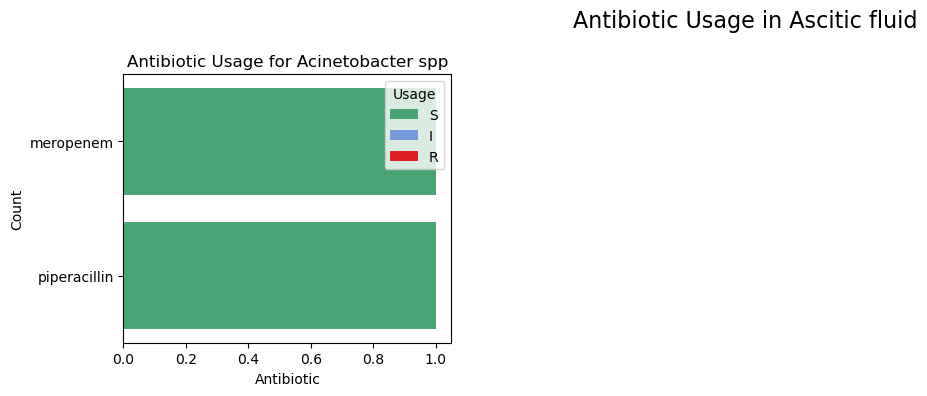

In [45]:
mbarara_data = merged_data[merged_data['name_of_rrh'] == 'Mbarara']

merged_data.dropna(subset=['Antibiotic', 'Usage'], inplace=True)

# Get unique specimen types
specimen_types = mbarara_data['specimen_type'].unique()

# Loop through specimen types
for specimen in specimen_types:
    # Filter data for the current specimen type
    specimen_data = mbarara_data[mbarara_data['specimen_type'] == specimen]

    # Get unique pathogens for this specimen type
    pathogens = specimen_data['Pathogen'].unique()

    num_pathogens = len(pathogens)

    if num_pathogens > 0:
        # Calculate the number of rows needed for the subplots
        num_rows = (num_pathogens + 3) // 4  # Integer division to get the number of rows, ensuring 4 plots per row
        fig, axes = plt.subplots(num_rows, 4, figsize=(15, 4 * num_rows)) # Adjust figsize for better layout

        # Flatten axes for easier indexing
        axes = axes.flatten()

        # Loop through pathogens and plot
        for i, pathogen in enumerate(pathogens):
            pathogen_data = specimen_data[specimen_data['Pathogen'] == pathogen]
            if not pathogen_data.empty:
                sns.countplot(data=pathogen_data, y='Antibiotic', hue='Usage', palette={'S': 'mediumseagreen', 'R': 'red', 'I': 'cornflowerblue'}, ax=axes[i], hue_order=["S", "I", "R"])
                axes[i].set_title(f'Antibiotic Usage for {pathogen}')
                axes[i].set_xlabel('Antibiotic')
                axes[i].set_ylabel('Count')
                # axes[i].tick_params(axis='x', rotation=45, ha='right') #Rotate x axis labels
                axes[i].legend(title='Usage')
            else:
                print(f"No data for {pathogen} in {specimen}")

        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])
        fig.suptitle(f"Antibiotic Usage in {specimen}", fontsize=16)
        plt.tight_layout()
        plt.show()

    else:
        print(f"No pathogens found for {specimen}")

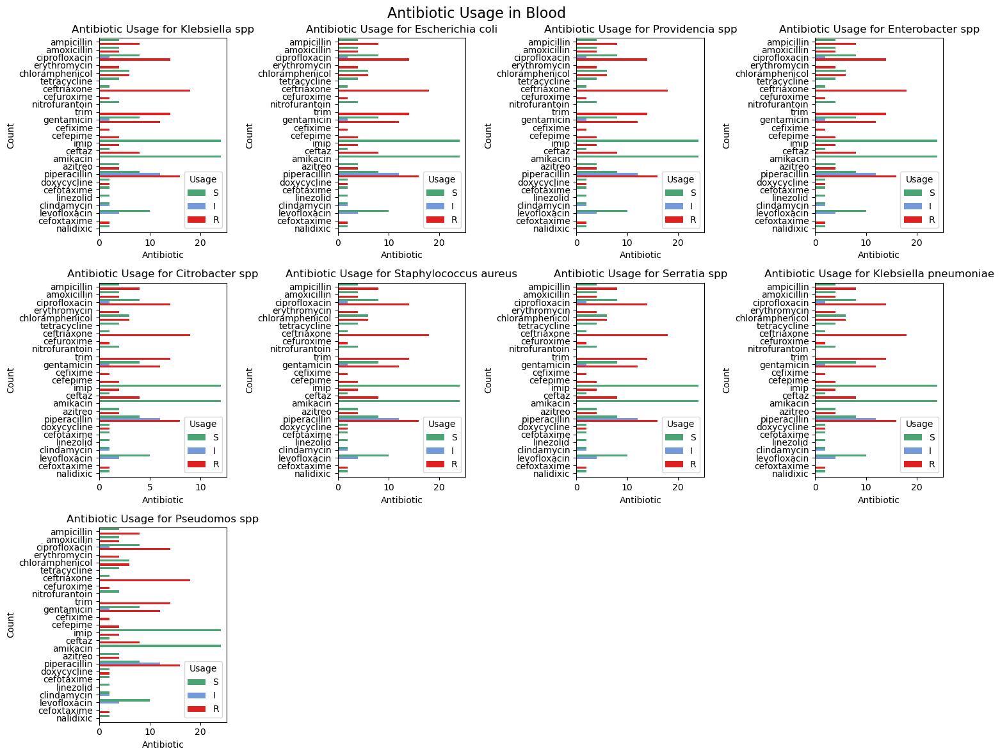

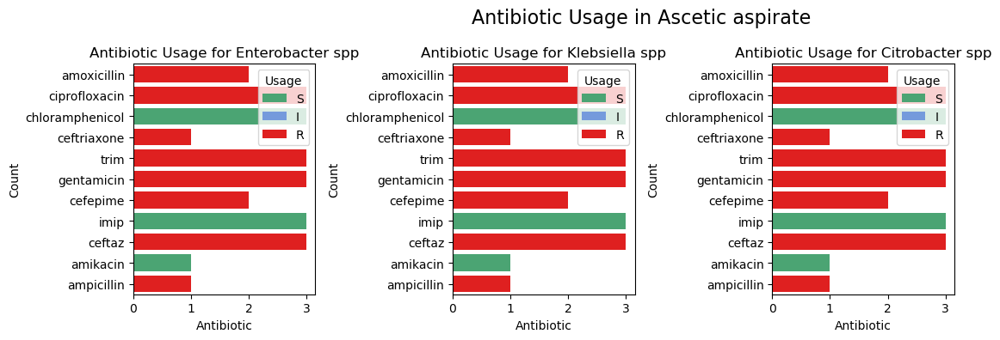

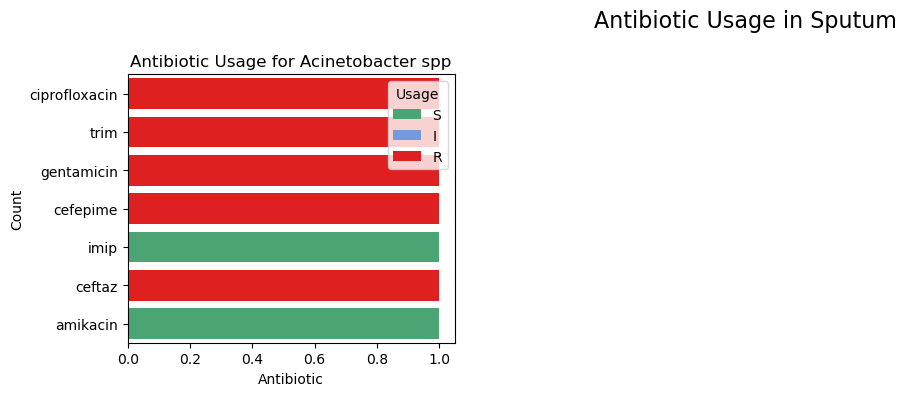

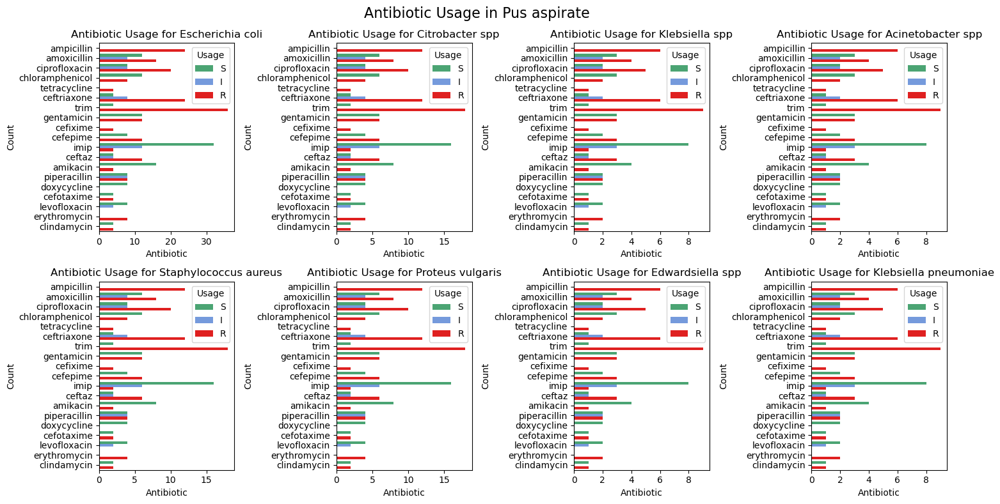

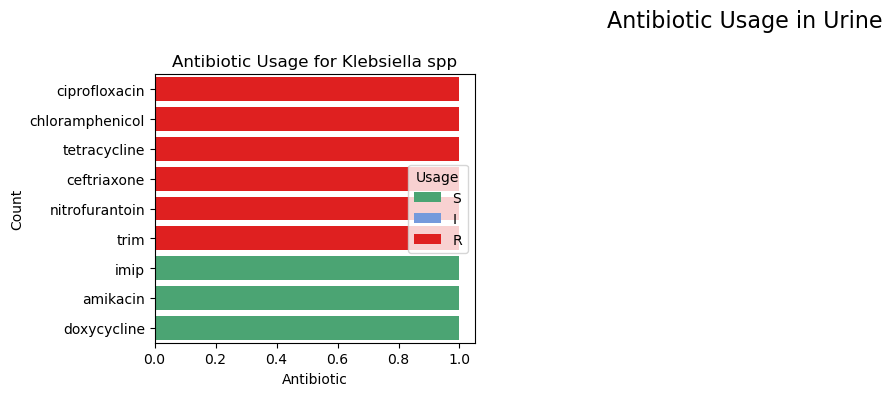

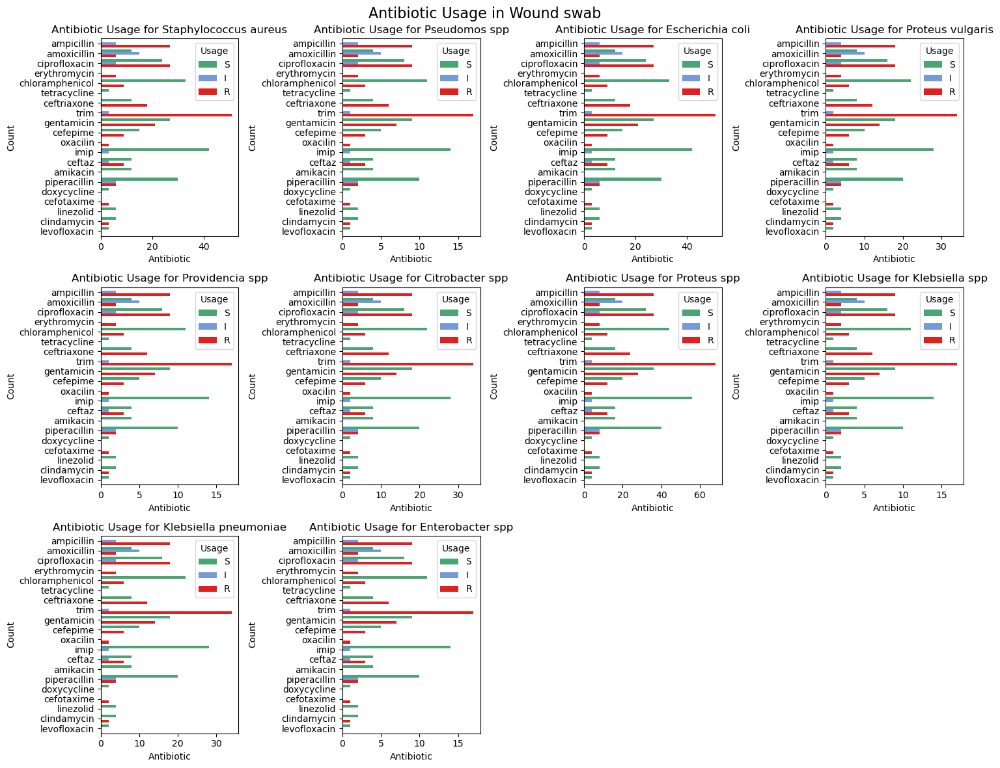

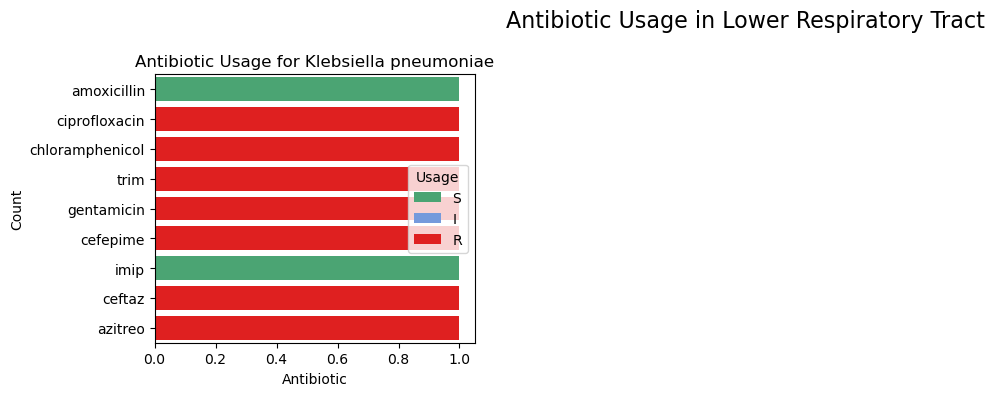

In [46]:
masaka_data = merged_data[merged_data['name_of_rrh'] == 'Masaka']

merged_data.dropna(subset=['Antibiotic', 'Usage'], inplace=True)

# Get unique specimen types
specimen_types = masaka_data['specimen_type'].unique()

# Loop through specimen types
for specimen in specimen_types:
    # Filter data for the current specimen type
    specimen_data = masaka_data[masaka_data['specimen_type'] == specimen]

    # Get unique pathogens for this specimen type
    pathogens = specimen_data['Pathogen'].unique()

    num_pathogens = len(pathogens)

    if num_pathogens > 0:
        # Calculate the number of rows needed for the subplots
        num_rows = (num_pathogens + 3) // 4  # Integer division to get the number of rows, ensuring 4 plots per row
        fig, axes = plt.subplots(num_rows, 4, figsize=(15, 4 * num_rows)) # Adjust figsize for better layout

        # Flatten axes for easier indexing
        axes = axes.flatten()

        # Loop through pathogens and plot
        for i, pathogen in enumerate(pathogens):
            pathogen_data = specimen_data[specimen_data['Pathogen'] == pathogen]
            if not pathogen_data.empty:
                sns.countplot(data=pathogen_data, y='Antibiotic', hue='Usage', palette={'S': 'mediumseagreen', 'R': 'red', 'I': 'cornflowerblue'}, ax=axes[i], hue_order=["S", "I", "R"])
                axes[i].set_title(f'Antibiotic Usage for {pathogen}')
                axes[i].set_xlabel('Antibiotic')
                axes[i].set_ylabel('Count')
                # axes[i].tick_params(axis='x', rotation=45, ha='right') #Rotate x axis labels
                axes[i].legend(title='Usage')
            else:
                print(f"No data for {pathogen} in {specimen}")

        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])
        fig.suptitle(f"Antibiotic Usage in {specimen}", fontsize=16)
        plt.tight_layout()
        plt.show()

    else:
        print(f"No pathogens found for {specimen}")

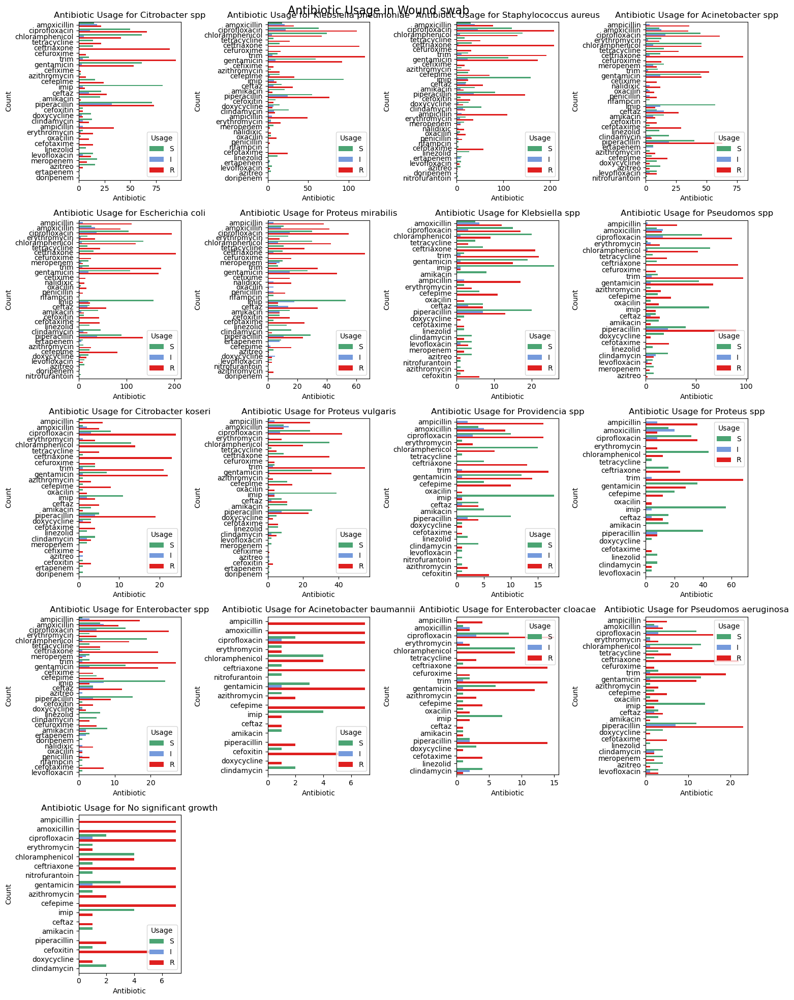

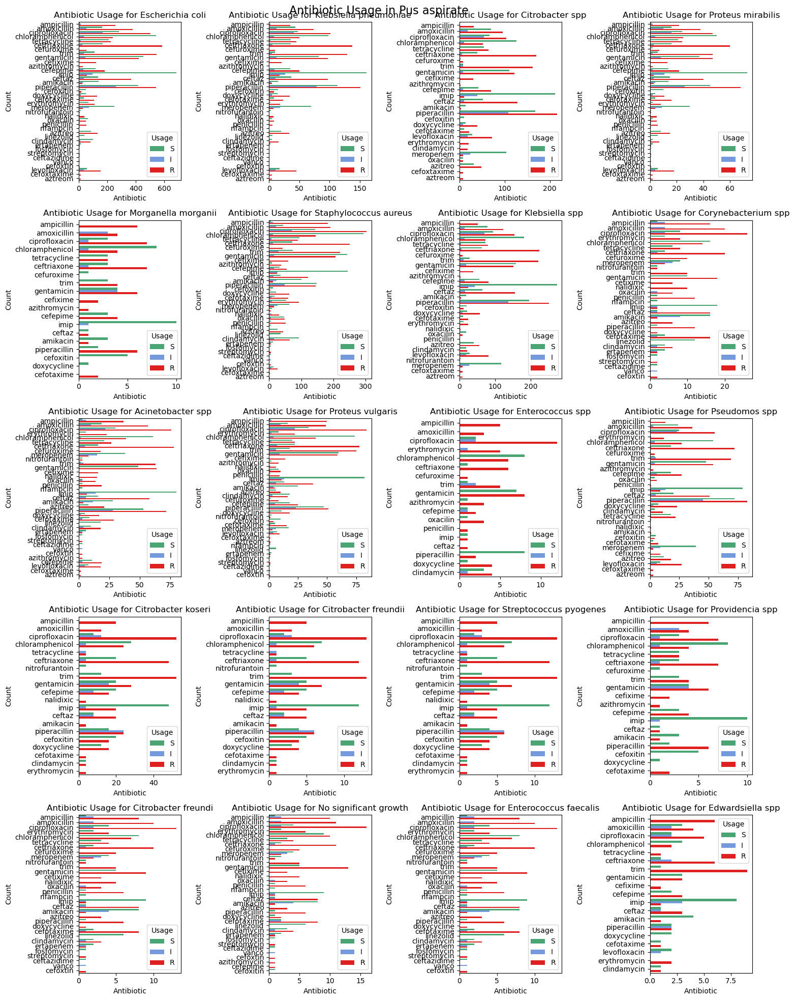

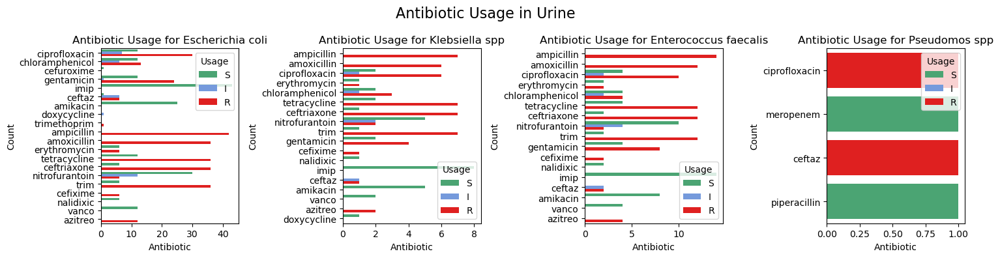

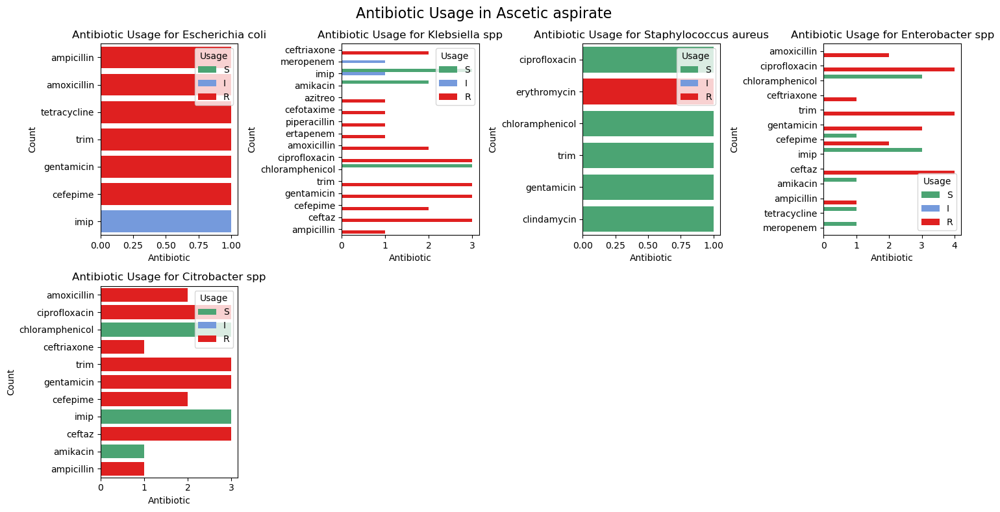

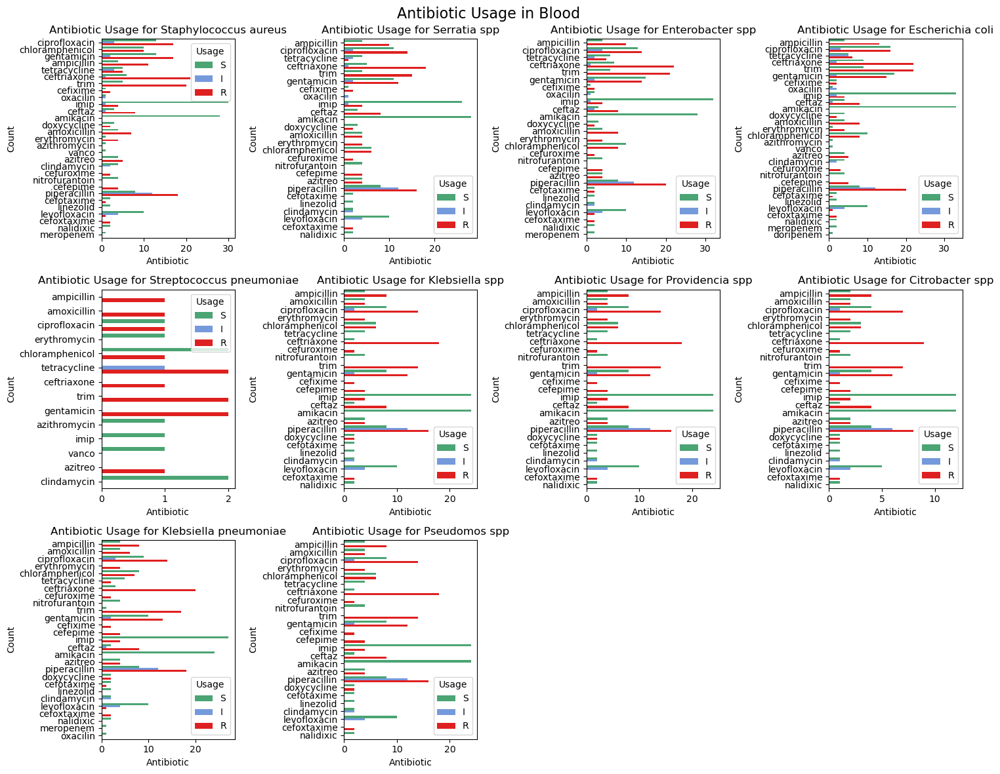

...

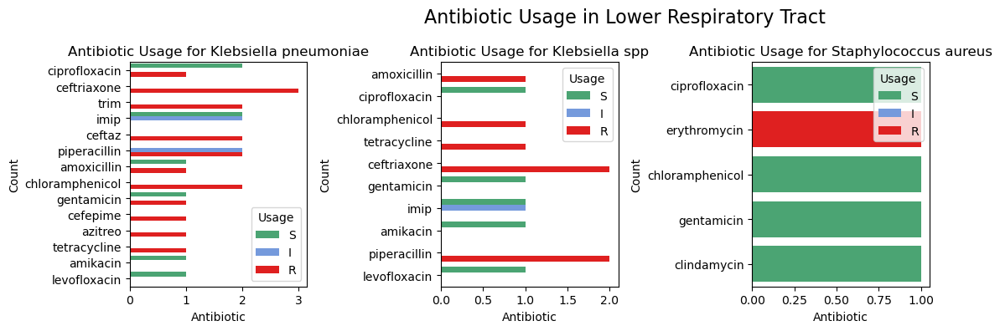

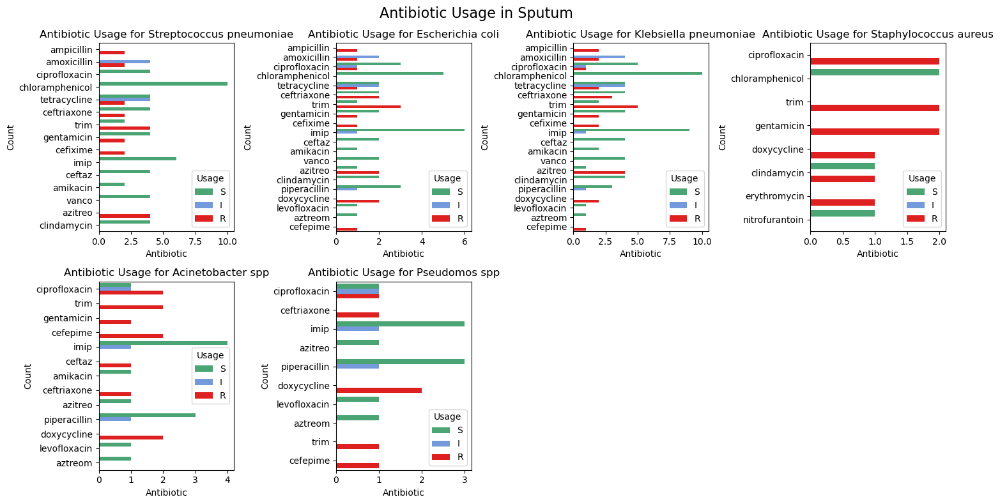

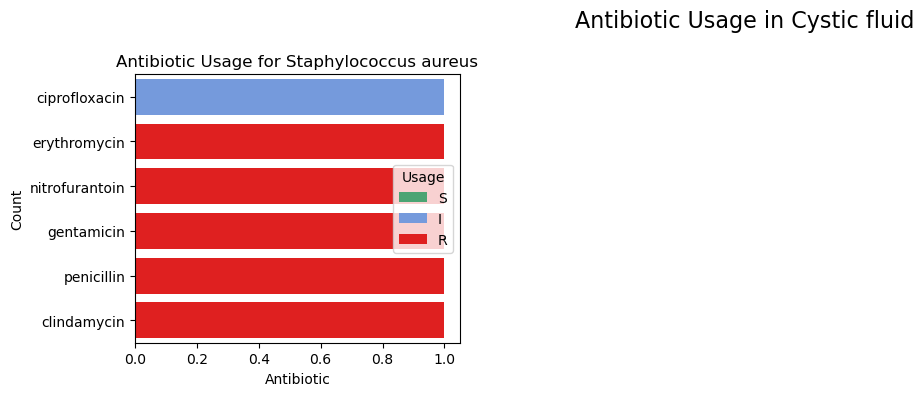

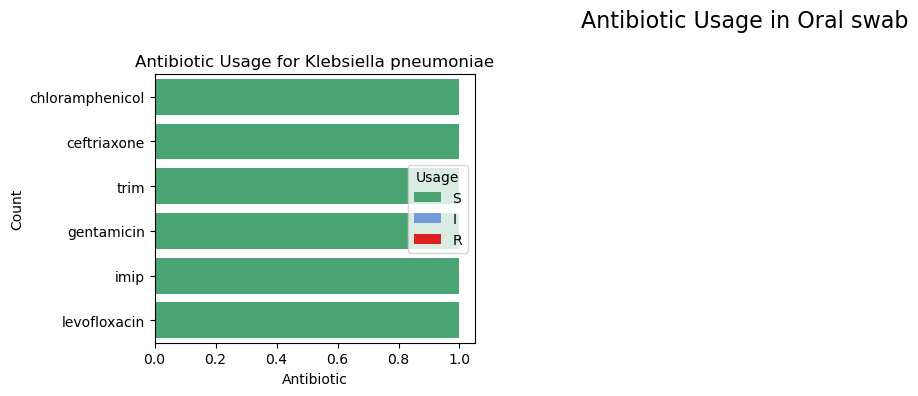

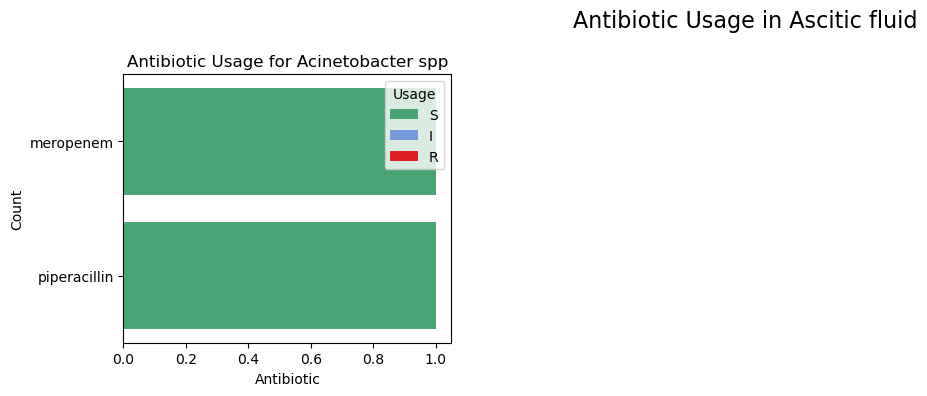

In [47]:
# arua_data = merged_data[merged_data['name_of_rrh'] == 'Arua']
merged_data.dropna(subset=['Antibiotic', 'Usage'], inplace=True)

# Get unique specimen types
specimen_types = merged_data['specimen_type'].unique()

# Loop through specimen types
for specimen in specimen_types:
    # Filter data for the current specimen type
    specimen_data = merged_data[merged_data['specimen_type'] == specimen]

    # Get unique pathogens for this specimen type
    pathogens = specimen_data['Pathogen'].unique()

    num_pathogens = len(pathogens)

    if num_pathogens > 0:
        # Calculate the number of rows needed for the subplots
        num_rows = (num_pathogens + 3) // 4  # Integer division to get the number of rows, ensuring 4 plots per row
        fig, axes = plt.subplots(num_rows, 4, figsize=(15, 4 * num_rows)) # Adjust figsize for better layout

        # Flatten axes for easier indexing
        axes = axes.flatten()

        # Loop through pathogens and plot
        for i, pathogen in enumerate(pathogens):
            pathogen_data = specimen_data[specimen_data['Pathogen'] == pathogen]
            if not pathogen_data.empty:
                sns.countplot(data=pathogen_data, y='Antibiotic', hue='Usage', palette={'S': 'mediumseagreen', 'R': 'red', 'I': 'cornflowerblue'}, ax=axes[i], hue_order=["S", "I", "R"])
                axes[i].set_title(f'Antibiotic Usage for {pathogen}')
                axes[i].set_xlabel('Antibiotic')
                axes[i].set_ylabel('Count')
                # axes[i].tick_params(axis='x', rotation=45, ha='right') #Rotate x axis labels
                axes[i].legend(title='Usage')
            else:
                print(f"No data for {pathogen} in {specimen}")

        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])
        fig.suptitle(f"Antibiotic Usage in {specimen}", fontsize=16)
        plt.tight_layout()
        plt.show()

    else:
        print(f"No pathogens found for {specimen}")

## Data Transformation

# Site of Infection

The sites of infection are to tranfrmed instead of yes/no for each patient observation we have the actual indication we shall end up with the actual sites of infection in the column

In [48]:

# Get infection site column names
infection_site_cols = [col for col in data.columns if col.startswith('infect_site')]

# More efficient method using apply
def get_infection_sites(row):
    yes_sites = [col.replace('infect_site_', '').replace('___', '') for col in infection_site_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Infection_Site_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_infection_sites, axis=1)
data = pd.concat([data, new_data], axis=1)

print(data)


    name_of_rrh   age     sex hosp_48hrs infect_site_Brain infect_site_Lungs  \
0          Arua  18.0    Male        Yes                No                No   
1          Arua  17.0  Female        Yes                No                No   
2          Arua  29.0    Male        Yes                No                No   
3          Arua  50.0  Female        Yes                No                No   
4          Arua  30.0  Female        Yes                No                No   
..          ...   ...     ...        ...               ...               ...   
310      Soroti  28.0  Female        Yes                No                No   
311      Soroti  20.0  Female        Yes                No                No   
312      Soroti  27.0  Female        Yes                No                No   
313      Soroti  27.0  Female        Yes                No                No   
314      Soroti   2.0  Female        Yes                No               Yes   

    infect_site_Gastro_intestil_tract i

[Text(0, 0, '39'),
 Text(0, 0, '97'),
 Text(0, 0, '2'),
 Text(0, 0, '23'),
 Text(0, 0, '36'),
 Text(0, 0, '39'),
 Text(0, 0, '29'),
 Text(0, 0, '19'),
 Text(0, 0, '45'),
 Text(0, 0, '4'),
 Text(0, 0, '6')]

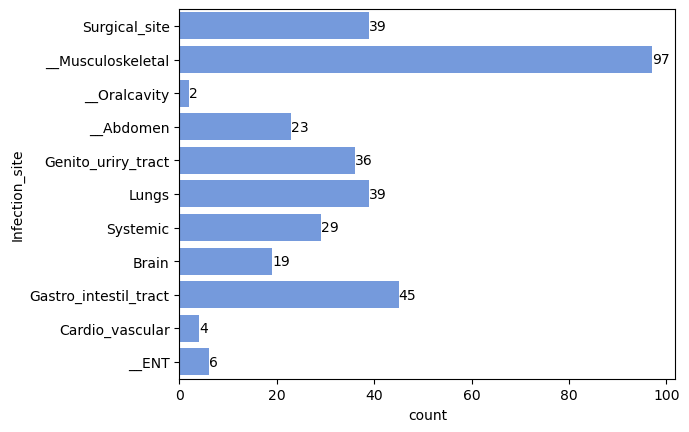

In [49]:
infection_site = pd.melt(
    data,
    id_vars= 'specimen_type',
    value_vars= ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3'],
    value_name= 'Infection_site'
)

infection_site.dropna(subset = ['Infection_site'], inplace = True)

ax = sns.countplot(infection_site, y = 'Infection_site', color = 'cornflowerblue')
ax.bar_label(ax.containers[0], fontsize =10)

In [50]:
data.to_csv("site.csv", index = False)

# Prio Antibiotic use  
*if patient is referred, assumption is antibiotic was prescribed*

In [51]:
# Get prio antibiotic use column names
prio_anti_cols = [col for col in data.columns if col.startswith('prio_antib_me_')]

# More efficient method using apply
def get_prio_antibiotic(row):
    yes_sites = [col.replace('prio_antib_me_', "").replace('___', '') for col in prio_anti_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Prio_antib_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_prio_antibiotic, axis=1)
data = pd.concat([data, new_data], axis=1)

# print(data)

In [52]:
data.head()

,name_of_rrh,age,sex,hosp_48hrs,infect_site_Brain,infect_site_Lungs,infect_site_Gastro_intestil_tract,infect_site_Genito_uriry_tract,infect_site_Cardio_vascular,infect_site_Systemic,...,date_at_discharge,date_referral,length_hosp_stay,Infection_Site_1,Infection_Site_2,Infection_Site_3,Prio_antib_1,Prio_antib_2,Prio_antib_3,Prio_antib_4
0,Arua,18.0,Male,Yes,No,No,No,No,No,No,...,44972.0,NaN,0.0,Surgical_site,NaN,NaN,NaN,NaN,NaN,NaN
1,Arua,17.0,Female,Yes,No,No,No,No,No,No,...,45208.0,NaN,10.0,Surgical_site,NaN,NaN,NaN,NaN,NaN,NaN
2,Arua,29.0,Male,Yes,No,No,No,No,No,No,...,45257.0,NaN,69.0,__Musculoskeletal,NaN,NaN,NaN,NaN,NaN,NaN
3,Arua,50.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,5.0,__Oralcavity,NaN,NaN,NaN,NaN,NaN,NaN
4,Arua,30.0,Female,Yes,No,No,No,No,No,No,...,45251.0,NaN,45.0,__Musculoskeletal,NaN,NaN,NaN,NaN,NaN,NaN


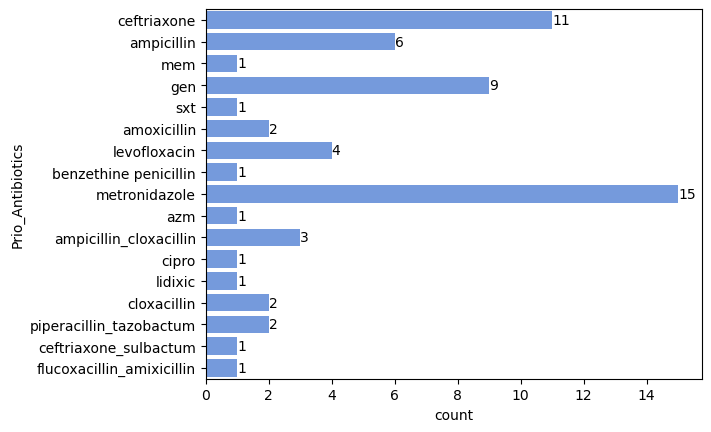

In [53]:
prio_antibiotics = pd.melt(
    data,
    id_vars = 'specimen_type',
    value_vars= ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4'],
    value_name= 'Prio_Antibiotics'
)

prio_antibiotics.dropna(subset = ['Prio_Antibiotics'], inplace = True)

ax = sns.countplot(prio_antibiotics, y = 'Prio_Antibiotics', color = 'cornflowerblue')
ax.bar_label(ax.containers[0], fontsize = 10)

plt.show()

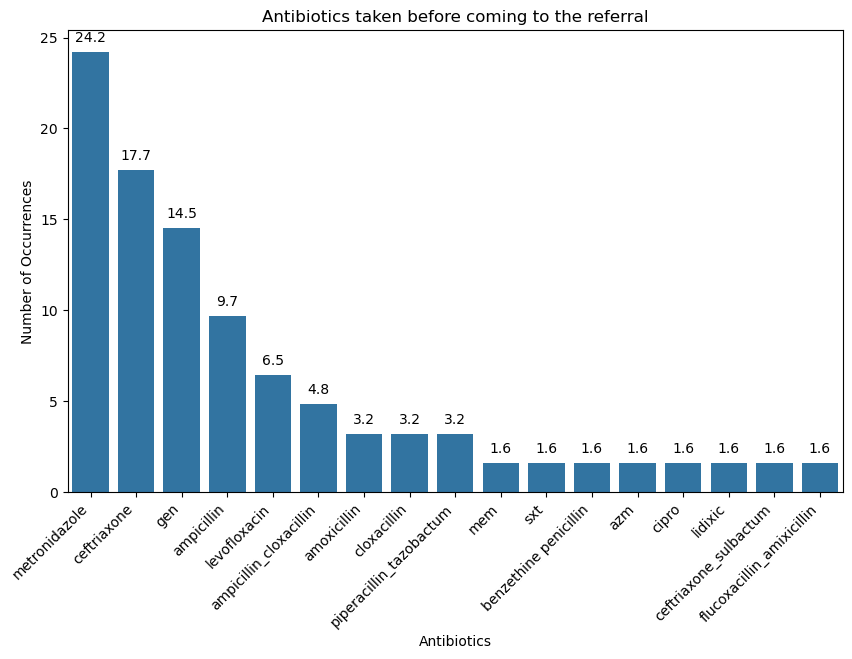

In [54]:
anti_count = prio_antibiotics['Prio_Antibiotics'].value_counts(normalize = True) * 100

plt.figure(figsize = (10,6))

ax = sns.barplot(x = anti_count.index, y = anti_count.values)
# Add labels and title
ax.set_xlabel('Antibiotics')
ax.set_ylabel('Number of Occurrences')
ax.set_title('Antibiotics taken before coming to the referral')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars with 2 decimal places
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.show()

# Antibiotics prescribed before culture

In [55]:
# Get prio antibiotic use column names
prescribed_anti_cols = [col for col in data.columns if col.startswith('antibiotics_prescribed_')]

# More efficient method using apply
def get_prescribed_antibiotic(row):
    yes_sites = [col.replace('antibiotics_prescribed_', "").replace('___', '') for col in prescribed_anti_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Prescribed_antib_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_prescribed_antibiotic, axis=1)
data = pd.concat([data, new_data], axis=1)

# print(data)

In [56]:
data.head()

,name_of_rrh,age,sex,hosp_48hrs,infect_site_Brain,infect_site_Lungs,infect_site_Gastro_intestil_tract,infect_site_Genito_uriry_tract,infect_site_Cardio_vascular,infect_site_Systemic,...,Infection_Site_3,Prio_antib_1,Prio_antib_2,Prio_antib_3,Prio_antib_4,Prescribed_antib_1,Prescribed_antib_2,Prescribed_antib_3,Prescribed_antib_4,Prescribed_antib_5
0,Arua,18.0,Male,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,metronidazole,cefotaxime,NaN,NaN,NaN
1,Arua,17.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,Chloramphenicol,metronidazole,levofloxacin_sulbactam,NaN,NaN
2,Arua,29.0,Male,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,metronidazole,cefotaxime,NaN,NaN,NaN
3,Arua,50.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,Ceftriaxone,metronidazole,levofloxacin_sulbactam,NaN,NaN
4,Arua,30.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,NaN,NaN,Ampicillin,cloxacillin,NaN,NaN,NaN


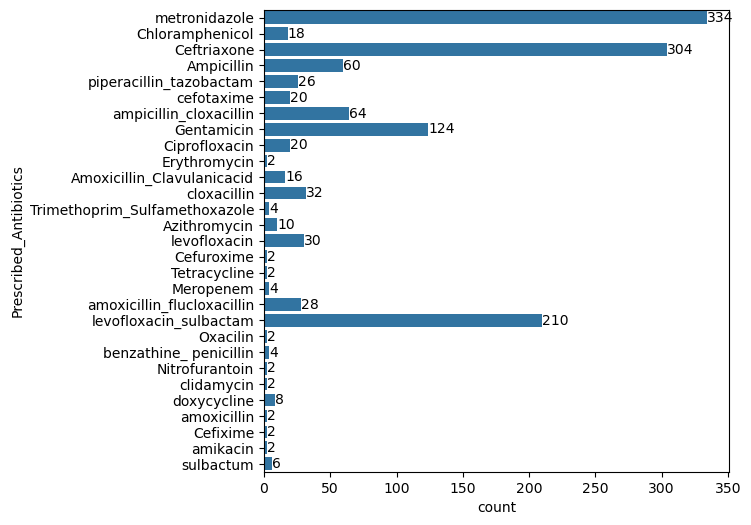

In [57]:
prescribed_anti_cols = [col for col in data.columns if col.startswith('antibiotics_prescribed_')]

# More efficient method using apply
def get_prescribed_antibiotic(row):
    yes_sites = [col.replace('antibiotics_prescribed_', "").replace('___', '') for col in prescribed_anti_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Prescribed_antib_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_prescribed_antibiotic, axis=1)
data = pd.concat([data, new_data], axis=1)


prescribed_antibiotics = pd.melt(
    data,
    id_vars = 'specimen_type',
    value_vars= ['Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5'],
    value_name= "Prescribed_Antibiotics"
)

prescribed_antibiotics.dropna(subset = ['Prescribed_Antibiotics'], inplace = True)

plt.figure(figsize = (6,6))

ax = sns.countplot(prescribed_antibiotics, y = 'Prescribed_Antibiotics')
ax.bar_label(ax.containers[0], fontsize = 10)

plt.show()

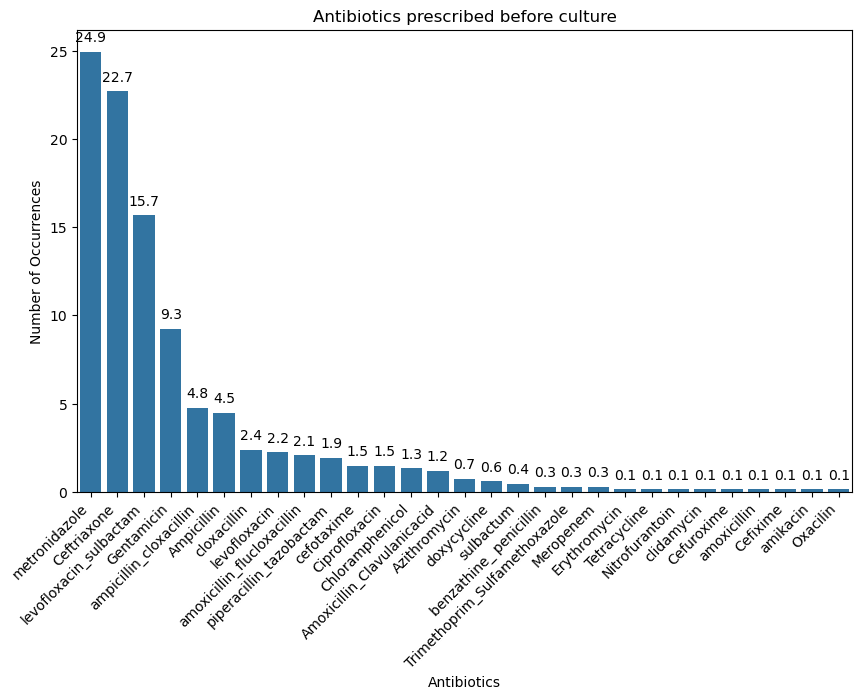

In [58]:
anti_count = prescribed_antibiotics['Prescribed_Antibiotics'].value_counts(normalize = True) * 100

plt.figure(figsize = (10,6))

ax = sns.barplot(x = anti_count.index, y = anti_count.values)
# Add labels and title
ax.set_xlabel('Antibiotics')
ax.set_ylabel('Number of Occurrences')
ax.set_title('Antibiotics prescribed before culture')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars with 2 decimal places
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.show()

# Antibiotics prescribed after Culture

In [59]:
data.drop(columns = 'antib_presc_af_cul_Others', inplace = True)

# Get prio antibiotic use column names
prescribed_anti_aft_cul_cols = [col for col in data.columns if col.startswith('antib_presc_af_cul_')]

# More efficient method using apply
def get_prescribed_anti_aft_cul(row):
    yes_sites = [col.replace('antib_presc_af_cul_', "").replace('___', '') for col in prescribed_anti_aft_cul_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Antibioitic_aft_cul_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_prescribed_anti_aft_cul, axis=1)
data = pd.concat([data, new_data], axis=1)

# print(data)

In [60]:
data.head()

,name_of_rrh,age,sex,hosp_48hrs,infect_site_Brain,infect_site_Lungs,infect_site_Gastro_intestil_tract,infect_site_Genito_uriry_tract,infect_site_Cardio_vascular,infect_site_Systemic,...,Prescribed_antib_3,Prescribed_antib_4,Prescribed_antib_5,Prescribed_antib_1,Prescribed_antib_2,Prescribed_antib_3,Prescribed_antib_4,Prescribed_antib_5,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2
0,Arua,18.0,Male,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,metronidazole,cefotaxime,NaN,NaN,NaN,NaN,NaN
1,Arua,17.0,Female,Yes,No,No,No,No,No,No,...,levofloxacin_sulbactam,NaN,NaN,Chloramphenicol,metronidazole,levofloxacin_sulbactam,NaN,NaN,Chloramphenicol,NaN
2,Arua,29.0,Male,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,metronidazole,cefotaxime,NaN,NaN,NaN,Imipenen,NaN
3,Arua,50.0,Female,Yes,No,No,No,No,No,No,...,levofloxacin_sulbactam,NaN,NaN,Ceftriaxone,metronidazole,levofloxacin_sulbactam,NaN,NaN,NaN,NaN
4,Arua,30.0,Female,Yes,No,No,No,No,No,No,...,NaN,NaN,NaN,Ampicillin,cloxacillin,NaN,NaN,NaN,NaN,NaN


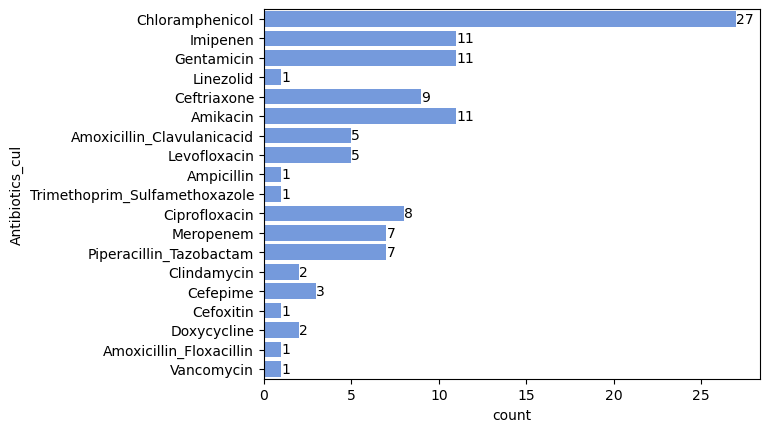

In [61]:
antib_aft_cul = pd.melt (
    data,
    id_vars= 'specimen_type',
    value_vars = ['Antibioitic_aft_cul_1', 'Antibioitic_aft_cul_2'],
    value_name = 'Antibiotics_cul'
)

# print(antib_aft_cul)
antib_aft_cul.dropna(subset= ['Antibiotics_cul'], inplace = True)

ax = sns.countplot(antib_aft_cul, y = 'Antibiotics_cul', color = 'cornflowerblue')
ax.bar_label(ax.containers[0], fontsize  = 10)

plt.show()

In [62]:
data.to_csv("site.csv", index = False)

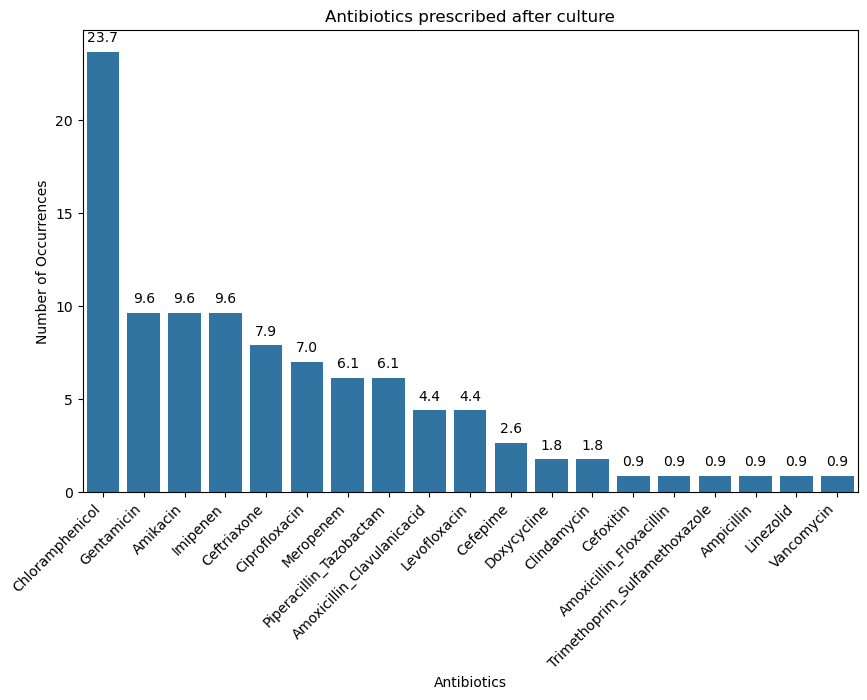

In [63]:
anti_count = antib_aft_cul['Antibiotics_cul'].value_counts(normalize = True) * 100

plt.figure(figsize = (10,6))

ax = sns.barplot(x = anti_count.index, y = anti_count.values)
# Add labels and title
ax.set_xlabel('Antibiotics')
ax.set_ylabel('Number of Occurrences')
ax.set_title('Antibiotics prescribed after culture')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars with 2 decimal places
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.show()

# AST results of the prescribed drugs

In [64]:
def get_ast_for_prescribed(row, antibiotic_col):
    if pd.isna(row[antibiotic_col]):
        return np.nan

    antibiotic = row[antibiotic_col]
    result = np.nan
    for col in row.index:
        match = re.match(r"(first_|sec_|third_)?(" + re.escape(antibiotic) + r")", col)
        if match:
            result = row[col]
            break
    return f"{antibiotic}:{result}" if pd.notna(result) else np.nan

# Create new columns
for i in range(1, 4):  # Iterate up to 3 for the 3 antibiotic columns
    antibiotic_col_name = f"Prescribed_antib_{i}" if i != 3 else "Prescribed_antib_2"
    if antibiotic_col_name in data.columns:
        data[f'AST_Results_{i}'] = data.apply(lambda row: get_ast_for_prescribed(row, antibiotic_col_name), axis=1)

print(data)

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [ ]:
data.tail()

,name_of_rrh,age,sex,hosp_48hrs,infect_site_Brain,infect_site_Lungs,infect_site_Gastro_intestil_tract,infect_site_Genito_uriry_tract,infect_site_Cardio_vascular,infect_site_Systemic,...,Prescribed_antib_1,Prescribed_antib_2,Prescribed_antib_3,Prescribed_antib_4,Prescribed_antib_5,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,AST_Results_1,AST_Results_2,AST_Results_3
310,Soroti,28.0,Female,Yes,No,No,No,No,No,No,...,metronidazole,piperacillin_tazobactam,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
311,Soroti,20.0,Female,Yes,No,No,No,No,No,No,...,Ampicillin,metronidazole,levofloxacin_sulbactam,NaN,NaN,NaN,NaN,NaN,NaN,NaN
312,Soroti,27.0,Female,Yes,No,No,No,No,No,No,...,metronidazole,piperacillin_tazobactam,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
313,Soroti,27.0,Female,Yes,No,No,No,No,No,No,...,metronidazole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
314,Soroti,2.0,Female,Yes,No,Yes,No,No,No,No,...,Azithromycin,ampicillin_cloxacillin,NaN,NaN,NaN,Ciprofloxacin,Gentamicin,NaN,NaN,NaN


In [ ]:
data.columns


Index(['name_of_rrh', 'age', 'sex', 'hosp_48hrs', 'infect_site_Brain',
       'infect_site_Lungs', 'infect_site_Gastro_intestil_tract',
       'infect_site_Genito_uriry_tract', 'infect_site_Cardio_vascular',
       'infect_site_Systemic',
       ...
       'Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3',
       'Prescribed_antib_4', 'Prescribed_antib_5', 'Antibioitic_aft_cul_1',
       'Antibioitic_aft_cul_2', 'AST_Results_1', 'AST_Results_2',
       'AST_Results_3'],
      dtype='object', length=335)

## Resistance profiles

In [65]:
anti = data.drop(columns = ['first_pathogen','first_organism', 'sec_organism', 'third_organism', 'firs_rep_organis', 'sec_rep_organis'], axis =1)

# Get antibiotic columns
antibiotic_cols = [col for col in anti.columns if col.startswith(('first_', 'sec_', 'third_'))]

# Create a dictionary to map similar antibiotics to a common name
antibiotic_mapping = {}
for col in antibiotic_cols:
    match = re.match(r"(first_|sec_|third_)([a-zA-Z]+)", col)
    if match:
        antibiotic_name = match.group(2)
        antibiotic_mapping[col] = antibiotic_name

# Melt the DataFrame
melted_data2 = pd.melt(anti, id_vars= ['name_of_rrh','specimen_type'], value_vars=antibiotic_cols, var_name='original_antibiotic', value_name='Usage')

# Replace original antibiotic names with common names
melted_data2['Antibiotic'] = melted_data2['original_antibiotic'].map(antibiotic_mapping)

print(melted_data2)

      name_of_rrh            specimen_type original_antibiotic Usage  \
0            Arua               Wound swab    first_ampicillin   NaN   
1            Arua             Pus aspirate    first_ampicillin   NaN   
2            Arua               Wound swab    first_ampicillin   NaN   
3            Arua             Pus aspirate    first_ampicillin   NaN   
4            Arua             Pus aspirate    first_ampicillin     R   
...           ...                      ...                 ...   ...   
35905      Soroti               Wound swab       sec_cefoxtin2   NaN   
35906      Soroti             Pus aspirate       sec_cefoxtin2   NaN   
35907      Soroti               Wound swab       sec_cefoxtin2   NaN   
35908      Soroti               Wound swab       sec_cefoxtin2   NaN   
35909      Soroti  Lower Respiratory Tract       sec_cefoxtin2   NaN   

       Antibiotic  
0      ampicillin  
1      ampicillin  
2      ampicillin  
3      ampicillin  
4      ampicillin  
...           .

In [66]:
pathogens = pd.melt(
    data,
    id_vars = ['name_of_rrh','specimen_type'], 
    value_vars= ['first_organism', 'sec_organism', 'third_organism'],
    value_name= 'Pathogen'
)

print(pathogens)

    name_of_rrh            specimen_type        variable  \
0          Arua               Wound swab  first_organism   
1          Arua             Pus aspirate  first_organism   
2          Arua               Wound swab  first_organism   
3          Arua             Pus aspirate  first_organism   
4          Arua             Pus aspirate  first_organism   
..          ...                      ...             ...   
940      Soroti               Wound swab  third_organism   
941      Soroti             Pus aspirate  third_organism   
942      Soroti               Wound swab  third_organism   
943      Soroti               Wound swab  third_organism   
944      Soroti  Lower Respiratory Tract  third_organism   

                  Pathogen  
0          Citrobacter spp  
1         Escherichia coli  
2    Klebsiella pneumoniae  
3    Klebsiella pneumoniae  
4         Escherichia coli  
..                     ...  
940                    NaN  
941                    NaN  
942               

In [67]:
# Drop rows where antibiotic or pathogen is None
pathogens.dropna(subset=['Pathogen'], inplace=True)
melted_data2.dropna(subset=['Antibiotic'], inplace=True)

#Perform a cross join
merged_data = pd.merge(pathogens, melted_data2, on=['name_of_rrh','specimen_type'], how='inner')

merged_data.dropna(subset=['Antibiotic', 'Usage'], inplace=True)

In [68]:
merged_data = merged_data.reset_index(drop = True)
merged_data.head(10)

,name_of_rrh,specimen_type,variable,Pathogen,original_antibiotic,Usage,Antibiotic
0,Arua,Wound swab,first_organism,Citrobacter spp,first_amoxicillin,S,amoxicillin
1,Arua,Wound swab,first_organism,Citrobacter spp,first_amoxicillin,R,amoxicillin
2,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
3,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
4,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
5,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,I,ciprofloxacin
6,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,S,ciprofloxacin
7,Arua,Wound swab,first_organism,Citrobacter spp,first_chloramphenicol,I,chloramphenicol
8,Arua,Wound swab,first_organism,Citrobacter spp,first_chloramphenicol,R,chloramphenicol
9,Arua,Wound swab,first_organism,Citrobacter spp,first_chloramphenicol,R,chloramphenicol


In [69]:
merged_data['Pathogen'].unique()

array(['Citrobacter spp', 'Escherichia coli', 'Klebsiella pneumoniae',
       'Staphylococcus aureus', 'Proteus mirabilis',
       'Morganella morganii', 'Klebsiella spp', 'Corynebacterium spp',
       'Acinetobacter spp', 'Serratia spp', 'Enterobacter spp',
       'Streptococcus pneumoniae', 'Proteus vulgaris',
       'Enterococcus faecalis', 'Pseudomos spp', 'Enterococcus spp',
       'Citrobacter koseri', 'Citrobacter freundii', 'Providencia spp',
       'Proteus spp', 'Streptococcus pyogenes', 'Acinetobacter baumannii',
       'Citrobacter freundi', 'No significant growth',
       'Enterobacter cloacae', 'Pseudomos aeruginosa', 'Edwardsiella spp'],
      dtype=object)

In [93]:
df = merged_data

# Count instances for each antibiotic
summary = df.groupby(['name_of_rrh','Antibiotic', 'Usage']).size().unstack(fill_value=0)

# Ensure columns 'I', 'R', 'S' exist
for col in ['I', 'R', 'S']:
    if col not in summary:
        summary[col] = 0

# Compute totals and %R
summary['I+R+S'] = summary['I'] + summary['R'] + summary['S']
summary['%R'] = (summary['R'] / summary['I+R+S'] * 100).round(0)

# Reset index and format output
summary = summary.reset_index()

summary.to_csv('resistance.csv', index = False)

summary.head()

Usage,name_of_rrh,Antibiotic,I,R,S,I+R+S,%R
0,Arua,amikacin,0,15,54,69,22.0
1,Arua,amoxicillin,45,85,8,138,62.0
2,Arua,ampicillin,0,107,0,107,100.0
3,Arua,azithromycin,0,23,0,23,100.0
4,Arua,cefepime,8,77,45,130,59.0


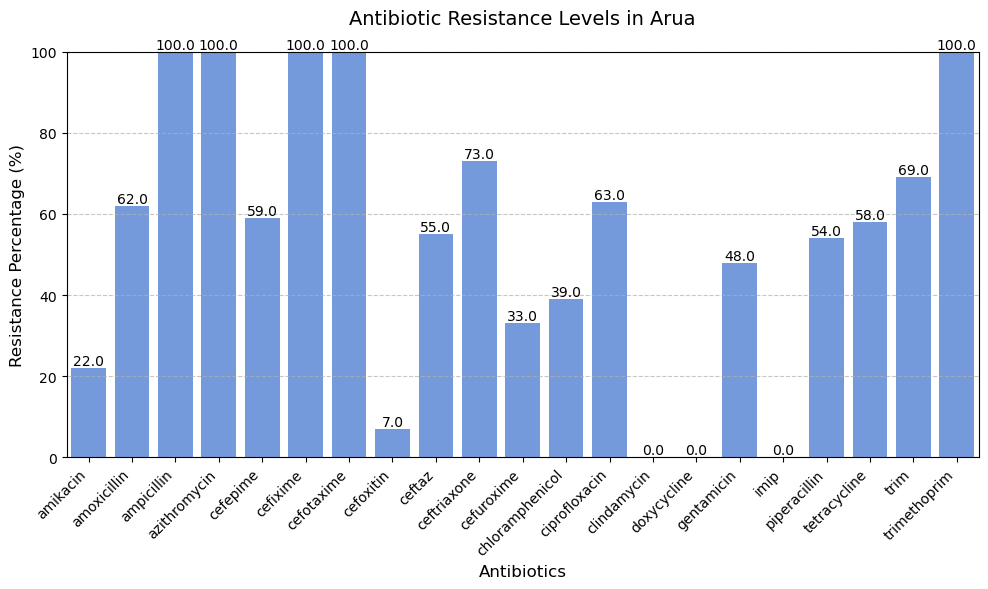

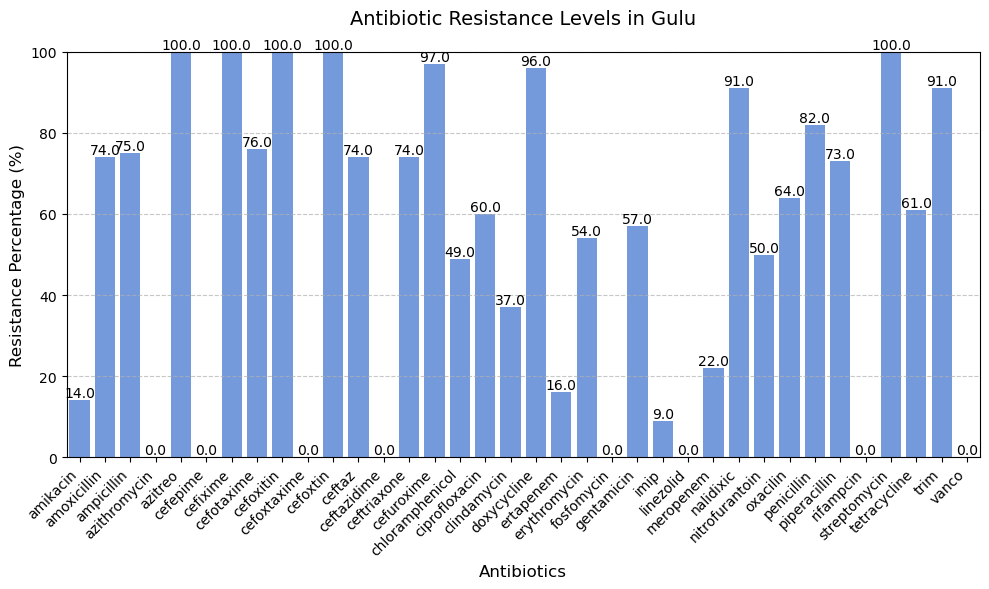

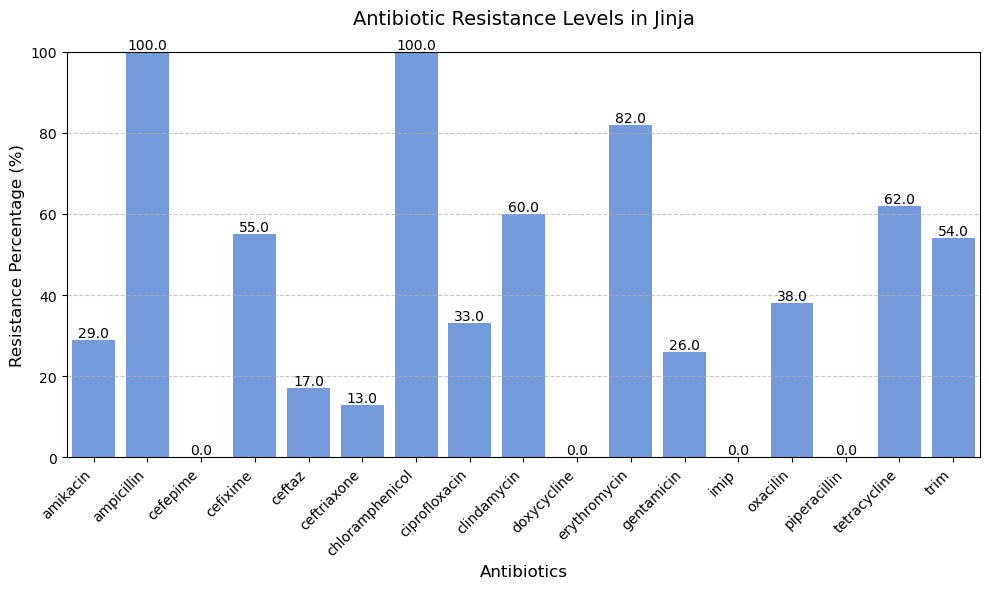

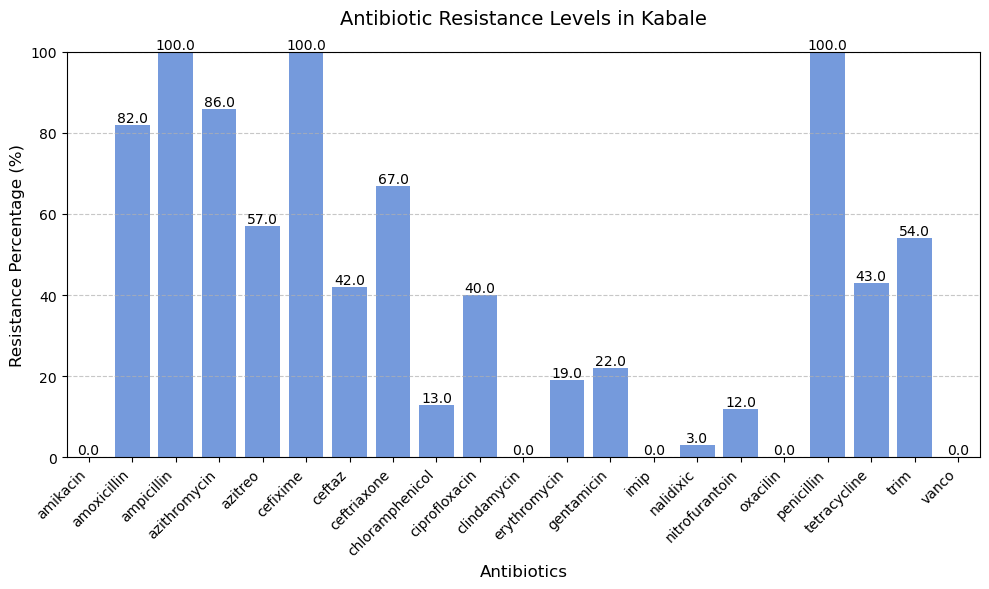

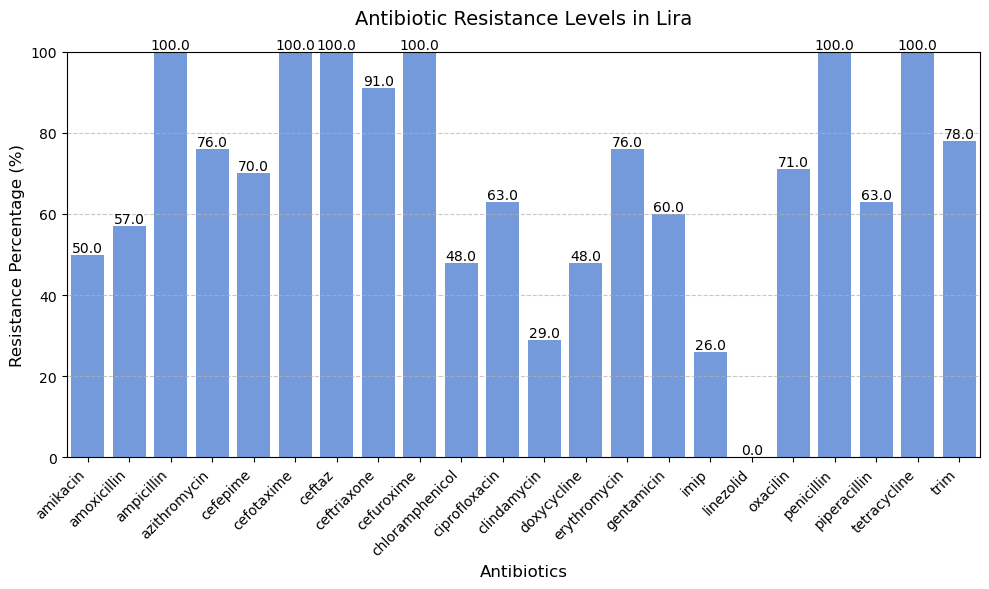

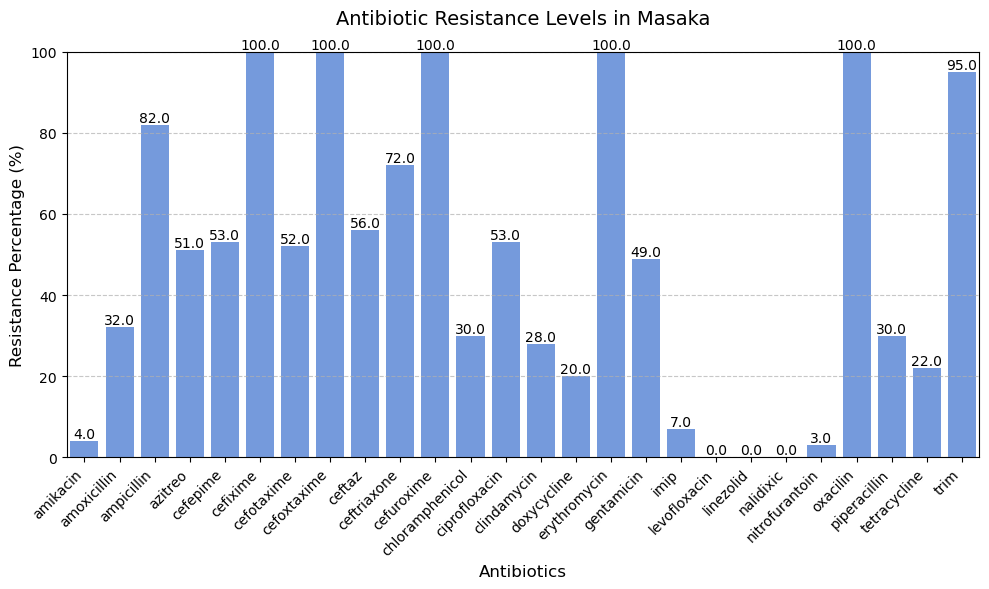

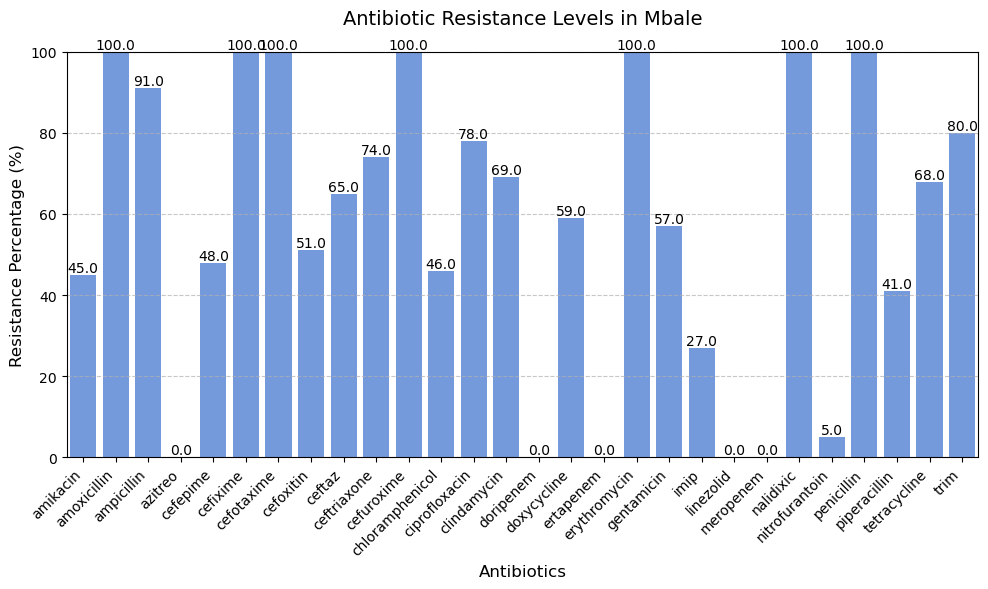

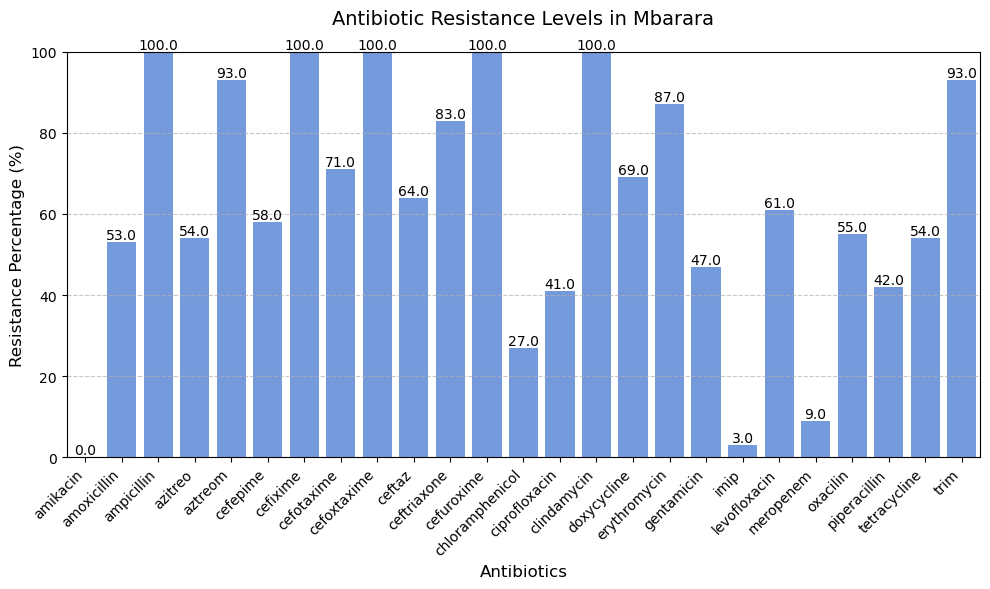

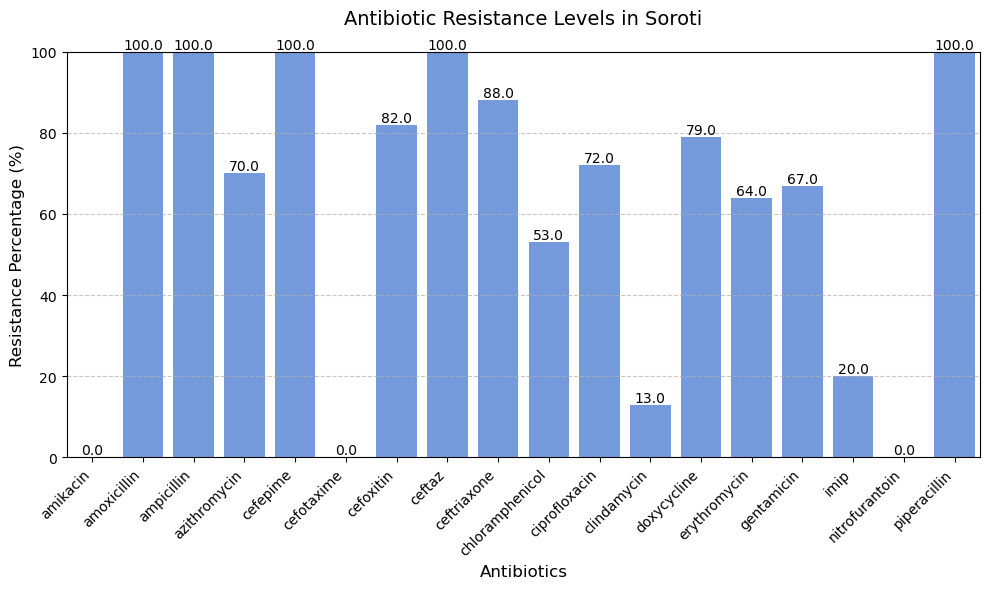

In [103]:
def create_individual_resistance_plots(summary):
    """
    Creates individual resistance plots for each hospital.
    Returns a list of figure objects.
    """
    figures = []
    hospitals = summary['name_of_rrh'].unique()
    
    for hospital in hospitals:
        # Filter data for current hospital
        hospital_data = summary[summary['name_of_rrh'] == hospital]
        
        # Create new figure for this hospital
        fig, ax = plt.subplots(figsize=(10, 6))
        
        # Create bar plot
        sns.barplot(x='Antibiotic', y='%R', data=hospital_data, 
                   color='cornflowerblue', ax=ax)
        
        # Add value labels on top of bars
        ax.bar_label(ax.containers[0], fmt='%.1f', fontsize=10)
        
        # Customize plot
        ax.set_title(f'Antibiotic Resistance Levels in {hospital}', 
                    pad=20, fontsize=14)
        ax.set_xlabel('Antibiotics', fontsize=12)
        ax.set_ylabel('Resistance Percentage (%)', fontsize=12)
        ax.set_ylim(0, 100)
        
        # Rotate x-axis labels
        plt.xticks(rotation=45, ha='right')
        
        # Add grid lines for better readability
        ax.yaxis.grid(True, linestyle='--', alpha=0.7)
        
        # Tight layout to prevent label cutoff
        plt.tight_layout()
        
        # Append figure to list
        figures.append(fig)
    
    return figures

def save_individual_plots(summary, output_dir='resistance_plots'):
    """
    Creates and saves individual plots to specified directory.
    """
    import os
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Generate plots
    figures = create_individual_resistance_plots(summary)
    
    # Save each figure
    hospitals = summary['name_of_rrh'].unique()
    for hospital, fig in zip(hospitals, figures):
        filename = os.path.join(output_dir, f'{hospital}_resistance.png')
        fig.savefig(filename, dpi=300, bbox_inches='tight')
        plt.close(fig)  # Close figure to free memory

figures = create_individual_resistance_plots(summary)
plt.show()

# To save plots to files:
# save_individual_plots(summary, 'output_directory')

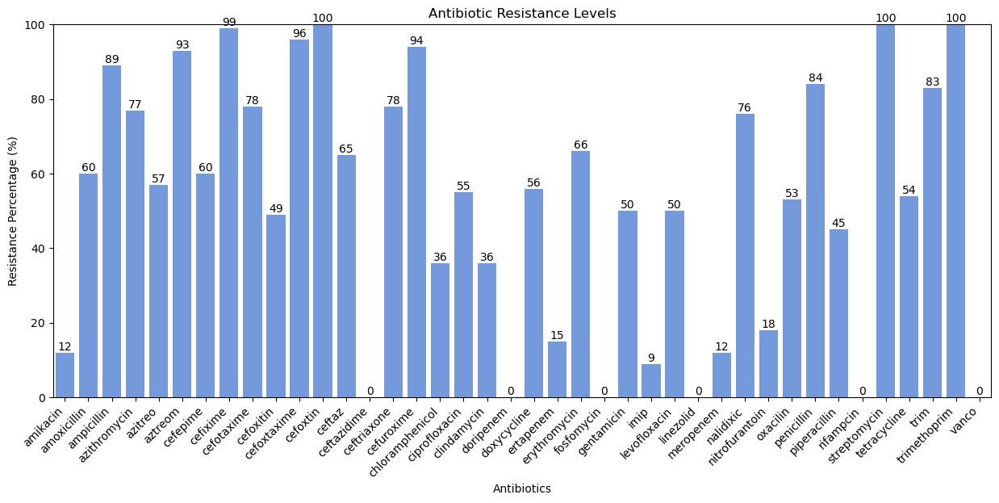

In [71]:
# Set figure size and adjust based on your needs
plt.figure(figsize=(15, 6))

# Create a bar chart 
ax = sns.barplot(x='Antibiotic', y='%R', data=summary, color='cornflowerblue')
ax.bar_label(ax.containers[0], fontsize=10)

# Customize plot elements
plt.title('Antibiotic Resistance Levels')
plt.xlabel('Antibiotics')
plt.ylabel('Resistance Percentage (%)')

# Set y-axis limits to 0 to 100
plt.ylim(0, 100) 

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.show()

In [72]:
# Initialize an empty list to store results
summary_list = []

# Get unique pathogens
unique_pathogens = merged_data['Pathogen'].unique()

# Loop through each pathogen and compute resistance statistics
for pathogen in unique_pathogens:
    pathogen_data = merged_data[merged_data['Pathogen'] == pathogen]

    # Group and count occurrences
    pathogen_summary = pathogen_data.groupby(['Antibiotic', 'Usage']).size().unstack(fill_value=0)

    # Ensure all expected columns exist
    for col in ['I', 'R', 'S']:
        if col not in pathogen_summary:
            pathogen_summary[col] = 0

    # Compute totals and %R
    pathogen_summary['I+R+S'] = pathogen_summary['I'] + pathogen_summary['R'] + pathogen_summary['S']
    pathogen_summary['%R'] = (pathogen_summary['R'] / pathogen_summary['I+R+S'] * 100).round(2)

    # Add pathogen name as a column
    pathogen_summary['Pathogen'] = pathogen

    # Reset index and append to list
    summary_list.append(pathogen_summary.reset_index())

# Combine all pathogen summaries into a single DataFrame
final_summary = pd.concat(summary_list, ignore_index=True)

# Display the final summary
final_summary.head()

final_summary.to_csv('Pathogen_resistane.csv', index =False)

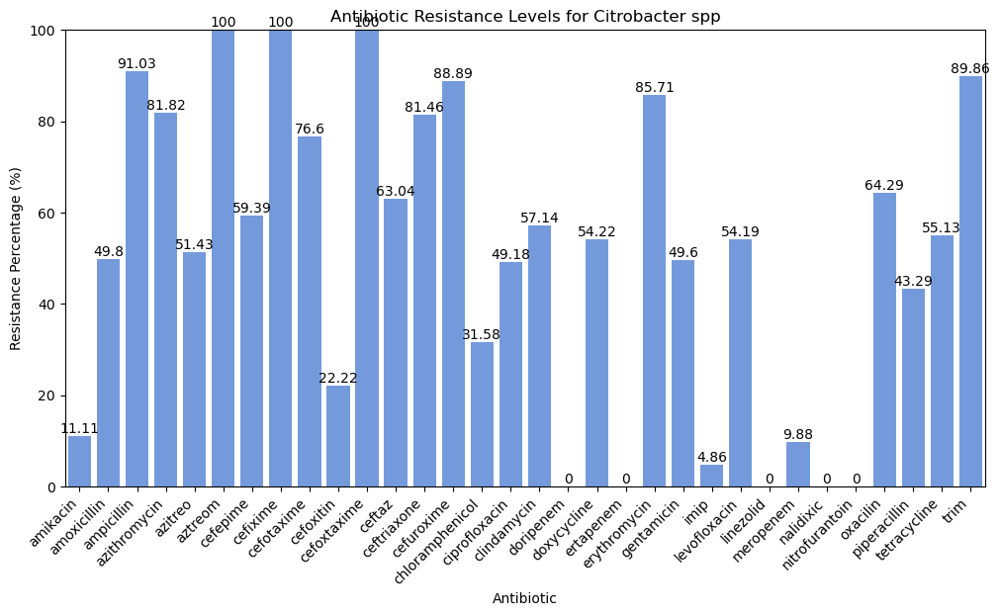

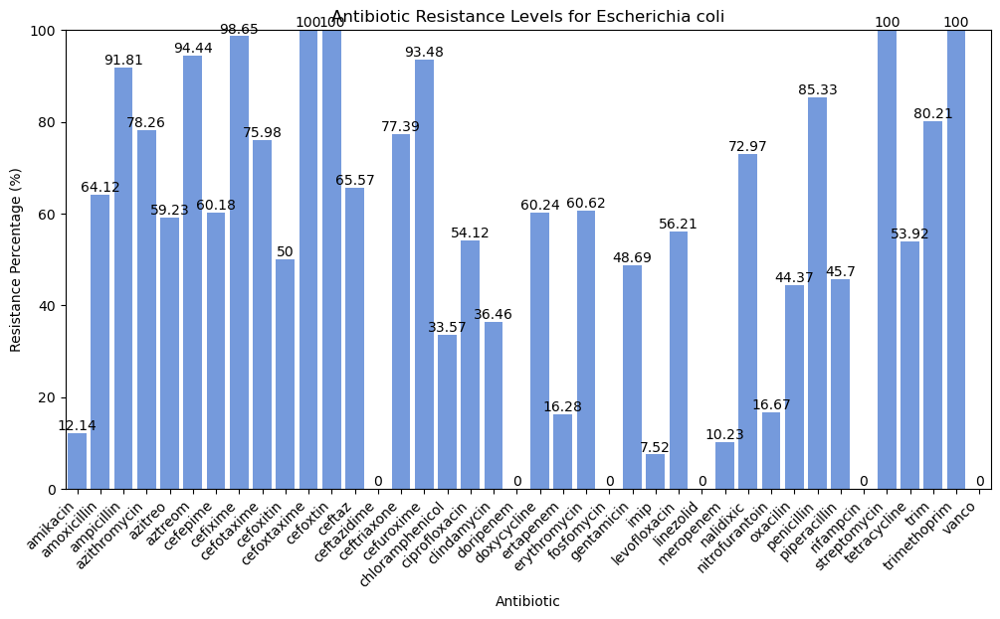

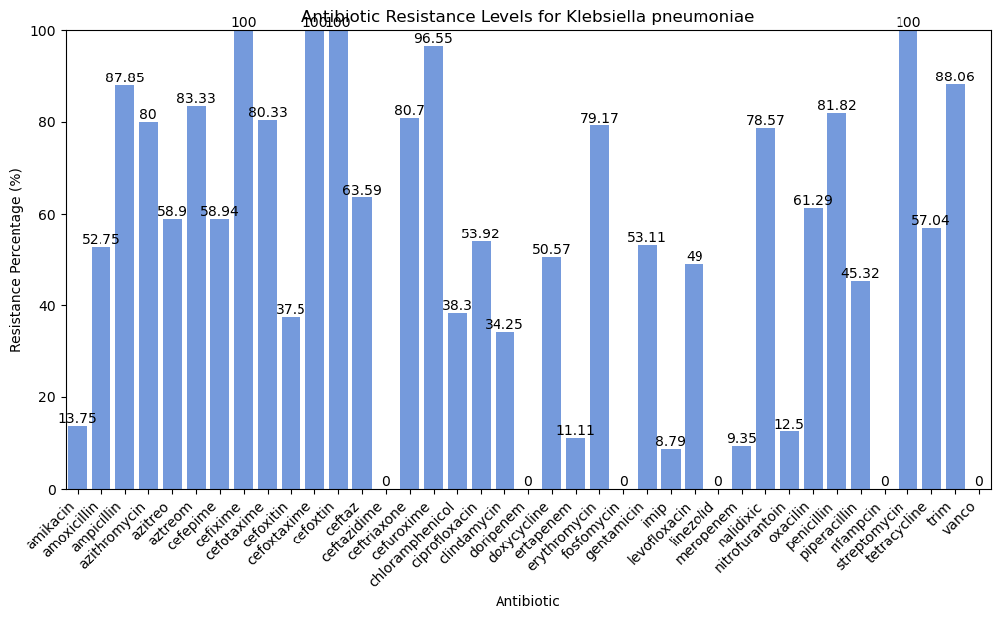

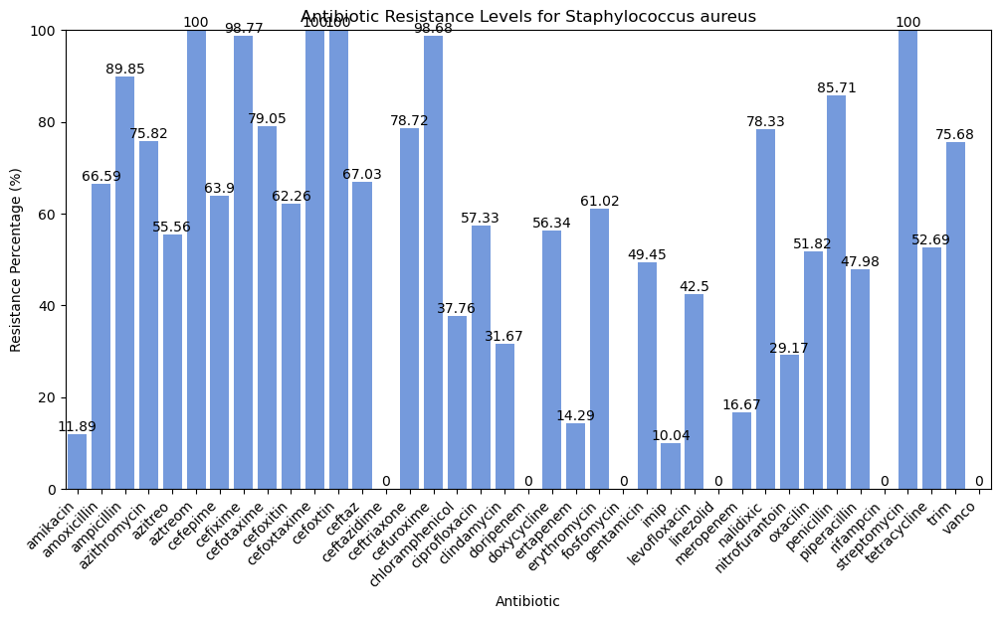

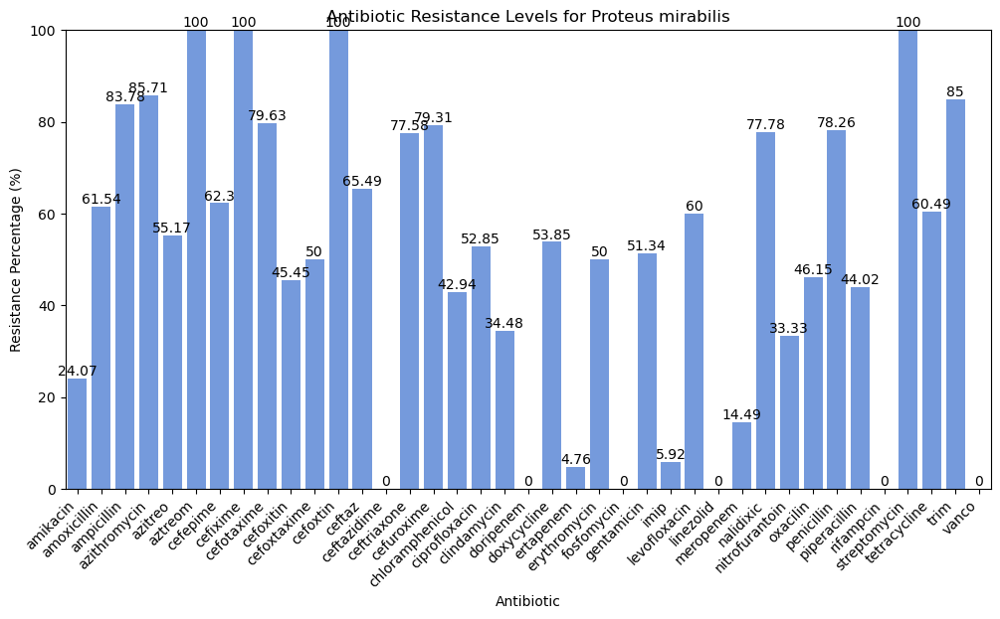

...

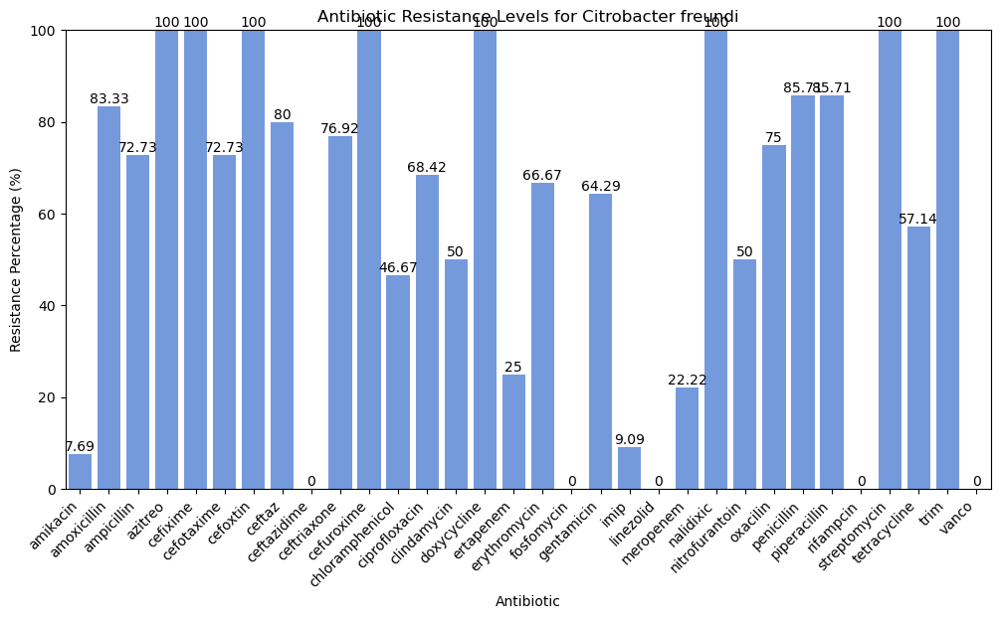

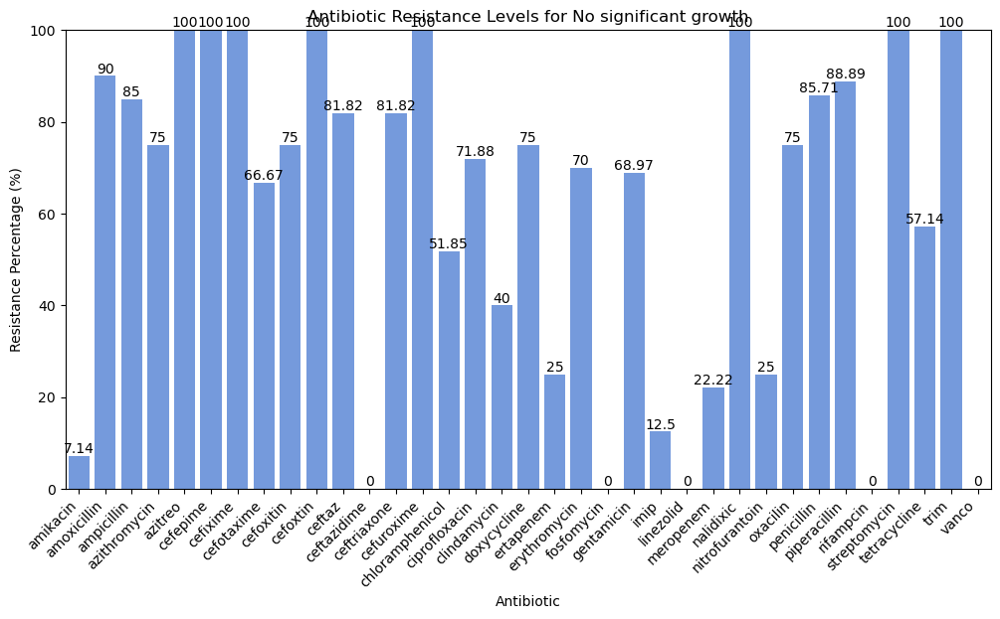

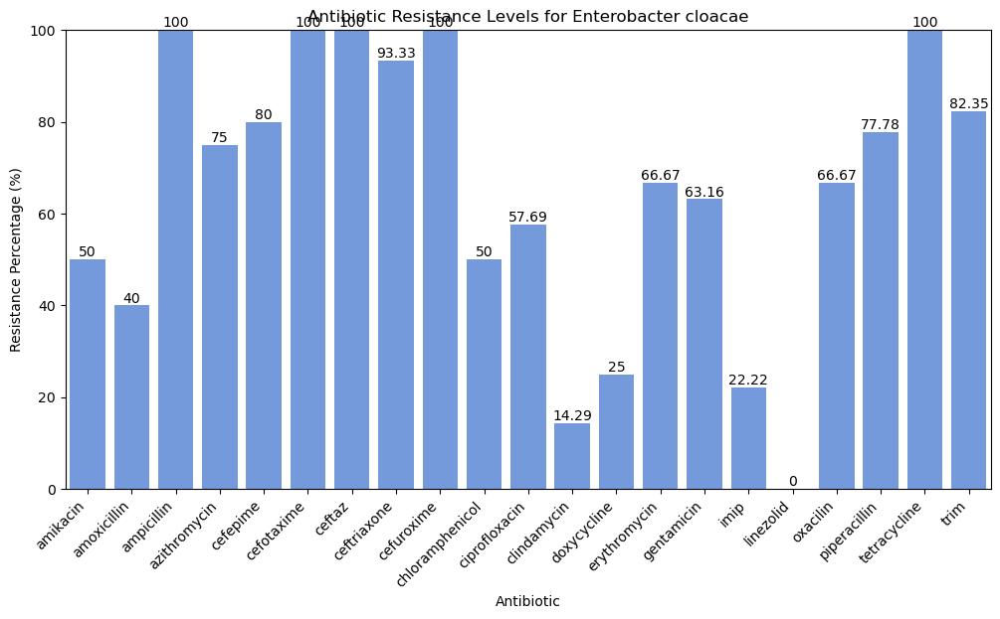

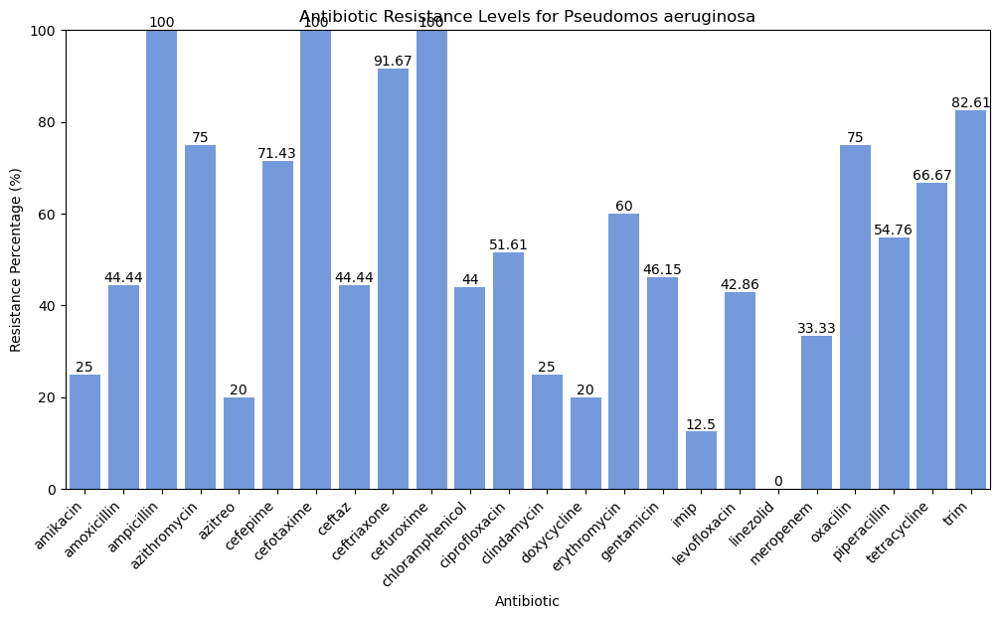

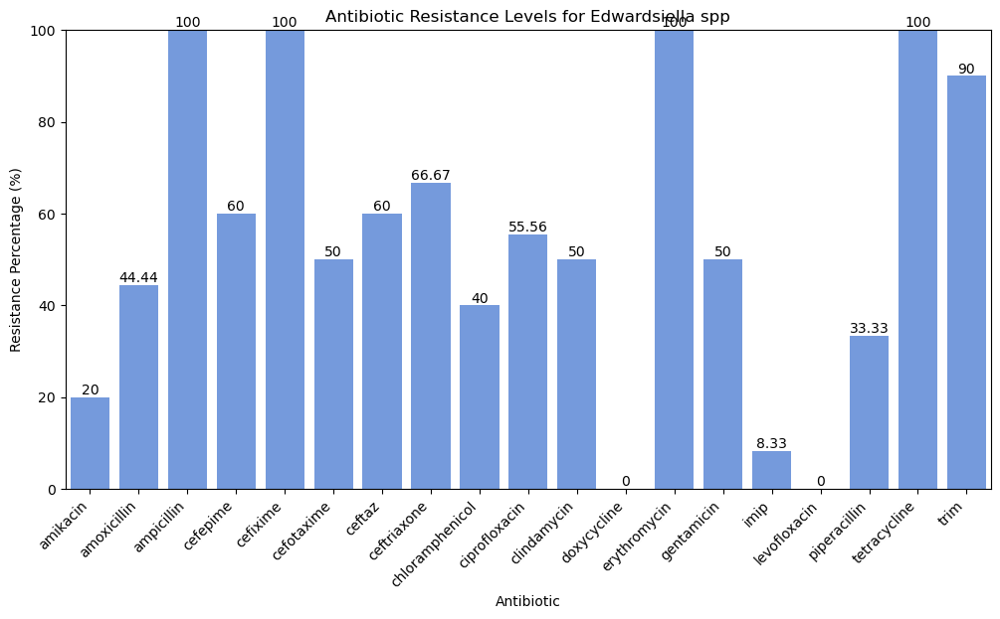

In [73]:
# Get unique pathogens
unique_pathogens = merged_data['Pathogen'].unique()

# Loop through each pathogen and generate a resistance plot
for pathogen in unique_pathogens:
    pathogen_data = merged_data[merged_data['Pathogen'] == pathogen]

    # Group and count occurrences
    pathogen_summary = pathogen_data.groupby(['Antibiotic', 'Usage']).size().unstack(fill_value=0)

    # Ensure columns exist
    for col in ['I', 'R', 'S']:
        if col not in pathogen_summary:
            pathogen_summary[col] = 0

    # Compute totals and %R
    pathogen_summary['I+R+S'] = pathogen_summary['I'] + pathogen_summary['R'] + pathogen_summary['S']
    pathogen_summary['%R'] = (pathogen_summary['R'] / pathogen_summary['I+R+S'] * 100).round(2)

    # Reset index
    pathogen_summary = pathogen_summary.reset_index()

    # Plot
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x='Antibiotic', y='%R', data=pathogen_summary, color='cornflowerblue')
    ax.bar_label(ax.containers[0], fontsize=10)

    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Antibiotic")
    plt.ylabel("Resistance Percentage (%)")
    plt.title(f"Antibiotic Resistance Levels for {pathogen}")
    plt.ylim(0, 100)

    # Show the plot
    plt.show()


In [74]:
pathogen_summary.head()

Usage,Antibiotic,I,R,S,I+R+S,%R
0,amikacin,0,1,4,5,20.00
1,amoxicillin,2,4,3,9,44.44
2,ampicillin,0,6,0,6,100.00
3,cefepime,0,3,2,5,60.00
4,cefixime,0,1,0,1,100.00


/tmp/ipykernel_3736/3790724174.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3736/3790724174.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3736/3790724174.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3736/3790724174.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_3736/3790724174.py:46: UserWarning: set_ticklabel

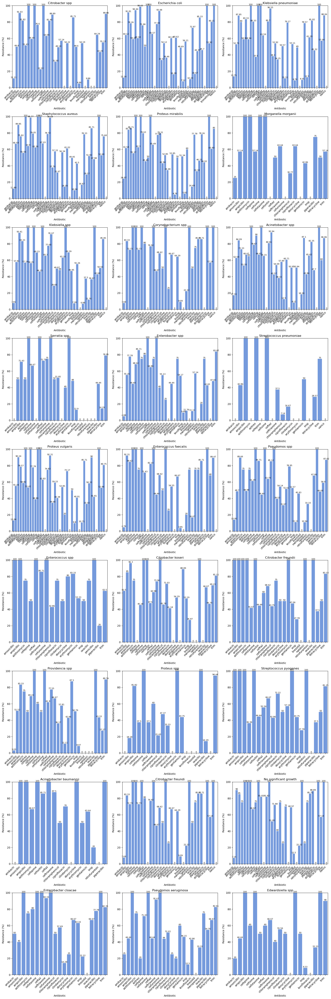

In [75]:
import math
# Get unique pathogens
unique_pathogens = merged_data['Pathogen'].unique()
num_pathogens = len(unique_pathogens)

# Define number of columns and rows
cols = 3
rows = math.ceil(num_pathogens / cols)

# Create a figure with a grid of subplots
fig, axs = plt.subplots(rows, cols, figsize=(cols * 6, rows * 6))  # adjust figure size as needed

# In case axs is a 2D array, but if rows==1, it might be 1D. Make sure to handle that:
if rows == 1:
    axs = [axs]

# Flatten the axs array for easier indexing
axs = axs.flat

for ax_idx, pathogen in enumerate(unique_pathogens):
    # Filter data for the current pathogen
    pathogen_data = merged_data[merged_data['Pathogen'] == pathogen]

    # Group and count occurrences
    pathogen_summary = pathogen_data.groupby(['Antibiotic', 'Usage']).size().unstack(fill_value=0)

    # Ensure columns exist
    for col in ['I', 'R', 'S']:
        if col not in pathogen_summary:
            pathogen_summary[col] = 0

    # Compute totals and %R
    pathogen_summary['I+R+S'] = pathogen_summary['I'] + pathogen_summary['R'] + pathogen_summary['S']
    pathogen_summary['%R'] = (pathogen_summary['R'] / pathogen_summary['I+R+S'] * 100).round(2)

    # Reset index for plotting
    pathogen_summary = pathogen_summary.reset_index()

    # Plot on the designated subplot axis
    ax = axs[ax_idx]
    barplot = sns.barplot(x='Antibiotic', y='%R', data=pathogen_summary, color='cornflowerblue', ax=ax)
    # Add labels on top of bars
    ax.bar_label(ax.containers[0], fontsize=8)
    
    # Rotate x-axis labels and set title
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel("Antibiotic")
    ax.set_ylabel("Resistance (%)")
    ax.set_title(f"{pathogen}")
    ax.set_ylim(0, 100)

# If there are any empty subplots, remove them
for j in range(ax_idx + 1, rows * cols):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

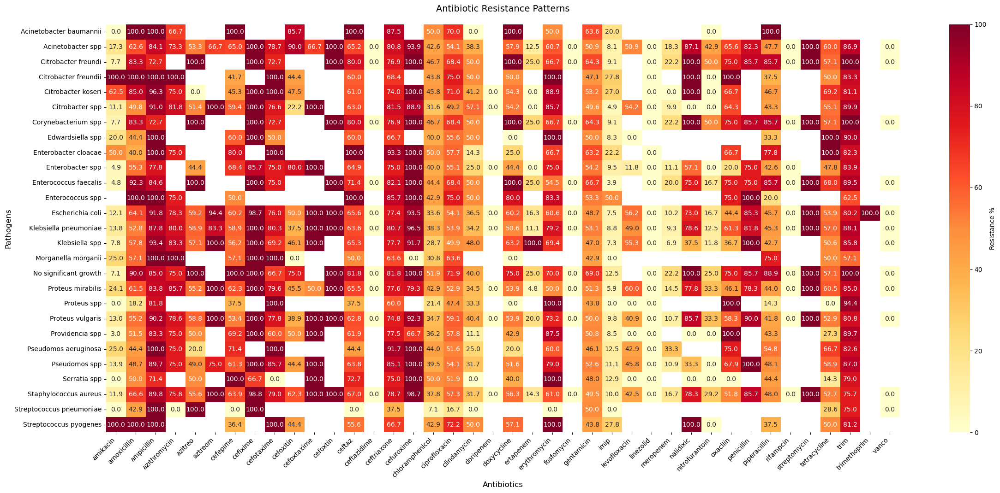

In [92]:

def process_resistance_data(file_path=None, data=None):
    """
    Process antibiotic resistance data either from a file or direct data input.
    Returns a DataFrame suitable for heatmap visualization.
    """
    df = data
    
    # Ensure proper column names
    required_cols = ['Antibiotic', 'Pathogen', '%R']
    if not all(col in df.columns for col in required_cols):
        df.columns = ['Antibiotic', 'Pathogen', 'I', 'R', 'S', 'I+R+S', '%R']
    
    # Create pivot table for heatmap
    pivot_df = df.pivot(index='Pathogen', columns='Antibiotic', values='%R')
    return pivot_df

def create_resistance_heatmap(data_matrix, title="Antibiotic Resistance Patterns"):
    """
    Create a heatmap visualization of antibiotic resistance patterns.
    """
    # Set up the figure size based on data dimensions
    plt.figure(figsize=(max(12, data_matrix.shape[1]*0.6), max(8, data_matrix.shape[0]*0.4)))
    
    # Create heatmap
    sns.heatmap(data_matrix,
                annot=True,              # Show values in cells
                fmt='.1f',               # Format to 1 decimal place
                cmap='YlOrRd',           # Yellow-Orange-Red colormap
                cbar_kws={'label': 'Resistance %'},
                square=False,            # Rectangular cells for better space usage
                center=50,               # Center the colormap at 50%
                vmin=0,                  # Minimum value for color scale
                vmax=100)                # Maximum value for color scale
    
    # Customize appearance
    plt.title(title, pad=20, size=14)
    plt.xlabel('Antibiotics', size=12)
    plt.ylabel('Pathogens', size=12)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    return plt.gcf()

# Example usage with your data
data = final_summary
# Process data
resistance_matrix = process_resistance_data(data=data)

# Create and display heatmap
plt.close('all')  # Clear any existing plots
fig = create_resistance_heatmap(resistance_matrix)
plt.show()

# The script can also work with CSV files:
# resistance_matrix = process_resistance_data(file_path='your_data.csv')
# fig = create_resistance_heatmap(resistance_matrix)
# plt.show()

In [76]:
df.head()

,name_of_rrh,specimen_type,variable,Pathogen,original_antibiotic,Usage,Antibiotic
0,Arua,Wound swab,first_organism,Citrobacter spp,first_amoxicillin,S,amoxicillin
1,Arua,Wound swab,first_organism,Citrobacter spp,first_amoxicillin,R,amoxicillin
2,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
3,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin
4,Arua,Wound swab,first_organism,Citrobacter spp,first_ciprofloxacin,R,ciprofloxacin


In [77]:
df =data1

# Count instances for each antibiotic
summary_spe = df.groupby(['name_of_rrh','specimen_type']).size().unstack(fill_value=0)

# # Ensure columns 'I', 'R', 'S' exist
# for col in ['I', 'R', 'S']:
#     if col not in summary:
#         summary[col] = 0

# # Compute totals and %R
# summary['I+R+S'] = summary['I'] + summary['R'] + summary['S']
# summary['%R'] = (summary['R'] / summary['I+R+S'] * 100).round(0)

# Reset index and format output
summary_spe = summary_spe.reset_index()

# summary.to_csv('spe.csv', index = False)

summary_spe.head()

specimen_type,name_of_rrh,Ascetic aspirate,Ascitic fluid,Blood,Cerebrospinal Fluid,Cystic fluid,Ear swab,Lower Respiratory Tract,Oral swab,Pus aspirate,Sputum,Synovial fluid,UNK,"Urethral, Cervical, Rectal and Pharyngeal Swabs",Urine,Wound swab
0,Arua,1,0,2,0,0,0,0,0,12,0,0,0,0,1,5
1,Gulu,1,0,0,1,0,2,0,0,18,0,1,0,1,0,13
2,Jinja,0,0,5,0,0,0,1,0,4,0,0,1,3,0,3
3,Kabale,1,0,3,1,0,0,0,0,19,4,0,1,1,9,1
4,Lira,0,0,0,2,0,3,0,0,17,1,0,0,1,0,25


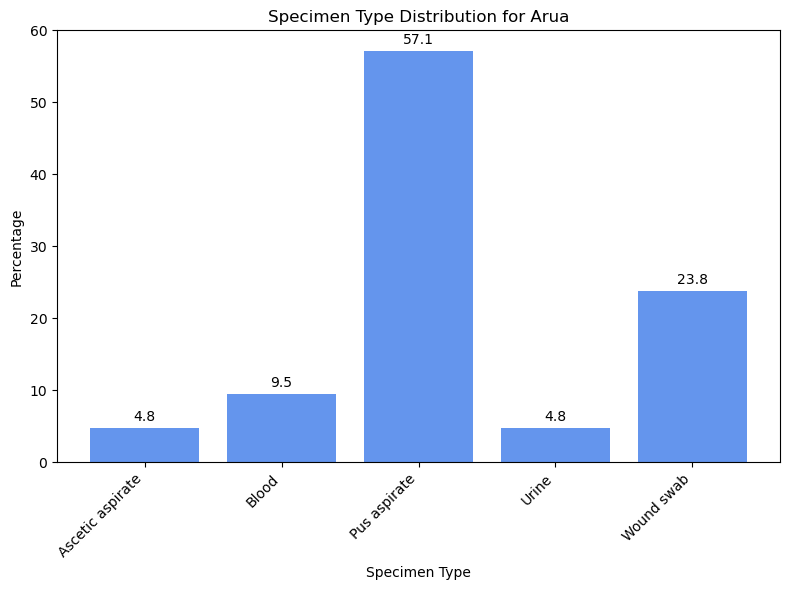

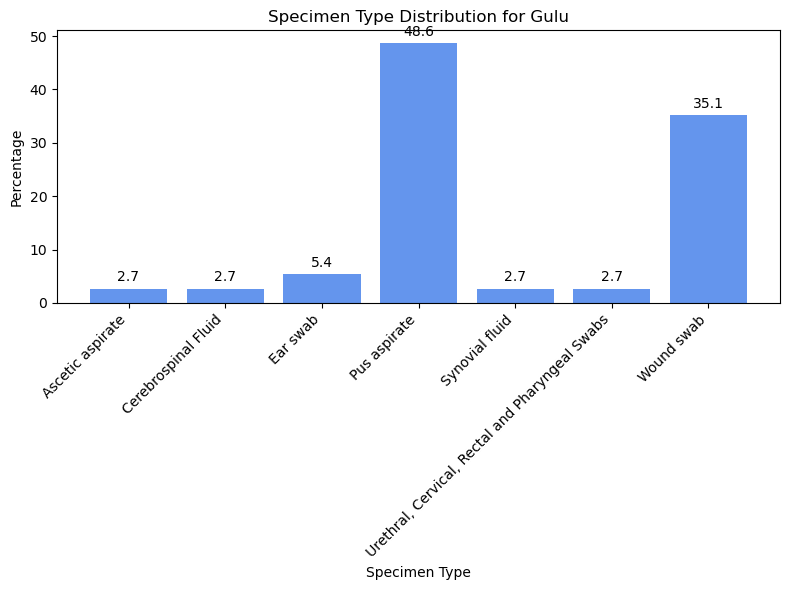

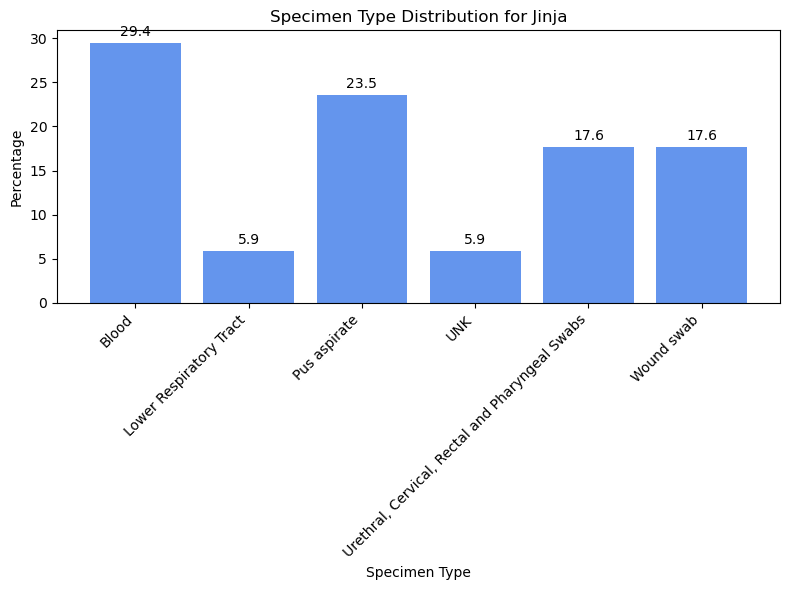

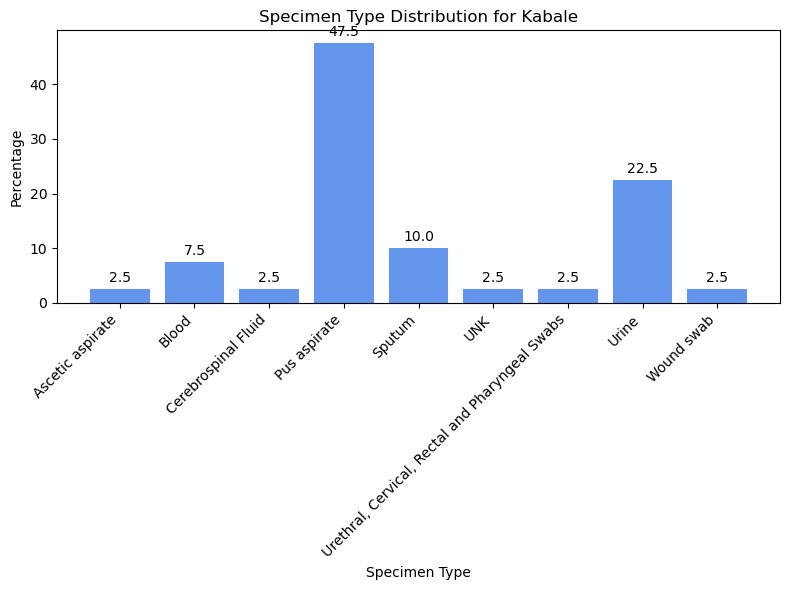

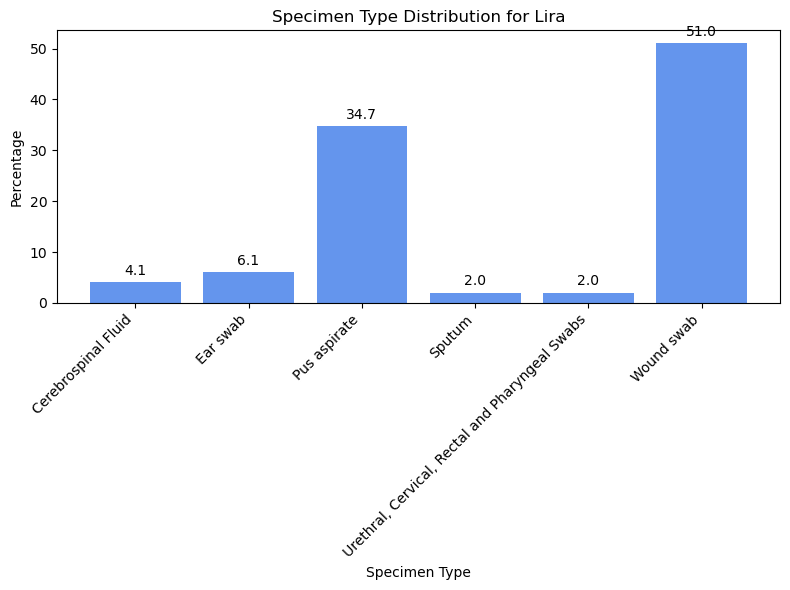

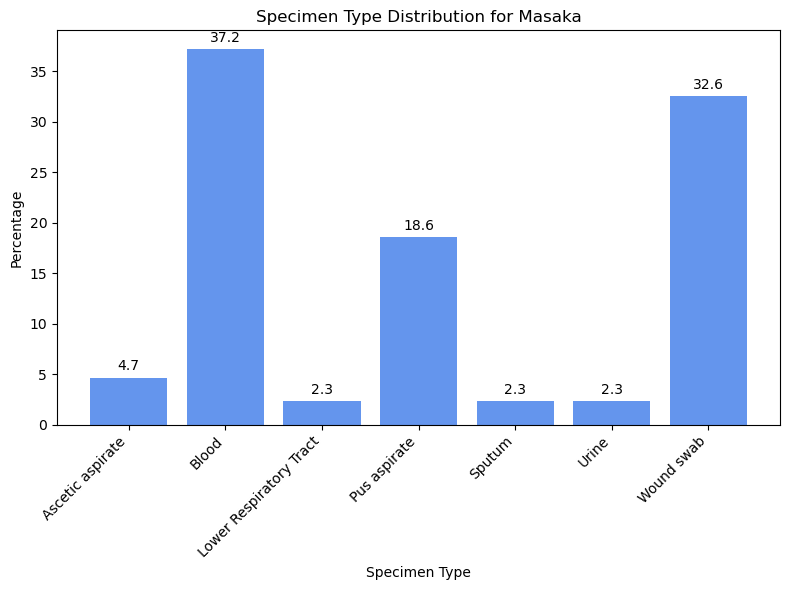

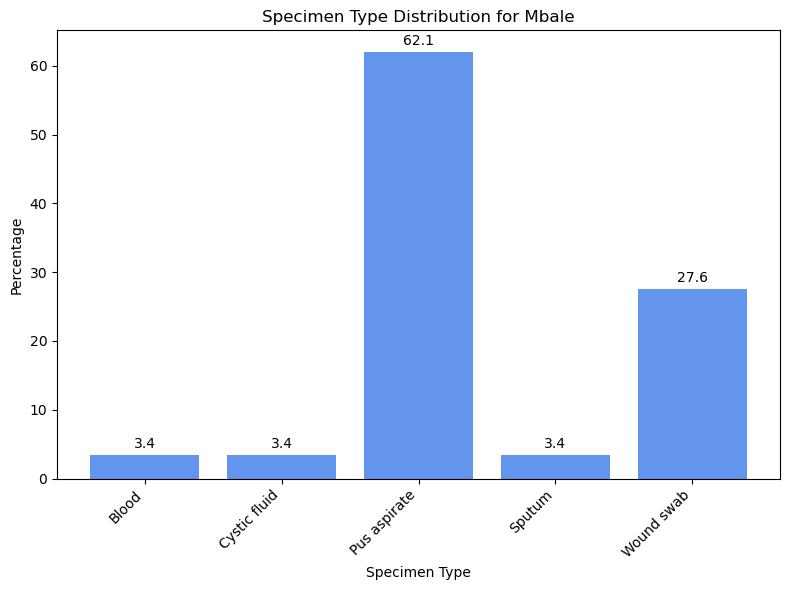

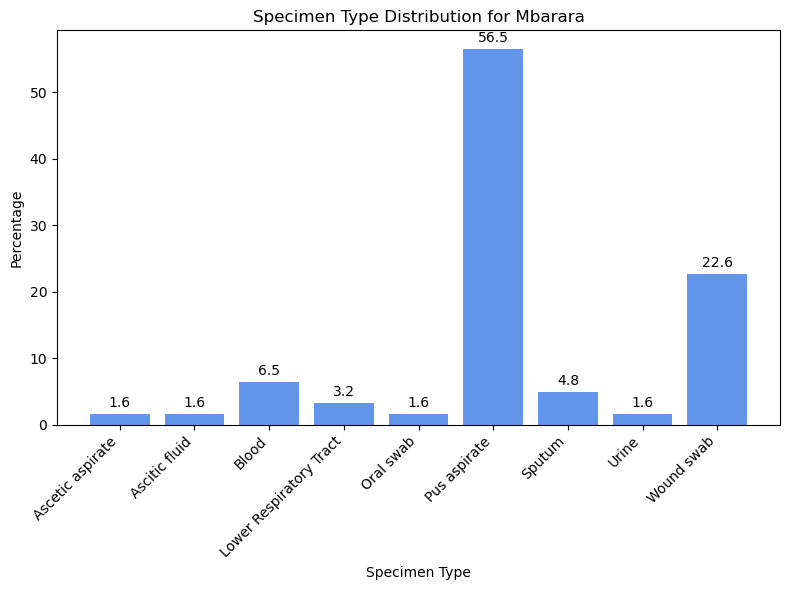

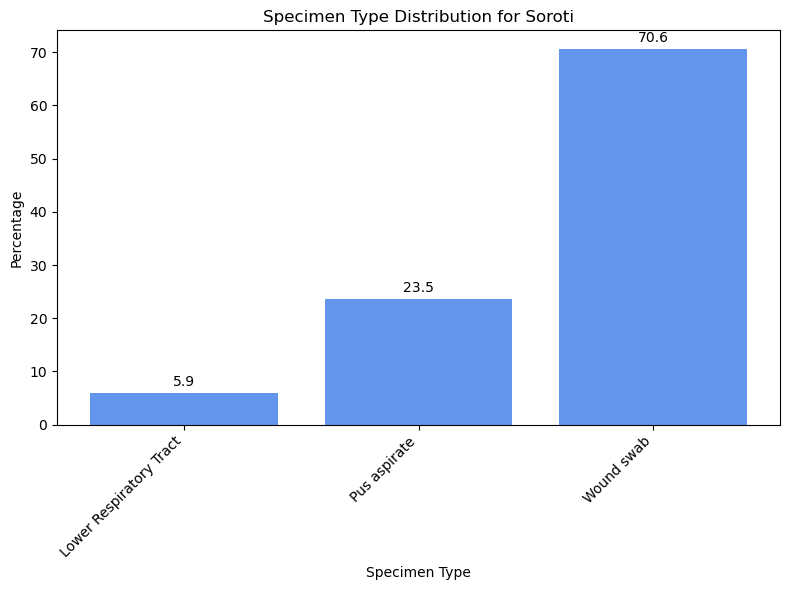

In [78]:
# Group by 'name_of_rrh' and 'specimen_type', then count occurrences
specimen_counts = data1.groupby(['name_of_rrh', 'specimen_type']).size().unstack(fill_value=0)

# Calculate percentages for each specimen type within each referral
specimen_percentages = specimen_counts.div(specimen_counts.sum(axis=1), axis=0) * 100

# Iterate through each referral and plot the specimen type percentages individually
for name_of_rrh, row in specimen_percentages.iterrows():
    # Filter out specimen types with a 0% percentage
    filtered = row[row != 0]
    
    # Create a new figure for each referral
    plt.figure(figsize=(8, 6))
    bars = plt.bar(filtered.index, filtered.values, color='cornflowerblue')
    
    # Add labels on the bars
    plt.bar_label(bars, fmt='%.1f', padding=3)
    
    # Set plot title and axis labels
    plt.title(f'Specimen Type Distribution for {name_of_rrh}')
    plt.xlabel('Specimen Type')
    plt.ylabel('Percentage')
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    # Display the figure
    plt.tight_layout()
    plt.show()


## Comobidities

In [79]:
#data.drop(columns = 'antib_presc_af_cul_Others', inplace = True)

# Get prio antibiotic use column names
comobidity = [col for col in data1.columns if col.startswith('cormobidities_')]

# More efficient method using apply
def get_comobidity(row):
    yes_sites = [col.replace('cormobidities_', "").replace('___', '') for col in comobidity if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Comobidity{i+1}' for i in range(len(yes_sites))])

new_data = data1.apply(get_comobidity, axis=1)
data1 = pd.concat([data1, new_data], axis=1)

data1.head()

,name_of_rrh,age,sex,hosp_48hrs,infect_site_Brain,infect_site_Lungs,infect_site_Gastro_intestil_tract,infect_site_Genito_uriry_tract,infect_site_Cardio_vascular,infect_site_Systemic,...,treatment_outcome,diag_death,diagnosis_at_discharge,date_death,date_at_discharge,date_referral,length_hosp_stay,Comobidity1,Comobidity2,Comobidity3
0,Arua,18.0,Male,Yes,No,No,No,No,No,No,...,Cured/recovered,NaN,Sepsis without septic shock,NaN,44972.0,NaN,0.0,NaN,NaN,NaN
1,Arua,17.0,Female,Yes,No,No,No,No,No,No,...,Cured/recovered,NaN,Puerperal sepsis,NaN,45208.0,NaN,10.0,hiv,NaN,NaN
2,Arua,29.0,Male,Yes,No,No,No,No,No,No,...,Cured/recovered,NaN,Diabetic foot ulcer,NaN,45257.0,NaN,69.0,diabetes,NaN,NaN
3,Arua,50.0,Female,Yes,No,No,No,No,No,No,...,Died,Ludwig’s angi,NaN,2024-03-11T00:00:00Z,NaN,NaN,5.0,NaN,NaN,NaN
4,Arua,30.0,Female,Yes,No,No,No,No,No,No,...,Clinical improvement / Recovering,NaN,"Fracture of femur, unspecified, Open wound of ...",NaN,45251.0,NaN,45.0,NaN,NaN,NaN


In [80]:
data1.to_csv('como.csv', index = False)

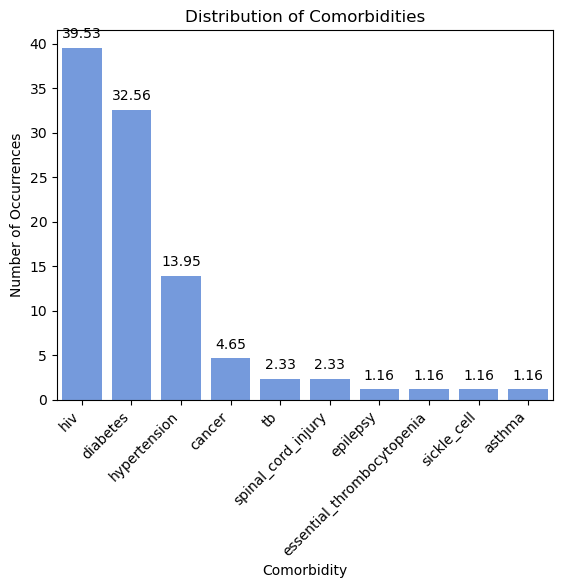

In [81]:
como = pd.melt(
    data1,
    id_vars= 'specimen_type',
    value_vars= ['Comobidity1', 'Comobidity2', 'Comobidity3'],
    value_name= 'Comobidity'
)

como.dropna(subset = ['Comobidity'], inplace = True)

como_count = como['Comobidity'].value_counts(normalize= True) * 100

ax = sns.barplot(x = como_count.index, y = como_count.values, color = 'cornflowerblue')

# Add labels and title
ax.set_xlabel('Comorbidity')
ax.set_ylabel('Number of Occurrences')
ax.set_title('Distribution of Comorbidities')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars with 2 decimal places
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.show()

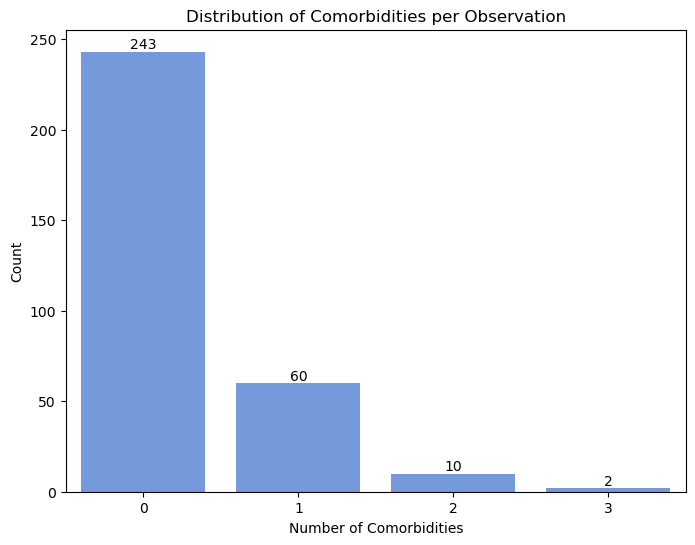

In [82]:
# Calculate the number of comorbidities per observation
data1['num_comorbidities'] = data1[['Comobidity1', 'Comobidity2', 'Comobidity3']].notna().sum(axis=1)

# Optionally, if you only care about those with 2 or 3 comorbidities, you can filter:
filtered_data = data1[data1['num_comorbidities'].isin([2, 3])]

# Count how many observations have each number of comorbidities
comorbidity_counts = data1['num_comorbidities'].value_counts().sort_index()

# Plot the distribution as a bar plot
plt.figure(figsize=(8, 6))
ax = sns.barplot(x=comorbidity_counts.index, y=comorbidity_counts.values, color='cornflowerblue')

# Add labels to the bars
ax.bar_label(ax.containers[0], fontsize=10)

# Customize the axes and title
ax.set_xlabel("Number of Comorbidities")
ax.set_ylabel("Count")
ax.set_title("Distribution of Comorbidities per Observation")

plt.show()


## HIV

In [83]:
data['cormobid_condition'].value_counts()

cormobid_condition
No     242
Yes     73
Name: count, dtype: int64

<Axes: xlabel='cormobid_condition', ylabel='length_hosp_stay'>

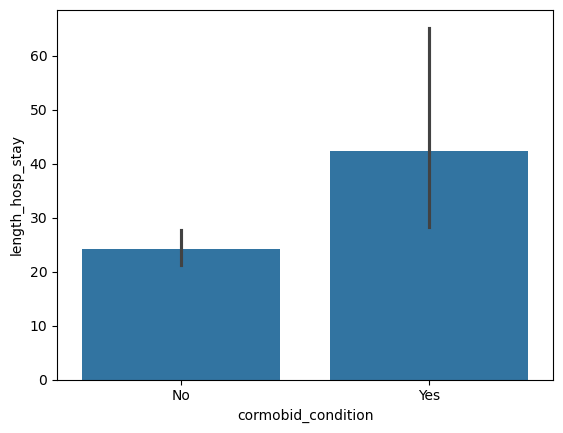

In [84]:
sns.barplot(data = data1, y = 'length_hosp_stay', x = 'cormobid_condition')

<Axes: xlabel='cormobidities_hiv', ylabel='length_hosp_stay'>

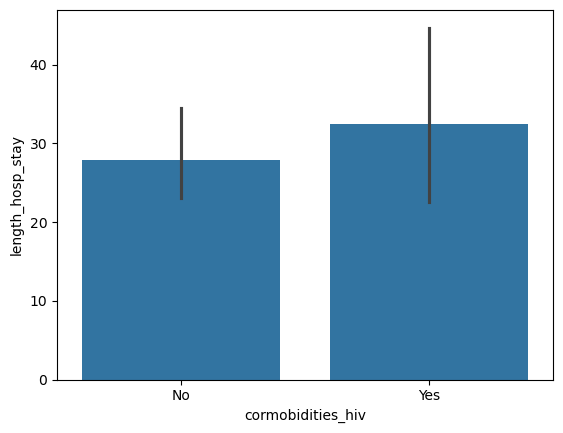

In [85]:
sns.barplot(data1, x ='cormobidities_hiv', y = 'length_hosp_stay')

<Axes: xlabel='length_hosp_stay', ylabel='Count'>

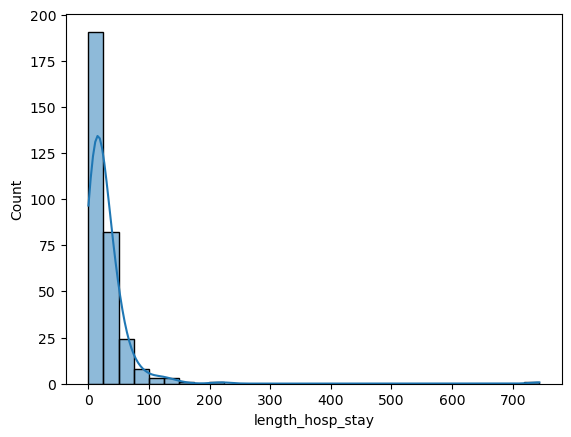

In [86]:
sns.histplot(data1, x = 'length_hosp_stay', kde = True, bins = 30)

<Axes: xlabel='cormobidities_hiv', ylabel='length_hosp_stay'>

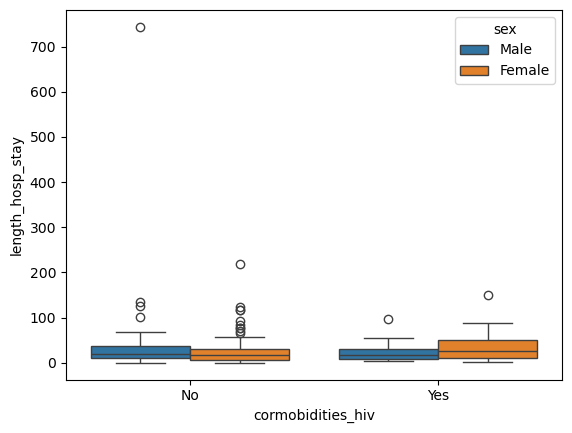

In [87]:
sns.boxplot(data1, x = 'cormobidities_hiv', y = 'length_hosp_stay', hue = 'sex')

In [88]:
hiv = data1[data1['cormobidities_hiv']=='Yes']

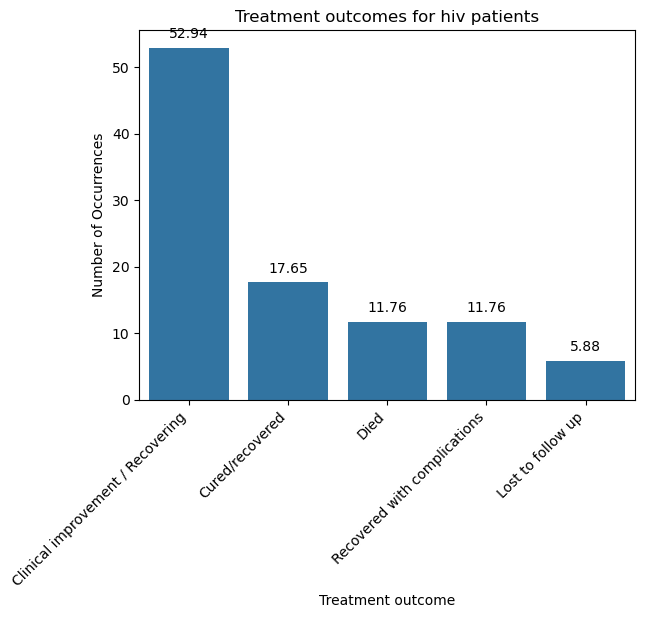

In [89]:
out_count = hiv['treatment_outcome'].value_counts(normalize = True) *100

ax= sns.barplot(x = out_count.index , y= out_count.values)

# Add labels and title
ax.set_xlabel('Treatment outcome')
ax.set_ylabel('Number of Occurrences')
ax.set_title('Treatment outcomes for hiv patients')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars with 2 decimal places
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.show()

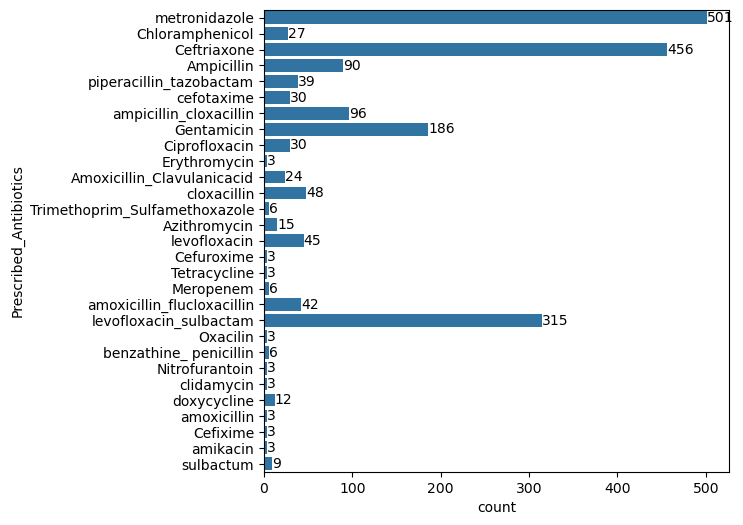

In [90]:
prescribed_anti_cols = [col for col in hiv.columns if col.startswith('antibiotics_prescribed_')]

# More efficient method using apply
def get_prescribed_antibiotic(row):
    yes_sites = [col.replace('antibiotics_prescribed_', "").replace('___', '') for col in prescribed_anti_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Prescribed_antib_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_prescribed_antibiotic, axis=1)
hiv = pd.concat([data, new_data], axis=1)


prescribed_antibiotics = pd.melt(
    hiv,
    id_vars = 'specimen_type',
    value_vars= ['Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5'],
    value_name= "Prescribed_Antibiotics"
)

prescribed_antibiotics.dropna(subset = ['Prescribed_Antibiotics'], inplace = True)


plt.figure(figsize = (6,6))

ax = sns.countplot(prescribed_antibiotics, y = 'Prescribed_Antibiotics')
ax.bar_label(ax.containers[0], fontsize = 10)

plt.show()

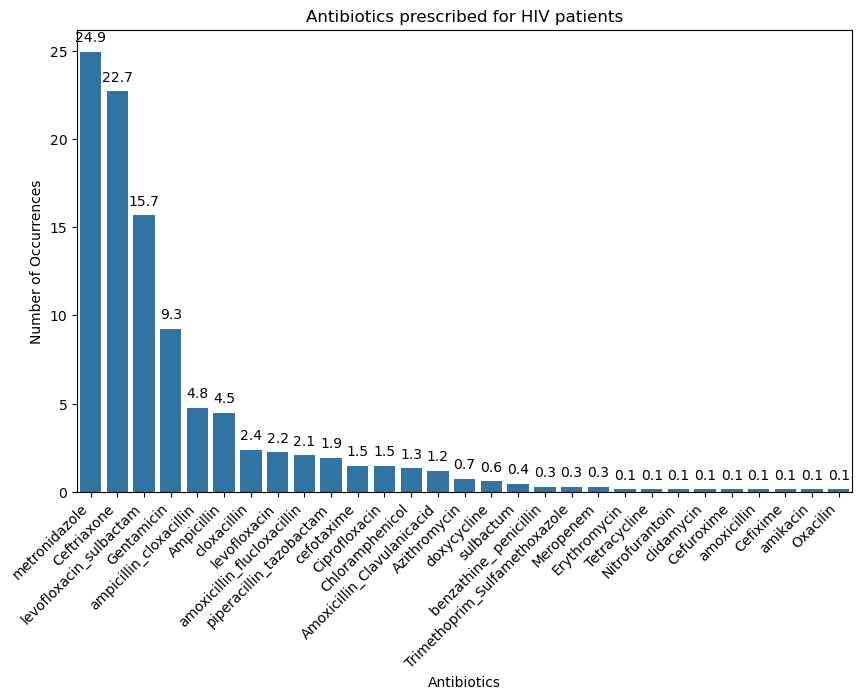

In [91]:
prescribed_anti_cols = [col for col in hiv.columns if col.startswith('antibiotics_prescribed_')]

# More efficient method using apply
def get_prescribed_antibiotic(row):
    yes_sites = [col.replace('antibiotics_prescribed_', "").replace('___', '') for col in prescribed_anti_cols if row[col] == 'Yes']
    return pd.Series(yes_sites, index=[f'Prescribed_antib_{i+1}' for i in range(len(yes_sites))])

new_data = data.apply(get_prescribed_antibiotic, axis=1)
hiv = pd.concat([data, new_data], axis=1)


prescribed_antibiotics = pd.melt(
    hiv,
    id_vars = 'specimen_type',
    value_vars= ['Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5'],
    value_name= "Prescribed_Antibiotics"
)

prescribed_antibiotics.dropna(subset = ['Prescribed_Antibiotics'], inplace = True)

anti_count = prescribed_antibiotics['Prescribed_Antibiotics'].value_counts(normalize = True) * 100

plt.figure(figsize = (10,6))

ax = sns.barplot(x = anti_count.index, y = anti_count.values)
# Add labels and title
ax.set_xlabel('Antibiotics')
ax.set_ylabel('Number of Occurrences')
ax.set_title('Antibiotics prescribed for HIV patients')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars with 2 decimal places
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', xytext=(0, 5), textcoords='offset points', fontsize=10)

plt.show()